##### Durability of Immunity against reinfection of SARS-CoV-2

##### Author: Sangeetha Vijayam
##### Reviwer: Jeffrey P. Townsend, Alex Dornburg, Hayley B. Hassler
##### Date: 10/11/2022

####### Edridge et al. full dataset

####### Input Data: updated_interp_OD _filev7.csv contains processed N IgG antibodies converted to S IgG antibodies from the supplementary dataset of Edridge et al. 2020, "Seasonal coronavirus protective immunity is short-lasting", Nature Medicine. using a linear regression model of N and S IgG antibody data from Gudbjartsson et al. 2020, "Humoral Immune Response to SARS-CoV-2 in Iceland", New England Journal of Medicine.

##### 1. Import and get header data

In [1]:
import pandas as pd
import numpy
from datetime import datetime
import math

### Need to change the file 
inputFile = "updated_OD_filev7_org.csv"

df2 = pd.read_csv(inputFile)

print(df2)

      Unnamed: 0     X      Date      Virus  OD_value     V4     V5        V6  \
0              1     1   8/20/85       229E  0.614941  False    NaN       NaN   
1              1     2  11/18/85       229E  0.870174  False   90.0  0.002836   
2              1     3   2/14/86       229E  0.709271  False   88.0 -0.001828   
3              1     4   5/29/86       229E  0.617718  False  104.0 -0.000880   
4              1     5    9/5/86       229E  0.698786  False   99.0  0.000819   
...          ...   ...       ...        ...       ...    ...    ...       ...   
3033          10  3034   2/21/86  SOSIP_HIV  0.854123  False   91.0 -0.001696   
3034          10  3035   5/23/86  SOSIP_HIV  0.805457  False   91.0 -0.000535   
3035          10  3036   8/11/86  SOSIP_HIV  0.909822  False   80.0  0.001305   
3036          10  3037  11/13/86  SOSIP_HIV  1.050687  False   94.0  0.001499   
3037          10  3038   2/24/87  SOSIP_HIV  0.981110    NaN  103.0 -0.000676   

            V8        V9  


In [2]:
headers = list(df2.head(0))
headers

['Unnamed: 0', 'X', 'Date', 'Virus', 'OD_value', 'V4', 'V5', 'V6', 'V8', 'V9']

##### Take dataset without headers

In [3]:
noheaderdataset0 = pd.read_csv(inputFile).iloc[0:]
noheaderdataset0

,Unnamed: 0,X,Date,Virus,OD_value,V4,V5,V6,V8,V9
0,1,1,8/20/85,229E,0.614941,False,NaN,NaN,0.149344,NaN
1,1,2,11/18/85,229E,0.870174,False,90.0,0.002836,0.211330,0.000689
2,1,3,2/14/86,229E,0.709271,False,88.0,-0.001828,0.172253,-0.000444
3,1,4,5/29/86,229E,0.617718,False,104.0,-0.000880,0.150019,-0.000214
4,1,5,9/5/86,229E,0.698786,False,99.0,0.000819,0.169707,0.000199
...,...,...,...,...,...,...,...,...,...,...
3033,10,3034,2/21/86,SOSIP_HIV,0.854123,False,91.0,-0.001696,0.630368,-0.001252
3034,10,3035,5/23/86,SOSIP_HIV,0.805457,False,91.0,-0.000535,0.594452,-0.000395
3035,10,3036,8/11/86,SOSIP_HIV,0.909822,False,80.0,0.001305,0.671476,0.000963
3036,10,3037,11/13/86,SOSIP_HIV,1.050687,False,94.0,0.001499,0.775439,0.001106


##### Remove Rowws only with NaN => "NA:"

In [4]:
noheaderdataset = noheaderdataset0.dropna(axis = 0, how ='all')
noheaderdataset

,Unnamed: 0,X,Date,Virus,OD_value,V4,V5,V6,V8,V9
0,1,1,8/20/85,229E,0.614941,False,NaN,NaN,0.149344,NaN
1,1,2,11/18/85,229E,0.870174,False,90.0,0.002836,0.211330,0.000689
2,1,3,2/14/86,229E,0.709271,False,88.0,-0.001828,0.172253,-0.000444
3,1,4,5/29/86,229E,0.617718,False,104.0,-0.000880,0.150019,-0.000214
4,1,5,9/5/86,229E,0.698786,False,99.0,0.000819,0.169707,0.000199
...,...,...,...,...,...,...,...,...,...,...
3033,10,3034,2/21/86,SOSIP_HIV,0.854123,False,91.0,-0.001696,0.630368,-0.001252
3034,10,3035,5/23/86,SOSIP_HIV,0.805457,False,91.0,-0.000535,0.594452,-0.000395
3035,10,3036,8/11/86,SOSIP_HIV,0.909822,False,80.0,0.001305,0.671476,0.000963
3036,10,3037,11/13/86,SOSIP_HIV,1.050687,False,94.0,0.001499,0.775439,0.001106


In [5]:
print(len(noheaderdataset))

3038


In [6]:
fulldataset = numpy.transpose(noheaderdataset) 

fulldataset

,0,1,2,3,4,5,6,7,8,9,...,3028,3029,3030,3031,3032,3033,3034,3035,3036,3037
Unnamed: 0,1,1,1,1,1,1,1,1,1,1,...,10,10,10,10,10,10,10,10,10,10
X,1,2,3,4,5,6,7,8,9,10,...,3029,3030,3031,3032,3033,3034,3035,3036,3037,3038
Date,8/20/85,11/18/85,2/14/86,5/29/86,9/5/86,11/26/86,3/4/87,6/1/87,8/20/87,11/19/87,...,3/21/11,4/24/85,5/23/85,8/23/85,11/22/85,2/21/86,5/23/86,8/11/86,11/13/86,2/24/87
Virus,229E,229E,229E,229E,229E,229E,229E,229E,229E,229E,...,SARS_CoV_2,SOSIP_HIV,SOSIP_HIV,SOSIP_HIV,SOSIP_HIV,SOSIP_HIV,SOSIP_HIV,SOSIP_HIV,SOSIP_HIV,SOSIP_HIV
OD_value,0.614941,0.870174,0.709271,0.617718,0.698786,0.762518,0.702607,1.97413,1.09826,1.00531,...,0.861376,0.92522,1.30295,1.27482,1.00848,0.854123,0.805457,0.909822,1.05069,0.98111
V4,False,False,False,False,False,False,False,False,False,False,...,NaN,False,False,False,False,False,False,False,False,NaN
V5,NaN,90,88,104,99,82,98,89,80,91,...,182,NaN,29,92,91,91,91,80,94,103
V6,NaN,0.00283593,-0.00182845,-0.000880309,0.000818863,0.000777221,-0.000611339,0.0142867,-0.0109483,-0.00102139,...,7.3e-05,NaN,0.0130252,-0.000305814,-0.00292672,-0.00169628,-0.000534789,0.00130457,0.00149856,-0.000675504
V8,0.149344,0.21133,0.172253,0.150019,0.169707,0.185185,0.170635,0.479436,0.266723,0.24415,...,0.64409,0.682841,0.961617,0.940853,0.744292,0.630368,0.594452,0.671476,0.775439,0.724089
V9,NaN,0.000688733,-0.000444057,-0.000213792,0.000198869,0.000188756,-0.00014847,0.00346967,-0.0026589,-0.000248054,...,5.46e-05,NaN,0.00961298,-0.0002257,-0.00216,-0.00125191,-0.00039469,0.00096281,0.00110598,-0.000498542


In [7]:
fulldataset = numpy.transpose(fulldataset) 

fulldataset

,Unnamed: 0,X,Date,Virus,OD_value,V4,V5,V6,V8,V9
0,1,1,8/20/85,229E,0.614941,False,NaN,NaN,0.149344,NaN
1,1,2,11/18/85,229E,0.870174,False,90,0.00283593,0.21133,0.000688733
2,1,3,2/14/86,229E,0.709271,False,88,-0.00182845,0.172253,-0.000444057
3,1,4,5/29/86,229E,0.617718,False,104,-0.000880309,0.150019,-0.000213792
4,1,5,9/5/86,229E,0.698786,False,99,0.000818863,0.169707,0.000198869
...,...,...,...,...,...,...,...,...,...,...
3033,10,3034,2/21/86,SOSIP_HIV,0.854123,False,91,-0.00169628,0.630368,-0.00125191
3034,10,3035,5/23/86,SOSIP_HIV,0.805457,False,91,-0.000534789,0.594452,-0.00039469
3035,10,3036,8/11/86,SOSIP_HIV,0.909822,False,80,0.00130457,0.671476,0.00096281
3036,10,3037,11/13/86,SOSIP_HIV,1.05069,False,94,0.00149856,0.775439,0.00110598


In [8]:
print(len(fulldataset))

3038


##### OC43

##### Input Data: ELIZA ODs for HCoV-OC43 N IgG antibodies converted to S IgG antibodies from the supplementary 
##### dataset of Edridge et al. 2020, "Seasonal coronavirus protective immunity is short-lasting", Nature Medicine. 
##### using a linear regression model of N and S IgG antibody data from Gudbjartsson et al. 2020, 
##### "Humoral Immune Response to SARS-CoV-2 in Iceland", New England Journal of Medicine.

In [9]:
df = pd.DataFrame(fulldataset)
df

,Unnamed: 0,X,Date,Virus,OD_value,V4,V5,V6,V8,V9
0,1,1,8/20/85,229E,0.614941,False,NaN,NaN,0.149344,NaN
1,1,2,11/18/85,229E,0.870174,False,90,0.00283593,0.21133,0.000688733
2,1,3,2/14/86,229E,0.709271,False,88,-0.00182845,0.172253,-0.000444057
3,1,4,5/29/86,229E,0.617718,False,104,-0.000880309,0.150019,-0.000213792
4,1,5,9/5/86,229E,0.698786,False,99,0.000818863,0.169707,0.000198869
...,...,...,...,...,...,...,...,...,...,...
3033,10,3034,2/21/86,SOSIP_HIV,0.854123,False,91,-0.00169628,0.630368,-0.00125191
3034,10,3035,5/23/86,SOSIP_HIV,0.805457,False,91,-0.000534789,0.594452,-0.00039469
3035,10,3036,8/11/86,SOSIP_HIV,0.909822,False,80,0.00130457,0.671476,0.00096281
3036,10,3037,11/13/86,SOSIP_HIV,1.05069,False,94,0.00149856,0.775439,0.00110598


In [10]:
oc43data = df[df.isin(["OC43"]).any(axis=1)]

In [11]:
oc43data

,Unnamed: 0,X,Date,Virus,OD_value,V4,V5,V6,V8,V9
185,1,186,8/20/85,OC43,0.625865,False,NaN,NaN,0.17478,NaN
186,1,187,11/18/85,OC43,0.567409,False,90,-0.000649511,0.158456,-0.000181384
187,1,188,2/14/86,OC43,0.623283,False,88,0.000634933,0.174059,0.000177313
188,1,189,5/29/86,OC43,0.548912,False,104,-0.000715109,0.15329,-0.000199703
189,1,190,9/5/86,OC43,0.650512,False,99,0.00102626,0.181663,0.000286595
...,...,...,...,...,...,...,...,...,...,...
2975,10,2976,4/6/09,OC43,0.782122,False,182,-0.00049577,0.218417,-0.00013845
2976,10,2977,10/5/09,OC43,0.691562,False,182,-0.000497579,0.193127,-0.000138955
2977,10,2978,3/29/10,OC43,0.761198,False,175,0.000397922,0.212574,0.000111124
2978,10,2979,9/20/10,OC43,0.736182,False,175,-0.000142951,0.205588,-3.99e-05


In [12]:
oc43data.iloc[:1]

,Unnamed: 0,X,Date,Virus,OD_value,V4,V5,V6,V8,V9
185,1,186,8/20/85,OC43,0.625865,False,NaN,NaN,0.17478,NaN


In [13]:
oc43peakdata = df2[df2.isin(["TRUE"]).any(axis=1)]

In [14]:
print(oc43peakdata)

Empty DataFrame
Columns: [Unnamed: 0, X, Date, Virus, OD_value, V4, V5, V6, V8, V9]
Index: []


In [15]:
lloc43length = len(oc43data)
lloc43length

513

##### OC43 Probability of Infection | Antibody OD

######## ToDo: Need to do Full Simplify and PowerExpand

##### OC43 Waning of Antibody OD

In [16]:
print(oc43data)

     Unnamed: 0     X      Date Virus  OD_value     V4   V5           V6  \
185           1   186   8/20/85  OC43  0.625865  False  NaN          NaN   
186           1   187  11/18/85  OC43  0.567409  False   90 -0.000649511   
187           1   188   2/14/86  OC43  0.623283  False   88  0.000634933   
188           1   189   5/29/86  OC43  0.548912  False  104 -0.000715109   
189           1   190    9/5/86  OC43  0.650512  False   99   0.00102626   
...         ...   ...       ...   ...       ...    ...  ...          ...   
2975         10  2976    4/6/09  OC43  0.782122  False  182  -0.00049577   
2976         10  2977   10/5/09  OC43  0.691562  False  182 -0.000497579   
2977         10  2978   3/29/10  OC43  0.761198  False  175  0.000397922   
2978         10  2979   9/20/10  OC43  0.736182  False  175 -0.000142951   
2979         10  2980   3/21/11  OC43   0.85221    NaN  182  0.000637515   

            V8           V9  
185    0.17478          NaN  
186   0.158456 -0.000181384

In [17]:
oc43dataArr = oc43data.to_numpy()

In [18]:
import statistics
import numpy as np

def grade_avg(num_list):
   
    grades = [float(num) for num in num_list]
   
    try:
        return statistics.mean(grades)
    except:
        return np.nan


In [19]:
import re

aod = 0
oc43paddedmeanwaning = dict();

index = 0

while aod <= 2.9:       
    index  = 2
    valueList = list()
    
    while index <= lloc43length:    
        #print("aod :" + str(aod))
        #print("index : " + str(index))
        print(oc43dataArr[index-2])
        
        if ((oc43dataArr[index-2][9] >= aod and aod >= oc43dataArr[index-2][9]) or 
            (oc43dataArr[index-2][9] <= aod and aod <= oc43dataArr[index-2][9]) ) :
            if (oc43dataArr[[index-1, 10]] != "NA" and re.match( r'^(F).*(E)$', oc43dataArr[index-2][6] )):
                if oc43dataArr[index-1][8].isnumeric() == True: 
                    valueList.append(oc43dataArr[index-1][8])
                else:
                    valueList.append(0)
        average = grade_avg(valueList)
        print("average : " + str(average))
        oc43paddedmeanwaning["{0:.3f}".format(aod)] = average
        
        index = index + 1    
    aod = aod + 0.05

[1 186 '8/20/85' 'OC43' 0.6258651129999999 False nan nan
 0.17478028899999998 nan]
average : nan
[1 187 '11/18/85' 'OC43' 0.567409134 False 90.0 -0.000649511 0.158455761
 -0.000181384]
average : nan
[1 188 '2/14/86' 'OC43' 0.6232832620000001 False 88.0
 0.0006349330000000001 0.17405927699999998 0.000177313]
average : nan
[1 189 '5/29/86' 'OC43' 0.5489119720000001 False 104.0
 -0.0007151089999999999 0.153290208 -0.000199703]
average : nan
[1 190 '9/5/86' 'OC43' 0.650511755 False 99.0 0.00102626
 0.18166315800000002 0.000286595]
average : nan
[1 191 '11/26/86' 'OC43' 0.485384405 False 82.0 -0.002013748 0.135549378
 -0.0005623630000000001]
average : nan
[1 192 '3/4/87' 'OC43' 0.429708704 True 98.0 -0.0005681190000000001
 0.120001275 -0.000158654]
average : nan
[1 193 '6/1/87' 'OC43' 1.575532739 False 89.0 0.012874426999999999
 0.43998628799999995 0.003595337]
average : nan
[1 194 '8/20/87' 'OC43' 0.742936223 False 80.0 -0.010407455999999999
 0.207473792 -0.002906406]
average : nan
[1 195 

 0.24236115600000002 -3.3100000000000005e-05]
average : nan
[7 1976 '6/26/85' 'OC43' 0.81713947 False nan nan 0.228195932 nan]
average : nan
[7 1977 '9/25/85' 'OC43' 0.82699919 False 91.0 0.000108349
 0.23094937699999998 3.0299999999999998e-05]
average : nan
[7 1978 '12/18/85' 'OC43' 0.6840308390000001 False 84.0 -0.001702004
 0.19102376100000001 -0.000475305]
average : nan
[7 1979 '3/26/86' 'OC43' 0.8273081459999999 False 98.0
 0.0014620129999999999 0.231035656 0.000408285]
average : nan
[7 1980 '7/2/86' 'OC43' 0.988001135 False 98.0 0.001639724 0.275911088
 0.000457913]
average : nan
[7 1981 '10/1/86' 'OC43' 0.773340039 False 91.0 -0.002358913 0.215964419
 -0.000658755]
average : nan
[7 1982 '1/7/87' 'OC43' 0.835268566 False 98.0 0.000631924
 0.23325869800000001 0.000176472]
average : nan
[7 1983 '3/25/87' 'OC43' 0.9513289079999999 False 77.0 0.001507277
 0.265669932 0.000420925]
average : nan
[7 1984 '7/1/87' 'OC43' 0.8281836290000001 False 98.0 -0.001256584
 0.231280145 -0.00035091

[6 1789 '9/16/93' 'OC43' 1.166496241 False 105.0 0.000452113
 0.32575797300000003 0.000126258]
average : nan
[6 1790 '12/16/93' 'OC43' 1.077804991 False 91.0 -0.000974629 0.300989885
 -0.000272177]
average : nan
[6 1791 '3/17/94' 'OC43' 1.091640782 False 91.0 0.00015204200000000002
 0.304853694 4.2499999999999996e-05]
average : nan
[6 1792 '6/27/94' 'OC43' 0.9343566320000001 False 102.0 -0.001542001
 0.260930221 -0.00043062199999999997]
average : nan
[6 1793 '10/12/94' 'OC43' 1.074132335 False 107.0 0.001306315 0.299964252
 0.00036480400000000004]
average : nan
[6 1794 '1/18/95' 'OC43' 0.9435191270000001 False 98.0 -0.001332788
 0.26348895699999997 -0.00037219699999999995]
average : nan
[6 1795 '4/18/95' 'OC43' 0.875234163 False 90.0 -0.000758722 0.244419568
 -0.00021188200000000002]
average : nan
[6 1796 '7/11/95' 'OC43' 0.899517665 False 84.0 0.000289089 0.251201025
 8.070000000000001e-05]
average : nan
[6 1797 '10/10/95' 'OC43' 0.8438659890000001 False 91.0 -0.000611557
 0.235659631

average : nan
[10 2935 '11/22/85' 'OC43' 2.195357403 False 91.0 -0.09070346900000001
 0.61307971 -0.025330024]
average : nan
[10 2936 '2/21/86' 'OC43' 1.4447640819999998 False 91.0
 -0.008248278000000001 0.40346758299999996 -0.00230343]
average : nan
[10 2937 '5/23/86' 'OC43' 1.149236227 False 91.0 -0.003247559 0.320937908
 -0.000906919]
average : nan
[10 2938 '8/11/86' 'OC43' 1.244799987 False 80.0 0.001194547
 0.34762522700000004 0.000333591]
average : nan
[10 2939 '11/13/86' 'OC43' 1.203851385 False 94.0 -0.00043562300000000005
 0.336189842 -0.000121653]
average : nan
[10 2940 '2/24/87' 'OC43' 1.100665966 True 103.0 -0.0010018 0.307374084
 -0.000279765]
average : nan
[10 2941 '5/21/87' 'OC43' 1.735994193 False 86.0 0.007387538000000001
 0.48479706100000003 0.002063058]
average : nan
[10 2942 '8/27/87' 'OC43' 1.180275505 False 98.0 -0.005670599 0.329605997
 -0.001583582]
average : nan
[10 2943 '11/24/87' 'OC43' 1.007929872 False 89.0 -0.0019364679999999998
 0.281476425 -0.000540782]


 0.351879564 6.04e-05]
average : nan
[4 1219 '11/25/03' 'OC43' 1.159269079 True 196.0 -0.000514108 0.323739702
 -0.000143571]
average : nan
[4 1220 '5/10/04' 'OC43' 2.189400261 False 167.0 0.00616845 0.611416107
 0.0017226129999999998]
average : nan
[4 1221 '10/13/04' 'OC43' 1.6160912090000001 False 156.0
 -0.0036750579999999997 0.451312724 -0.001026304]
average : nan
[4 1222 '4/13/05' 'OC43' 1.410594031 False 182.0 -0.001129105 0.393925189
 -0.000315316]
average : nan
[4 1223 '10/12/05' 'OC43' 1.326820672 False 182.0 -0.000460293 0.37053048
 -0.00012854200000000002]
average : nan
[4 1224 '4/19/06' 'OC43' 2.080483483 False 189.0 0.003987634
 0.5809998000000001 0.0011135939999999999]
average : nan
[4 1225 '10/24/06' 'OC43' 2.075047058 False 188.0 -2.8899999999999998e-05
 0.579481613 -8.08e-06]
average : nan
[4 1226 '5/3/07' 'OC43' 1.478826725 False 191.0 -0.003121572 0.412979982
 -0.000871736]
average : nan
[4 1227 '10/9/07' 'OC43' 1.402743488 False 159.0 -0.000478511 0.391732831
 -0.00

average : nan
[6 1780 '5/15/91' 'OC43' 1.013735896 False 99.0 -0.001984844
 0.28309782699999997 -0.0005542909999999999]
average : nan
[6 1781 '8/7/91' 'OC43' 0.8844248570000001 False 84.0
 -0.0015394170000000002 0.246986178 -0.000429901]
average : nan
[6 1782 '11/20/91' 'OC43' 0.967089228 False 105.0 0.00078728 0.270071189
 0.000219857]
average : nan
[6 1783 '2/19/92' 'OC43' 0.9404008340000001 False 91.0 -0.000293279
 0.262618137 -8.190000000000001e-05]
average : nan
[6 1784 '5/20/92' 'OC43' 1.003640402 False 91.0 0.00069494 0.28027854
 0.00019407]
average : nan
[6 1785 '8/20/92' 'OC43' 1.11964635 False 92.0 0.001260934 0.312674583
 0.000352131]
average : nan
[6 1786 '11/18/92' 'OC43' 1.10358986 False 90.0 -0.000178405 0.308190617
 -4.98e-05]
average : nan
[6 1787 '2/18/93' 'OC43' 0.932222532 False 92.0 -0.001862688
 0.26033424899999996 -0.000520178]
average : nan
[6 1788 '6/3/93' 'OC43' 1.119024428 False 105.0 0.0017790660000000002
 0.31250090399999997 0.000496825]
average : nan
[6 17

average : nan
[1 214 '4/28/03' 'OC43' 1.4240819 False 2338.0 0.00037596099999999996
 0.39769183700000005 0.00010499200000000001]
average : nan
[1 215 '10/27/03' 'OC43' 1.42166764 False 182.0 -1.3300000000000001e-05
 0.397017626 -3.7e-06]
average : nan
[1 216 '4/26/04' 'OC43' 1.133686212 False 182.0 -0.001582316 0.316595381
 -0.00044188]
average : nan
[1 217 '10/25/04' 'OC43' 1.141155616 False 182.0 4.1e-05 0.318681302
 1.15e-05]
average : nan
[1 218 '4/20/05' 'OC43' 1.04743777 False 177.0 -0.000529479 0.292509476
 -0.000147863]
average : nan
[1 219 '11/2/05' 'OC43' 0.959667377 False 196.0 -0.000447808 0.267998549
 -0.00012505600000000002]
average : nan
[1 220 '4/26/06' 'OC43' 6.346098092 False 175.0 0.030779604 1.7722235
 0.008595571]
average : nan
[1 221 '10/25/06' 'OC43' 3.9318801389999996 False 182.0
 -0.013264933999999999 1.0980243729999999 -0.0037043909999999996]
average : nan
[1 222 '4/25/07' 'OC43' 3.096063794 False 182.0 -0.004592398 0.864612701
 -0.001282482]
average : nan
[1 

 0.228347413 -0.000163941]
average : nan
[3 910 '8/29/07' 'OC43' 0.8963489240000001 False 190.0
 0.00041403699999999997 0.25031611600000003 0.000115625]
average : nan
[3 911 '2/20/08' 'OC43' 0.8264352909999999 False 175.0 -0.000399506
 0.23079190100000002 -0.00011156700000000001]
average : nan
[3 912 '10/15/08' 'OC43' 0.81627059 False 238.0 -4.270000000000001e-05
 0.227953287 -1.1900000000000001e-05]
average : nan
[3 913 '4/23/09' 'OC43' 0.7253551840000001 False 190.0
 -0.00047850199999999995 0.20256407699999998 -0.000133627]
average : nan
[3 914 '10/6/09' 'OC43' 0.816856493 False 166.0 0.000551213 0.228116908
 0.000153933]
average : nan
[3 915 '3/30/10' 'OC43' 0.842943315 False 175.0 0.000149068 0.235401964
 4.16e-05]
average : nan
[3 916 '9/30/10' 'OC43' 0.9355607440000001 False 184.0
 0.0005033559999999999 0.26126648399999997 0.00014056799999999999]
average : nan
[3 917 '3/23/11' 'OC43' 0.885156721 False 174.0 -0.000289678 0.24719056
 -8.09e-05]
average : nan
[3 918 '9/21/11' 'OC43'

 0.342749536 -5.2000000000000004e-05]
average : nan
[8 2233 '9/16/88' 'OC43' 1.239557457 False 95.0 0.00012859700000000002
 0.34616118799999995 3.59e-05]
average : nan
[8 2234 '12/16/88' 'OC43' 1.104158451 False 91.0 -0.001487901 0.308349402
 -0.000415514]
average : nan
[8 2235 '6/9/89' 'OC43' 1.290753697 False 175.0 0.001066259 0.360458348
 0.000297765]
average : nan
[8 2236 '12/15/89' 'OC43' 1.162343774 False 189.0 -0.000679418 0.324598347
 -0.000189735]
average : nan
[8 2237 '6/15/90' 'OC43' 1.146359961 False 182.0 -8.78e-05 0.320134677
 -2.45e-05]
average : nan
[8 2238 '12/10/90' 'OC43' 1.1222736309999999 False 178.0
 -0.00013531600000000002 0.313408282 -3.78e-05]
average : nan
[8 2239 '6/10/91' 'OC43' 1.108274733 False 182.0 -7.69e-05 0.309498923
 -2.15e-05]
average : nan
[8 2240 '12/9/91' 'OC43' 1.194345187 False 182.0 0.000472915 0.333535123
 0.000132067]
average : nan
[8 2241 '6/10/92' 'OC43' 1.141760577 False 184.0 -0.000285786 0.318850244
 -7.979999999999999e-05]
average : na

average : nan
[10 2938 '8/11/86' 'OC43' 1.244799987 False 80.0 0.001194547
 0.34762522700000004 0.000333591]
average : nan
[10 2939 '11/13/86' 'OC43' 1.203851385 False 94.0 -0.00043562300000000005
 0.336189842 -0.000121653]
average : nan
[10 2940 '2/24/87' 'OC43' 1.100665966 True 103.0 -0.0010018 0.307374084
 -0.000279765]
average : nan
[10 2941 '5/21/87' 'OC43' 1.735994193 False 86.0 0.007387538000000001
 0.48479706100000003 0.002063058]
average : nan
[10 2942 '8/27/87' 'OC43' 1.180275505 False 98.0 -0.005670599 0.329605997
 -0.001583582]
average : nan
[10 2943 '11/24/87' 'OC43' 1.007929872 False 89.0 -0.0019364679999999998
 0.281476425 -0.000540782]
average : nan
[10 2944 '2/11/88' 'OC43' 0.928748371 False 79.0 -0.0010022969999999999
 0.259364048 -0.00027990400000000004]
average : nan
[10 2945 '5/19/88' 'OC43' 0.844212892 False 98.0 -0.0008626069999999999
 0.235756508 -0.000240893]
average : nan
[10 2946 '8/18/88' 'OC43' 1.096742388 False 91.0 0.0027750490000000004
 0.306278378 0.000

[6 1755 '2/27/85' 'OC43' 2.079616165 False 91.0 0.015649658 0.580757591
 0.0043703529999999996]
average : nan
[6 1756 '5/24/85' 'OC43' 0.777229908 False 86.0 -0.015144026000000001
 0.21705071199999998 -0.00422915]
average : nan
[6 1757 '8/27/85' 'OC43' 0.935571493 False 95.0 0.001666754 0.261269486
 0.00046546099999999997]
average : nan
[6 1758 '11/29/85' 'OC43' 1.0774723640000001 False 94.0 0.001509584
 0.300896995 0.000421569]
average : nan
[6 1759 '2/28/86' 'OC43' 0.905004099 False 91.0 -0.0018952560000000001
 0.252733177 -0.000529273]
average : nan
[6 1760 '5/30/86' 'OC43' 0.872944532 False 91.0 -0.00035230300000000005
 0.24378016100000002 -9.84e-05]
average : nan
[6 1761 '8/28/86' 'OC43' 0.992466906 False 90.0 0.0013280260000000002
 0.277158208 0.000370867]
average : nan
[6 1762 '11/24/86' 'OC43' 1.120138658 False 88.0 0.001450815 0.312812066
 0.00040515699999999996]
average : nan
[6 1763 '2/23/87' 'OC43' 0.937705117 False 91.0 -0.002004764 0.261865326
 -0.000559854]
average : nan

 0.24350836899999997 -2.78e-05]
average : nan
[8 2270 '7/8/13' 'OC43' 0.7493699490000001 False 182.0 -0.000673634
 0.209270486 -0.00018812]
average : nan
[8 2271 '1/27/14' 'OC43' 0.6509245339999999 False 203.0
 -0.00048495300000000004 0.18177843100000002 -0.000135429]
average : nan
[8 2272 '7/14/14' 'OC43' 0.8463691170000001 nan 168.0
 0.0011633610000000001 0.23635866 0.000324882]
average : nan
[9 2587 '11/14/84' 'OC43' 0.7684443040000001 False nan nan 0.214597227 nan]
average : nan
[9 2588 '2/15/85' 'OC43' 0.665329054 True 93.0 -0.001108766 0.185801065
 -0.00030963599999999996]
average : nan
[9 2589 '5/20/85' 'OC43' 1.6606918240000001 False 94.0
 0.010588966000000002 0.46376797700000005 0.002957095]
average : nan
[9 2590 '8/16/85' 'OC43' 0.9849698809999999 False 88.0
 -0.0076786580000000005 0.275064574 -0.002144357]
average : nan
[9 2591 '11/15/85' 'OC43' 0.802993851 False 91.0 -0.001999737
 0.22424560000000002 -0.00055845]
average : nan
[9 2592 '2/14/86' 'OC43' 0.7826149920000001 Fal

average : nan
[9 2590 '8/16/85' 'OC43' 0.9849698809999999 False 88.0
 -0.0076786580000000005 0.275064574 -0.002144357]
average : nan
[9 2591 '11/15/85' 'OC43' 0.802993851 False 91.0 -0.001999737
 0.22424560000000002 -0.00055845]
average : nan
[9 2592 '2/14/86' 'OC43' 0.7826149920000001 False 91.0 -0.000223944
 0.218554561 -6.25e-05]
average : nan
[9 2593 '5/21/86' 'OC43' 0.684316294 False 96.0 -0.001023945
 0.19110347800000002 -0.000285949]
average : nan
[9 2594 '8/25/86' 'OC43' 0.772448446 False 96.0 0.000918043
 0.21571543199999998 0.000256375]
average : nan
[9 2595 '11/17/86' 'OC43' 0.879009823 True 84.0 0.001268588
 0.24547396600000002 0.00035426800000000003]
average : nan
[9 2596 '2/16/87' 'OC43' 3.654013228 False 91.0 0.030494543 1.020426728
 0.008515964]
average : nan
[9 2597 '5/18/87' 'OC43' 2.035385348 False 91.0 -0.01778712 0.568405608
 -0.004967265]
average : nan
[9 2598 '8/17/87' 'OC43' 1.216526864 False 91.0 -0.008998445 0.33972962
 -0.002512923]
average : nan
[9 2599 '11/

 0.227953287 -1.1900000000000001e-05]
average : nan
[3 913 '4/23/09' 'OC43' 0.7253551840000001 False 190.0
 -0.00047850199999999995 0.20256407699999998 -0.000133627]
average : nan
[3 914 '10/6/09' 'OC43' 0.816856493 False 166.0 0.000551213 0.228116908
 0.000153933]
average : nan
[3 915 '3/30/10' 'OC43' 0.842943315 False 175.0 0.000149068 0.235401964
 4.16e-05]
average : nan
[3 916 '9/30/10' 'OC43' 0.9355607440000001 False 184.0
 0.0005033559999999999 0.26126648399999997 0.00014056799999999999]
average : nan
[3 917 '3/23/11' 'OC43' 0.885156721 False 174.0 -0.000289678 0.24719056
 -8.09e-05]
average : nan
[3 918 '9/21/11' 'OC43' 1.0463332090000002 False 182.0 0.000885585
 0.292201015 0.00024731]
average : nan
[3 919 '5/2/12' 'OC43' 0.900438648 False 224.0 -0.000651315 0.25145822
 -0.00018188700000000002]
average : nan
[3 920 '10/30/12' 'OC43' 0.8727246040000001 False 181.0
 -0.00015311600000000002 0.24371874300000002 -4.28e-05]
average : nan
[3 921 '5/14/13' 'OC43' 0.943628879 False 196.

average : nan
[7 1995 '12/16/91' 'OC43' 1.174070046 False 186.0 0.000810964 0.327873048
 0.00022647099999999998]
average : nan
[7 1996 '7/2/92' 'OC43' 1.2044635559999999 False 199.0 0.000152731
 0.33636079799999996 4.270000000000001e-05]
average : nan
[7 1997 '1/8/93' 'OC43' 0.910971827 True 190.0 -0.001544693 0.254399736
 -0.000431374]
average : nan
[7 1998 '7/2/93' 'OC43' 1.3984256830000001 True 175.0
 0.0027854509999999996 0.39052703299999997 0.00077787]
average : nan
[7 1999 '1/7/94' 'OC43' 2.131951794 False 189.0 0.0038810909999999997
 0.595372939 0.001083841]
average : nan
[7 2000 '6/28/94' 'OC43' 1.32000507 False 172.0 -0.00472062 0.368627142
 -0.00131829]
average : nan
[7 2001 '1/6/95' 'OC43' 0.8586392540000001 False 192.0
 -0.0024029470000000003 0.23978524199999998 -0.000671052]
average : nan
[7 2002 '6/30/95' 'OC43' 0.7691554820000001 False 175.0 -0.000511336
 0.214795832 -0.000142797]
average : nan
[7 2003 '1/3/96' 'OC43' 0.990076215 True 187.0 0.0011813939999999999
 0.27649

[2 522 '6/7/90' 'OC43' 0.8225973209999999 False 182.0 0.000253925
 0.22972010199999998 7.09e-05]
average : nan
[2 523 '12/7/90' 'OC43' 0.787487708 False 183.0 -0.000191856 0.219915325
 -5.36e-05]
average : nan
[2 524 '6/7/91' 'OC43' 1.022341507 False 182.0 0.001290405
 0.28550104600000004 0.00036036099999999996]
average : nan
[2 525 '12/4/91' 'OC43' 0.81014032 False 180.0 -0.001178895
 0.22624133600000002 -0.000329221]
average : nan
[2 526 '6/3/92' 'OC43' 1.01936702 False 182.0 0.001149597 0.284670385
 0.000321039]
average : nan
[2 527 '12/3/92' 'OC43' 1.432039251 False 183.0 0.00225504
 0.39991402200000004 0.0006297469999999999]
average : nan
[2 528 '6/3/93' 'OC43' 0.760762794 False 182.0 -0.0036883320000000003
 0.212452074 -0.0010300110000000002]
average : nan
[2 529 '12/8/93' 'OC43' 0.803748143 False 188.0 0.000228645 0.224456245
 6.39e-05]
average : nan
[2 530 '6/16/94' 'OC43' 0.8555471920000001 False 190.0 0.000272627
 0.23892174600000002 7.609999999999999e-05]
average : nan
[2 53

average : nan
[9 2613 '11/22/93' 'OC43' 0.506981802 False 195.0 -0.00016866 0.141580708
 -4.71e-05]
average : nan
[9 2614 '5/24/94' 'OC43' 0.441599116 False 183.0 -0.00035728199999999994
 0.123321814 -9.98e-05]
average : nan
[9 2615 '11/29/94' 'OC43' 0.443725056 False 189.0 1.12e-05
 0.12391550800000001 3.14e-06]
average : nan
[9 2616 '5/30/95' 'OC43' 0.49622882 False 182.0 0.000288482 0.13857781
 8.06e-05]
average : nan
[9 2617 '12/4/95' 'OC43' 0.467985938 False 188.0 -0.000150228 0.130690649
 -4.2e-05]
average : nan
[9 2618 '5/30/96' 'OC43' 0.4539121 False 178.0 -7.91e-05 0.126760362
 -2.2100000000000002e-05]
average : nan
[9 2619 '12/3/96' 'OC43' 0.40228609 False 187.0 -0.000276075
 0.11234318300000001 -7.709999999999999e-05]
average : nan
[9 2620 '4/10/03' 'OC43' 2.8459744239999996 False 2319.0 0.001053768
 0.794772265 0.000294277]
average : nan
[9 2621 '10/13/03' 'OC43' 0.7210837590000001 False 186.0
 -0.011424143000000001 0.201371231 -0.003190328]
average : nan
[9 2622 '4/13/04' 

[1 228 '4/11/12' 'OC43' 5.540959943 False 365.0 0.010320537
 1.5473790790000002 0.002882133]
average : nan
[1 229 '4/9/13' 'OC43' 2.201429716 False 363.0 -0.009199808 0.614775476
 -0.002569156]
average : nan
[1 230 '4/15/14' 'OC43' 1.566263032 False 371.0 -0.00171204
 0.43739761200000005 -0.00047810699999999997]
average : nan
[1 231 '4/28/15' 'OC43' 1.348890364 False 378.0 -0.00057506 0.376693705
 -0.000160592]
average : nan
[1 232 '8/30/17' 'OC43' 1.331317074 nan 855.0 -2.0600000000000003e-05
 0.371786154 -5.74e-06]
average : nan
[2 504 '3/1/85' 'OC43' 1.0126208840000002 False nan nan 0.282786446 nan]
average : nan
[2 505 '5/31/85' 'OC43' 1.017504729 False 91.0 5.3700000000000004e-05
 0.284150318 1.4999999999999999e-05]
average : nan
[2 506 '9/5/85' 'OC43' 0.914606472 False 97.0 -0.001060807
 0.25541475399999997 -0.000296243]
average : nan
[2 507 '12/5/85' 'OC43' 1.052220997 False 91.0 0.0015122479999999999
 0.29384525 0.000422313]
average : nan
[2 508 '3/20/86' 'OC43' 0.980344825 Fal

 0.000115788]
average : nan
[5 1491 '7/22/92' 'OC43' 1.005613829 False 168.0 -4.01e-05 0.280829643
 -1.12e-05]
average : nan
[5 1492 '2/4/93' 'OC43' 1.1972187490000001 False 197.0
 0.0009726139999999999 0.334337599 0.000271614]
average : nan
[5 1493 '8/4/93' 'OC43' 1.003223578 False 181.0 -0.001071797 0.280162137
 -0.000299312]
average : nan
[5 1494 '2/2/94' 'OC43' 1.097983269 False 182.0 0.000520658 0.306624909
 0.00014539999999999998]
average : nan
[5 1495 '8/3/94' 'OC43' 1.0740732240000002 False 182.0 -0.000131374
 0.29994774399999996 -3.6700000000000004e-05]
average : nan
[5 1496 '2/1/95' 'OC43' 1.226780733 False 182.0 0.000839052 0.342593136
 0.000234315]
average : nan
[5 1497 '7/31/95' 'OC43' 1.1533672609999999 False 180.0 -0.000407853
 0.322091549 -0.000113898]
average : nan
[5 1498 '2/5/96' 'OC43' 1.12913768 False 189.0 -0.00012819899999999998
 0.31532515 -3.5799999999999996e-05]
average : nan
[5 1499 '8/27/96' 'OC43' 1.382542386 False 204.0 0.00124218 0.386091433
 0.000346894]

 -0.000280762]
average : nan
[8 2254 '10/11/04' 'OC43' 0.784985723 False 175.0 0.000112966 0.219216615
 3.15e-05]
average : nan
[8 2255 '4/11/05' 'OC43' 0.7026899240000001 False 182.0 -0.000452175
 0.19623453300000002 -0.000126275]
average : nan
[8 2256 '10/17/05' 'OC43' 0.726994307 False 189.0 0.000128595 0.203021822
 3.59e-05]
average : nan
[8 2257 '4/24/06' 'OC43' 0.7729895259999999 False 189.0 0.000243361
 0.215866535 6.8e-05]
average : nan
[8 2258 '3/26/07' 'OC43' 0.819284695 False 336.0 0.000137783 0.228795012
 3.85e-05]
average : nan
[8 2259 '9/24/07' 'OC43' 0.836122742 False 182.0 9.25e-05 0.233497237
 2.58e-05]
average : nan
[8 2260 '4/21/08' 'OC43' 0.731993056 False 210.0 -0.000495856 0.204417782
 -0.000138474]
average : nan
[8 2261 '10/13/08' 'OC43' 0.7062825909999999 False 175.0
 -0.00014691700000000002 0.197237828 -4.1e-05]
average : nan
[8 2262 '4/6/09' 'OC43' 0.6731145140000001 False 175.0
 -0.00018953200000000001 0.187975248 -5.2900000000000005e-05]
average : nan
[8 226

average : nan
[2 511 '12/18/86' 'OC43' 0.910290825 False 91.0 8.04e-05 0.254209558
 2.25e-05]
average : nan
[2 512 '3/19/87' 'OC43' 0.938138253 False 91.0 0.000306016
 0.26198628399999996 8.55e-05]
average : nan
[2 513 '6/25/87' 'OC43' 0.909700155 False 98.0 -0.000290185 0.254044606
 -8.1e-05]
average : nan
[2 514 '9/14/87' 'OC43' 1.062355097 False 81.0 0.0018846289999999999
 0.296675318 0.000526305]
average : nan
[2 515 '12/3/87' 'OC43' 1.033071013 False 80.0 -0.000366051 0.288497388
 -0.000102224]
average : nan
[2 516 '3/3/88' 'OC43' 0.990882568 False 91.0 -0.000463609 0.276715763
 -0.000129468]
average : nan
[2 517 '6/2/88' 'OC43' 1.195793431 False 91.0 0.002251768
 0.33393956199999997 0.0006288330000000001]
average : nan
[2 518 '9/6/88' 'OC43' 1.25437513 False 96.0 0.000610226
 0.35029920000000003 0.00017041299999999998]
average : nan
[2 519 '12/8/88' 'OC43' 1.1625014009999999 False 93.0 -0.00098789
 0.324642366 -0.00027588]
average : nan
[2 520 '6/8/89' 'OC43' 0.818337055 False 18

[5 1473 '4/28/86' 'OC43' 0.74965502 False 82.0 -0.000962685 0.209350096
 -0.00026884099999999997]
average : nan
[5 1474 '7/31/86' 'OC43' 0.808141309 False 94.0 0.000622195
 0.22568308899999998 0.000173755]
average : nan
[5 1475 '10/30/86' 'OC43' 0.72955138 False 91.0 -0.000863626 0.203735915
 -0.000241178]
average : nan
[5 1476 '2/3/87' 'OC43' 0.913350815 False 96.0 0.0019145770000000002
 0.255064097 0.000534669]
average : nan
[5 1477 '5/7/87' 'OC43' 0.8250761959999999 False 93.0
 -0.0009491889999999999 0.230412358 -0.000265072]
average : nan
[5 1478 '8/6/87' 'OC43' 0.7982975109999999 False 91.0 -0.000294271
 0.22293409100000003 -8.22e-05]
average : nan
[5 1479 '11/2/87' 'OC43' 0.7747564240000001 False 88.0 -0.000267512
 0.216359962 -7.47e-05]
average : nan
[5 1480 '2/3/88' 'OC43' 0.723319301 False 93.0 -0.000553087 0.201995532
 -0.000154456]
average : nan
[5 1481 '5/11/88' 'OC43' 0.8564535659999999 False 98.0
 0.0013585129999999998 0.239174862 0.000379381]
average : nan
[5 1482 '8/17/

 0.123321814 -9.98e-05]
average : nan
[9 2615 '11/29/94' 'OC43' 0.443725056 False 189.0 1.12e-05
 0.12391550800000001 3.14e-06]
average : nan
[9 2616 '5/30/95' 'OC43' 0.49622882 False 182.0 0.000288482 0.13857781
 8.06e-05]
average : nan
[9 2617 '12/4/95' 'OC43' 0.467985938 False 188.0 -0.000150228 0.130690649
 -4.2e-05]
average : nan
[9 2618 '5/30/96' 'OC43' 0.4539121 False 178.0 -7.91e-05 0.126760362
 -2.2100000000000002e-05]
average : nan
[9 2619 '12/3/96' 'OC43' 0.40228609 False 187.0 -0.000276075
 0.11234318300000001 -7.709999999999999e-05]
average : nan
[9 2620 '4/10/03' 'OC43' 2.8459744239999996 False 2319.0 0.001053768
 0.794772265 0.000294277]
average : nan
[9 2621 '10/13/03' 'OC43' 0.7210837590000001 False 186.0
 -0.011424143000000001 0.201371231 -0.003190328]
average : nan
[9 2622 '4/13/04' 'OC43' 0.59469753 False 183.0 -0.000690635 0.16607637
 -0.00019286799999999998]
average : nan
[9 2623 '10/12/04' 'OC43' 0.579370215 False 182.0 -8.420000000000001e-05
 0.161796035 -2.35e-

 0.003536826]
average : nan
[5 1469 '5/6/85' 'OC43' 0.856016181 False nan nan 0.239052717 nan]
average : nan
[5 1470 '8/6/85' 'OC43' 0.8646583379999999 False 92.0 9.39e-05 0.241466142
 2.62e-05]
average : nan
[5 1471 '11/6/85' 'OC43' 0.823214265 False 92.0 -0.000450479 0.229892391
 -0.000125802]
average : nan
[5 1472 '2/5/86' 'OC43' 0.828595183 False 91.0 5.91e-05 0.231395077
 1.65e-05]
average : nan
[5 1473 '4/28/86' 'OC43' 0.74965502 False 82.0 -0.000962685 0.209350096
 -0.00026884099999999997]
average : nan
[5 1474 '7/31/86' 'OC43' 0.808141309 False 94.0 0.000622195
 0.22568308899999998 0.000173755]
average : nan
[5 1475 '10/30/86' 'OC43' 0.72955138 False 91.0 -0.000863626 0.203735915
 -0.000241178]
average : nan
[5 1476 '2/3/87' 'OC43' 0.913350815 False 96.0 0.0019145770000000002
 0.255064097 0.000534669]
average : nan
[5 1477 '5/7/87' 'OC43' 0.8250761959999999 False 93.0
 -0.0009491889999999999 0.230412358 -0.000265072]
average : nan
[5 1478 '8/6/87' 'OC43' 0.7982975109999999 Fals

average : nan
[2 562 '11/20/18' 'OC43' 0.9945317690000001 False 182.0 0.000296847
 0.277734845 8.290000000000001e-05]
average : nan
[2 563 '5/16/19' 'OC43' 1.034086732 False 177.0 0.000223474 0.28878104
 6.24e-05]
average : nan
[2 564 '11/19/19' 'OC43' 0.95822267 nan 187.0 -0.00040569 0.267595097
 -0.00011329399999999999]
average : nan
[3 870 '1/31/85' 'OC43' 1.110524766 False nan nan 0.310127272 nan]
average : nan
[3 871 '5/2/85' 'OC43' 1.23607336 False 91.0 0.001379655
 0.34518821200000005 0.000385285]
average : nan
[3 872 '8/6/85' 'OC43' 1.151639976 False 96.0 -0.000879514 0.321609184
 -0.000245615]
average : nan
[3 873 '11/5/85' 'OC43' 1.002103706 False 91.0 -0.001643256 0.279849399
 -0.000458899]
average : nan
[3 874 '2/4/86' 'OC43' 1.2102420040000001 False 91.0 0.002287234
 0.33797449799999996 0.000638737]
average : nan
[3 875 '5/6/86' 'OC43' 1.251045122 False 91.0 0.000448386 0.349369255
 0.000125217]
average : nan
[3 876 '8/6/86' 'OC43' 1.1797806290000001 False 92.0 -0.00077461

 -0.000415514]
average : nan
[8 2235 '6/9/89' 'OC43' 1.290753697 False 175.0 0.001066259 0.360458348
 0.000297765]
average : nan
[8 2236 '12/15/89' 'OC43' 1.162343774 False 189.0 -0.000679418 0.324598347
 -0.000189735]
average : nan
[8 2237 '6/15/90' 'OC43' 1.146359961 False 182.0 -8.78e-05 0.320134677
 -2.45e-05]
average : nan
[8 2238 '12/10/90' 'OC43' 1.1222736309999999 False 178.0
 -0.00013531600000000002 0.313408282 -3.78e-05]
average : nan
[8 2239 '6/10/91' 'OC43' 1.108274733 False 182.0 -7.69e-05 0.309498923
 -2.15e-05]
average : nan
[8 2240 '12/9/91' 'OC43' 1.194345187 False 182.0 0.000472915 0.333535123
 0.000132067]
average : nan
[8 2241 '6/10/92' 'OC43' 1.141760577 False 184.0 -0.000285786 0.318850244
 -7.979999999999999e-05]
average : nan
[8 2242 '12/21/92' 'OC43' 1.184949972 False 194.0 0.000222626 0.330911397
 6.22e-05]
average : nan
[8 2243 '6/28/93' 'OC43' 1.10417347 False 189.0 -0.000427389 0.308353597
 -0.000119353]
average : nan
[8 2244 '12/13/93' 'OC43' 1.01307671 Fa

[4 1206 '4/24/91' 'OC43' 2.114465234 False 187.0 0.006993029
 0.5904896079999999 0.0019528870000000002]
average : nan
[4 1207 '10/30/91' 'OC43' 0.938053987 False 189.0 -0.006224398000000001
 0.26196275199999997 -0.0017382370000000001]
average : nan
[4 1208 '4/28/92' 'OC43' 0.861072792 False 181.0 -0.00042531
 0.24046483600000002 -0.000118773]
average : nan
[4 1209 '10/28/92' 'OC43' 0.867628703 False 183.0 3.5799999999999996e-05
 0.242295652 1e-05]
average : nan
[4 1210 '4/27/93' 'OC43' 0.8156972929999999 False 181.0
 -0.00028691400000000004 0.22779318699999998 -8.01e-05]
average : nan
[4 1211 '11/8/93' 'OC43' 0.8611310090000001 False 195.0 0.000232993
 0.24048109399999998 6.51e-05]
average : nan
[4 1212 '5/16/94' 'OC43' 0.82666125 False 189.0 -0.00018238 0.230855003
 -5.0900000000000004e-05]
average : nan
[4 1213 '11/9/94' 'OC43' 0.8090474009999999 False 177.0 -9.95e-05
 0.22593612600000001 -2.78e-05]
average : nan
[4 1214 '5/10/95' 'OC43' 0.738667266 False 182.0 -0.0003867040000000000

[8 2241 '6/10/92' 'OC43' 1.141760577 False 184.0 -0.000285786 0.318850244
 -7.979999999999999e-05]
average : nan
[8 2242 '12/21/92' 'OC43' 1.184949972 False 194.0 0.000222626 0.330911397
 6.22e-05]
average : nan
[8 2243 '6/28/93' 'OC43' 1.10417347 False 189.0 -0.000427389 0.308353597
 -0.000119353]
average : nan
[8 2244 '12/13/93' 'OC43' 1.01307671 False 168.0 -0.000542243 0.282913741
 -0.000151428]
average : nan
[8 2245 '7/18/94' 'OC43' 0.8437238090000001 False 217.0 -0.000780428
 0.235619926 -0.00021794400000000003]
average : nan
[8 2246 '1/16/95' 'OC43' 0.936866795 False 182.0 0.000511775 0.261631214
 0.000142919]
average : nan
[8 2247 '7/17/95' 'OC43' 1.050343866 False 182.0 0.0006235
 0.29332103800000003 0.00017412]
average : nan
[8 2248 '1/19/96' 'OC43' 1.078072922 False 186.0 0.000149081 0.301064708
 4.16e-05]
average : nan
[8 2249 '7/9/96' 'OC43' 1.096891533 False 172.0 0.000109411 0.306320029
 3.06e-05]
average : nan
[8 2250 '12/16/96' 'OC43' 0.999846645 False 160.0 -0.0006065

 0.750972159 0.002255259]
average : nan
[10 2949 '11/27/89' 'OC43' 0.9073279590000001 False 182.0 -0.009790132
 0.253382142 -0.0027340109999999997]
average : nan
[10 2950 '5/21/90' 'OC43' 0.9094224120000001 False 175.0 1.2e-05
 0.253967043 3.34e-06]
average : nan
[10 2951 '11/19/90' 'OC43' 0.7547048690000001 False 182.0
 -0.0008500960000000001 0.21076032600000003 -0.00023740000000000002]
average : nan
[10 2952 '5/21/91' 'OC43' 0.900575193 False 183.0 0.000797106 0.251496352
 0.00022260099999999998]
average : nan
[10 2953 '11/25/91' 'OC43' 0.702209926 True 188.0 -0.0010551339999999999
 0.19610048800000002 -0.000294659]
average : nan
[10 2954 '5/25/92' 'OC43' 1.96329755 False 182.0 0.006929053 0.548274232
 0.001935021]
average : nan
[10 2955 '11/6/92' 'OC43' 0.945053885 False 165.0 -0.006171174000000001
 0.26391755699999997 -0.001723374]
average : nan
[10 2956 '5/10/93' 'OC43' 0.843221435 False 185.0 -0.000550446 0.235479632
 -0.000153719]
average : nan
[10 2957 '11/8/93' 'OC43' 0.814913

 -6.57e-05]
average : nan
[2 548 '10/18/11' 'OC43' 0.944534828 False 175.0 8.53e-05
 0.26377260399999997 2.3800000000000003e-05]
average : nan
[2 549 '4/24/12' 'OC43' 0.97678396 False 189.0 0.00017063 0.272778558
 4.77e-05]
average : nan
[2 550 '10/30/12' 'OC43' 0.906027479 False 189.0 -0.00037437300000000006
 0.253018968 -0.00010454799999999999]
average : nan
[2 551 '4/22/13' 'OC43' 1.178646885 False 174.0 0.0015667779999999998
 0.329151185 0.000437541]
average : nan
[2 552 '10/28/13' 'OC43' 0.916469608 False 189.0 -0.0013871810000000001
 0.25593505699999997 -0.000387387]
average : nan
[2 553 '4/29/14' 'OC43' 0.910605865 False 183.0 -3.2e-05 0.254297537
 -8.95e-06]
average : nan
[2 554 '10/29/14' 'OC43' 0.9381697309999999 False 183.0 0.000150622
 0.261995075 4.210000000000001e-05]
average : nan
[2 555 '4/22/15' 'OC43' 1.028027963 False 175.0 0.000513476 0.287089057
 0.000143394]
average : nan
[2 556 '10/27/15' 'OC43' 1.015256079 False 188.0 -6.790000000000001e-05
 0.28352235600000003 

 0.269895083 3.6200000000000006e-05]
average : nan
[3 923 '5/7/14' 'OC43' 1.004371257 False 182.0 0.00020831099999999998
 0.28048264 5.8200000000000005e-05]
average : nan
[3 924 '11/5/14' 'OC43' 0.9427391709999999 False 182.0
 -0.00033863800000000005 0.263271145 -9.46e-05]
average : nan
[3 925 '4/14/15' 'OC43' 1.021635244 False 160.0 0.0004931 0.285303814
 0.000137704]
average : nan
[3 926 '11/19/15' 'OC43' 0.9968323090000001 False 219.0 -0.000113255
 0.27837729899999997 -3.16e-05]
average : nan
[3 927 '5/17/16' 'OC43' 0.971103967 False 180.0 -0.000142935 0.271192353
 -3.9899999999999994e-05]
average : nan
[3 928 '11/21/16' 'OC43' 0.968628191 False 188.0 -1.32e-05 0.270500963
 -3.68e-06]
average : nan
[3 929 '5/2/17' 'OC43' 0.864091755 False 162.0 -0.0006452869999999999
 0.24130791699999998 -0.00018020400000000002]
average : nan
[3 930 '11/30/17' 'OC43' 1.006347204 False 212.0 0.0006710160000000001
 0.281034446 0.00018738900000000002]
average : nan
[3 931 '5/29/18' 'OC43' 1.225890495 F

average : nan
[2 506 '9/5/85' 'OC43' 0.914606472 False 97.0 -0.001060807
 0.25541475399999997 -0.000296243]
average : nan
[2 507 '12/5/85' 'OC43' 1.052220997 False 91.0 0.0015122479999999999
 0.29384525 0.000422313]
average : nan
[2 508 '3/20/86' 'OC43' 0.980344825 False 105.0 -0.000684535 0.273772972
 -0.000191165]
average : nan
[2 509 '6/26/86' 'OC43' 1.111229882 False 98.0 0.0013355620000000002
 0.310324184 0.00037297199999999995]
average : nan
[2 510 '9/18/86' 'OC43' 0.9029724809999999 False 84.0 -0.002479255
 0.252165823 -0.0006923610000000001]
average : nan
[2 511 '12/18/86' 'OC43' 0.910290825 False 91.0 8.04e-05 0.254209558
 2.25e-05]
average : nan
[2 512 '3/19/87' 'OC43' 0.938138253 False 91.0 0.000306016
 0.26198628399999996 8.55e-05]
average : nan
[2 513 '6/25/87' 'OC43' 0.909700155 False 98.0 -0.000290185 0.254044606
 -8.1e-05]
average : nan
[2 514 '9/14/87' 'OC43' 1.062355097 False 81.0 0.0018846289999999999
 0.296675318 0.000526305]
average : nan
[2 515 '12/3/87' 'OC43' 1.

[6 1767 '2/18/88' 'OC43' 1.060428724 False 94.0 -0.000564006 0.296137355
 -0.000157506]
average : nan
[6 1768 '5/26/88' 'OC43' 0.958155685 False 98.0 -0.001043602 0.267576391
 -0.000291438]
average : nan
[6 1769 '8/26/88' 'OC43' 1.051702458 False 92.0 0.001016813
 0.29370044100000003 0.000283957]
average : nan
[6 1770 '11/28/88' 'OC43' 1.139902157 False 94.0 0.000938295 0.318331258
 0.00026203]
average : nan
[6 1771 '2/23/89' 'OC43' 1.141786816 False 87.0 2.17e-05 0.318857572
 6.05e-06]
average : nan
[6 1772 '5/18/89' 'OC43' 1.205057319 False 84.0 0.00075322 0.336526613
 0.00021034599999999998]
average : nan
[6 1773 '8/8/89' 'OC43' 1.062343394 False 82.0 -0.001740414 0.29667205
 -0.000486031]
average : nan
[6 1774 '11/7/89' 'OC43' 0.9895751890000001 False 91.0
 -0.0007996510000000001 0.276350661 -0.000223312]
average : nan
[6 1775 '2/6/90' 'OC43' 1.003126455 False 91.0 0.000148915
 0.28013501399999996 4.16e-05]
average : nan
[6 1776 '5/7/90' 'OC43' 1.0766178640000001 False 90.0
 0.0008

[9 2636 '4/4/11' 'OC43' 1.202692178 False 182.0 -0.000450828 0.33586612
 -0.000125899]
average : nan
[9 2637 '9/29/11' 'OC43' 1.285224342 False 178.0 0.000463664 0.35891421
 0.000129484]
average : nan
[9 2638 '4/16/12' 'OC43' 1.469987792 False 200.0 0.000923817 0.410511604
 0.000257987]
average : nan
[9 2639 '12/3/12' 'OC43' 1.3554927369999998 False 231.0 -0.00049565
 0.37853749600000003 -0.000138416]
average : nan
[9 2640 '6/3/13' 'OC43' 1.2251416590000002 False 182.0 -0.000716215
 0.342135405 -0.000200011]
average : nan
[9 2641 '12/16/13' 'OC43' 1.192286627 True 196.0 -0.000167628 0.332960246
 -4.68e-05]
average : nan
[9 2642 '6/16/14' 'OC43' 1.672048749 False 182.0 0.002636056 0.466939534
 0.00073615]
average : nan
[9 2643 '12/11/14' 'OC43' 1.4161749319999999 True 178.0 -0.001437493
 0.39548372200000004 -0.000401437]
average : nan
[9 2644 '6/11/15' 'OC43' 1.9880660330000002 False 182.0 0.003142259
 0.555191126 0.000877513]
average : nan
[9 2645 '12/17/15' 'OC43' 1.532483835 False 18

average : nan
[2 552 '10/28/13' 'OC43' 0.916469608 False 189.0 -0.0013871810000000001
 0.25593505699999997 -0.000387387]
average : nan
[2 553 '4/29/14' 'OC43' 0.910605865 False 183.0 -3.2e-05 0.254297537
 -8.95e-06]
average : nan
[2 554 '10/29/14' 'OC43' 0.9381697309999999 False 183.0 0.000150622
 0.261995075 4.210000000000001e-05]
average : nan
[2 555 '4/22/15' 'OC43' 1.028027963 False 175.0 0.000513476 0.287089057
 0.000143394]
average : nan
[2 556 '10/27/15' 'OC43' 1.015256079 False 188.0 -6.790000000000001e-05
 0.28352235600000003 -1.9e-05]
average : nan
[2 557 '4/19/16' 'OC43' 1.048328532 False 175.0 0.000188985 0.292758232
 5.28e-05]
average : nan
[2 558 '10/18/16' 'OC43' 1.1575700309999999 False 182.0
 0.0006002280000000001 0.323265222 0.00016762099999999999]
average : nan
[2 559 '4/25/17' 'OC43' 0.98439075 False 189.0 -0.000916292 0.274902845
 -0.000255886]
average : nan
[2 560 '10/31/17' 'OC43' 0.963974982 False 189.0 -0.00010802 0.269201499
 -3.02e-05]
average : nan
[2 561 '5

 0.281034446 0.00018738900000000002]
average : nan
[3 931 '5/29/18' 'OC43' 1.225890495 False 180.0 0.001219685
 0.34234452600000004 0.00034061199999999996]
average : nan
[3 932 '1/7/19' 'OC43' 1.130467321 False 223.0 -0.000427907 0.315696468
 -0.00011949799999999999]
average : nan
[3 933 '7/16/19' 'OC43' 1.091879463 False 190.0 -0.00020309400000000002
 0.304920349 -5.67e-05]
average : nan
[3 934 '1/14/20' 'OC43' 1.256074549 nan 182.0 0.000902171
 0.35077378299999995 0.000251942]
average : nan
[4 1186 '1/31/85' 'OC43' 0.61968743 False nan nan 0.17305509800000002 nan]
average : nan
[4 1187 '5/8/85' 'OC43' 0.7001892120000001 False 97.0 0.000829915
 0.19553618 0.00023176400000000003]
average : nan
[4 1188 '8/9/85' 'OC43' 0.5742134729999999 False 93.0 -0.001354578
 0.160355954 -0.00037828199999999997]
average : nan
[4 1189 '11/13/85' 'OC43' 0.703527769 False 96.0 0.0013470239999999998
 0.196468511 0.000376172]
average : nan
[4 1190 '2/13/86' 'OC43' 0.664720049 False 92.0 -0.0004218230000000

average : nan
[3 914 '10/6/09' 'OC43' 0.816856493 False 166.0 0.000551213 0.228116908
 0.000153933]
average : nan
[3 915 '3/30/10' 'OC43' 0.842943315 False 175.0 0.000149068 0.235401964
 4.16e-05]
average : nan
[3 916 '9/30/10' 'OC43' 0.9355607440000001 False 184.0
 0.0005033559999999999 0.26126648399999997 0.00014056799999999999]
average : nan
[3 917 '3/23/11' 'OC43' 0.885156721 False 174.0 -0.000289678 0.24719056
 -8.09e-05]
average : nan
[3 918 '9/21/11' 'OC43' 1.0463332090000002 False 182.0 0.000885585
 0.292201015 0.00024731]
average : nan
[3 919 '5/2/12' 'OC43' 0.900438648 False 224.0 -0.000651315 0.25145822
 -0.00018188700000000002]
average : nan
[3 920 '10/30/12' 'OC43' 0.8727246040000001 False 181.0
 -0.00015311600000000002 0.24371874300000002 -4.28e-05]
average : nan
[3 921 '5/14/13' 'OC43' 0.943628879 False 196.0 0.000361757 0.263519607
 0.000101025]
average : nan
[3 922 '11/6/13' 'OC43' 0.966458615 False 176.0 0.00012971399999999998
 0.269895083 3.6200000000000006e-05]
aver

 0.296675318 0.000526305]
average : nan
[2 515 '12/3/87' 'OC43' 1.033071013 False 80.0 -0.000366051 0.288497388
 -0.000102224]
average : nan
[2 516 '3/3/88' 'OC43' 0.990882568 False 91.0 -0.000463609 0.276715763
 -0.000129468]
average : nan
[2 517 '6/2/88' 'OC43' 1.195793431 False 91.0 0.002251768
 0.33393956199999997 0.0006288330000000001]
average : nan
[2 518 '9/6/88' 'OC43' 1.25437513 False 96.0 0.000610226
 0.35029920000000003 0.00017041299999999998]
average : nan
[2 519 '12/8/88' 'OC43' 1.1625014009999999 False 93.0 -0.00098789
 0.324642366 -0.00027588]
average : nan
[2 520 '6/8/89' 'OC43' 0.818337055 False 182.0 -0.001891013
 0.22853037199999998 -0.000528088]
average : nan
[2 521 '12/7/89' 'OC43' 0.776382929 False 182.0 -0.00023051700000000002
 0.216814183 -6.440000000000001e-05]
average : nan
[2 522 '6/7/90' 'OC43' 0.8225973209999999 False 182.0 0.000253925
 0.22972010199999998 7.09e-05]
average : nan
[2 523 '12/7/90' 'OC43' 0.787487708 False 183.0 -0.000191856 0.219915325
 -5.3

 0.309792517 -0.00020398]
average : nan
[3 879 '5/11/87' 'OC43' 1.176331904 False 89.0 0.000752875 0.328504699
 0.00021024900000000003]
average : nan
[3 880 '8/18/87' 'OC43' 1.081541077 False 99.0 -0.0009574830000000001
 0.302033231 -0.00026738900000000004]
average : nan
[3 881 '11/4/87' 'OC43' 1.05454779 False 78.0 -0.00034606800000000005
 0.294495034 -9.66e-05]
average : nan
[3 882 '2/3/88' 'OC43' 1.0879710470000001 False 91.0 0.000367289
 0.303828877 0.00010257]
average : nan
[3 883 '5/4/88' 'OC43' 1.200046819 False 91.0 0.001231602 0.335127372
 0.00034394]
average : nan
[3 884 '8/10/88' 'OC43' 1.06748078 False 98.0 -0.001352715 0.298106726
 -0.00037776199999999997]
average : nan
[3 885 '11/9/88' 'OC43' 1.1418875370000001 False 91.0 0.000817657
 0.31888569899999997 0.00022834]
average : nan
[3 886 '5/10/89' 'OC43' 1.00212195 False 182.0 -0.000767943 0.279854494
 -0.000214457]
average : nan
[3 887 '11/9/89' 'OC43' 0.927181012 False 183.0 -0.000409513 0.258926344
 -0.000114361]
averag

 0.13436051599999999 -4.98e-05]
average : nan
[1 204 '12/20/91' 'OC43' 0.6214672920000001 False 177.0 0.000792882
 0.173552145 0.000221422]
average : nan
[1 205 '12/11/92' 'OC43' 0.5254669 False 357.0 -0.000268909
 0.14674289199999999 -7.509999999999998e-05]
average : nan
[1 206 '6/11/93' 'OC43' 0.42032200799999997 False 182.0 -0.000577719
 0.11737992800000001 -0.000161335]
average : nan
[1 207 '12/9/93' 'OC43' 0.463571998 False 181.0 0.00023895
 0.12945800300000002 6.670000000000001e-05]
average : nan
[1 208 '6/9/94' 'OC43' 1.64436193 False 182.0 0.006487857 0.45920766
 0.001811811]
average : nan
[1 209 '12/8/94' 'OC43' 0.9932439809999999 False 182.0 -0.003577571
 0.277375215 -0.000999079]
average : nan
[1 210 '6/15/95' 'OC43' 0.647701769 False 189.0 -0.001828266 0.180878436
 -0.000510565]
average : nan
[1 211 '12/11/95' 'OC43' 0.900287202 False 179.0 0.001411092 0.251415927
 0.000394064]
average : nan
[1 212 '6/10/96' 'OC43' 0.735420451 False 182.0 -0.0009058610000000001
 0.205374923

 -9.64e-06]
average : nan
[3 907 '2/9/06' 'OC43' 0.982929233 False 198.0 0.000414127 0.274494699
 0.00011565]
average : nan
[3 908 '8/8/06' 'OC43' 0.932743856 False 180.0 -0.000278808 0.260479835
 -7.79e-05]
average : nan
[3 909 '2/20/07' 'OC43' 0.8176819009999999 False 196.0 -0.000587051
 0.228347413 -0.000163941]
average : nan
[3 910 '8/29/07' 'OC43' 0.8963489240000001 False 190.0
 0.00041403699999999997 0.25031611600000003 0.000115625]
average : nan
[3 911 '2/20/08' 'OC43' 0.8264352909999999 False 175.0 -0.000399506
 0.23079190100000002 -0.00011156700000000001]
average : nan
[3 912 '10/15/08' 'OC43' 0.81627059 False 238.0 -4.270000000000001e-05
 0.227953287 -1.1900000000000001e-05]
average : nan
[3 913 '4/23/09' 'OC43' 0.7253551840000001 False 190.0
 -0.00047850199999999995 0.20256407699999998 -0.000133627]
average : nan
[3 914 '10/6/09' 'OC43' 0.816856493 False 166.0 0.000551213 0.228116908
 0.000153933]
average : nan
[3 915 '3/30/10' 'OC43' 0.842943315 False 175.0 0.000149068 0.23

 -6.620000000000001e-05 0.215892027 -1.85e-05]
average : nan
[10 2965 '10/27/03' 'OC43' 0.7705548590000001 False 182.0 -1.39e-05
 0.215186625 -3.88e-06]
average : nan
[10 2966 '4/26/04' 'OC43' 0.730038025 False 182.0 -0.00022262 0.203871816
 -6.22e-05]
average : nan
[10 2967 '10/25/04' 'OC43' 0.696946878 False 182.0 -0.000181819
 0.19463071899999998 -5.08e-05]
average : nan
[10 2968 '4/12/05' 'OC43' 0.656367146 False 169.0 -0.000240117 0.183298345
 -6.709999999999999e-05]
average : nan
[10 2969 '10/10/05' 'OC43' 0.638425181 False 181.0 -9.91e-05 0.178287838
 -2.7699999999999996e-05]
average : nan
[10 2970 '4/10/06' 'OC43' 0.6345336770000001 False 182.0 -2.14e-05
 0.17720108899999998 -5.97e-06]
average : nan
[10 2971 '10/9/06' 'OC43' 0.6402260879999999 False 182.0 3.13e-05
 0.17879076300000002 8.73e-06]
average : nan
[10 2972 '4/10/07' 'OC43' 1.178106981 False 183.0 0.00293924 0.32900041
 0.0008208180000000001]
average : nan
[10 2973 '10/8/07' 'OC43' 0.74031393 False 181.0 -0.0024187460

average : nan
[4 1223 '10/12/05' 'OC43' 1.326820672 False 182.0 -0.000460293 0.37053048
 -0.00012854200000000002]
average : nan
[4 1224 '4/19/06' 'OC43' 2.080483483 False 189.0 0.003987634
 0.5809998000000001 0.0011135939999999999]
average : nan
[4 1225 '10/24/06' 'OC43' 2.075047058 False 188.0 -2.8899999999999998e-05
 0.579481613 -8.08e-06]
average : nan
[4 1226 '5/3/07' 'OC43' 1.478826725 False 191.0 -0.003121572 0.412979982
 -0.000871736]
average : nan
[4 1227 '10/9/07' 'OC43' 1.402743488 False 159.0 -0.000478511 0.391732831
 -0.00013363]
average : nan
[4 1228 '4/9/08' 'OC43' 1.308125995 False 183.0 -0.000517035 0.365309769
 -0.000144388]
average : nan
[4 1229 '11/6/08' 'OC43' 1.309144442 False 211.0 4.83e-06
 0.36559418299999996 1.35e-06]
average : nan
[4 1230 '4/23/09' 'OC43' 1.147826689 False 168.0 -0.000960225 0.320544278
 -0.000268154]
average : nan
[4 1231 '10/29/09' 'OC43' 1.0571932640000001 False 189.0
 -0.00047954199999999996 0.295233814 -0.000133918]
average : nan
[4 1232 

In [20]:
print(oc43paddedmeanwaning)

{'0.000': nan, '0.050': nan, '0.100': nan, '0.150': nan, '0.200': nan, '0.250': nan, '0.300': nan, '0.350': nan, '0.400': nan, '0.450': nan, '0.500': nan, '0.550': nan, '0.600': nan, '0.650': nan, '0.700': nan, '0.750': nan, '0.800': nan, '0.850': nan, '0.900': nan, '0.950': nan, '1.000': nan, '1.050': nan, '1.100': nan, '1.150': nan, '1.200': nan, '1.250': nan, '1.300': nan, '1.350': nan, '1.400': nan, '1.450': nan, '1.500': nan, '1.550': nan, '1.600': nan, '1.650': nan, '1.700': nan, '1.750': nan, '1.800': nan, '1.850': nan, '1.900': nan, '1.950': nan, '2.000': nan, '2.050': nan, '2.100': nan, '2.150': nan, '2.200': nan, '2.250': nan, '2.300': nan, '2.350': nan, '2.400': nan, '2.450': nan, '2.500': nan, '2.550': nan, '2.600': nan, '2.650': nan, '2.700': nan, '2.750': nan, '2.800': nan, '2.850': nan, '2.900': nan}


In [21]:
for key in dict(oc43paddedmeanwaning):
    print(key)

0.000
0.050
0.100
0.150
0.200
0.250
0.300
0.350
0.400
0.450
0.500
0.550
0.600
0.650
0.700
0.750
0.800
0.850
0.900
0.950
1.000
1.050
1.100
1.150
1.200
1.250
1.300
1.350
1.400
1.450
1.500
1.550
1.600
1.650
1.700
1.750
1.800
1.850
1.900
1.950
2.000
2.050
2.100
2.150
2.200
2.250
2.300
2.350
2.400
2.450
2.500
2.550
2.600
2.650
2.700
2.750
2.800
2.850
2.900


In [22]:
(k := next(iter(oc43paddedmeanwaning)), oc43paddedmeanwaning.pop(k))

('0.000', nan)

In [23]:
(k := next(iter(oc43paddedmeanwaning)), oc43paddedmeanwaning.pop(k))

('0.050', nan)

In [24]:
updict = {'0.05' : '0', '0': '0'}

# ** operator for packing and unpacking items in order
oc43paddedmeanwaningNew = {**updict, **oc43paddedmeanwaning}
print(oc43paddedmeanwaningNew)

{'0.05': '0', '0': '0', '0.100': nan, '0.150': nan, '0.200': nan, '0.250': nan, '0.300': nan, '0.350': nan, '0.400': nan, '0.450': nan, '0.500': nan, '0.550': nan, '0.600': nan, '0.650': nan, '0.700': nan, '0.750': nan, '0.800': nan, '0.850': nan, '0.900': nan, '0.950': nan, '1.000': nan, '1.050': nan, '1.100': nan, '1.150': nan, '1.200': nan, '1.250': nan, '1.300': nan, '1.350': nan, '1.400': nan, '1.450': nan, '1.500': nan, '1.550': nan, '1.600': nan, '1.650': nan, '1.700': nan, '1.750': nan, '1.800': nan, '1.850': nan, '1.900': nan, '1.950': nan, '2.000': nan, '2.050': nan, '2.100': nan, '2.150': nan, '2.200': nan, '2.250': nan, '2.300': nan, '2.350': nan, '2.400': nan, '2.450': nan, '2.500': nan, '2.550': nan, '2.600': nan, '2.650': nan, '2.700': nan, '2.750': nan, '2.800': nan, '2.850': nan, '2.900': nan}


In [25]:
import numpy as np

aodList = list(oc43paddedmeanwaningNew.keys())
print(aodList)

arraod = np.array(aodList)
arraod = arraod.astype(float)

['0.05', '0', '0.100', '0.150', '0.200', '0.250', '0.300', '0.350', '0.400', '0.450', '0.500', '0.550', '0.600', '0.650', '0.700', '0.750', '0.800', '0.850', '0.900', '0.950', '1.000', '1.050', '1.100', '1.150', '1.200', '1.250', '1.300', '1.350', '1.400', '1.450', '1.500', '1.550', '1.600', '1.650', '1.700', '1.750', '1.800', '1.850', '1.900', '1.950', '2.000', '2.050', '2.100', '2.150', '2.200', '2.250', '2.300', '2.350', '2.400', '2.450', '2.500', '2.550', '2.600', '2.650', '2.700', '2.750', '2.800', '2.850', '2.900']


In [26]:
covdataList = list(oc43paddedmeanwaningNew.values())
print(covdataList)

arrcov = np.array(covdataList).squeeze()

['0', '0', nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan]


In [27]:
from scipy.interpolate import interp1d
print(len(aodList))
print(len(covdataList))

y_interpolation = interp1d(arraod, arrcov)

59
59


In [28]:
interpolate_x_new = 1.0


print("Value of Y at x = {} is".format(interpolate_x_new),
      y_interpolation(interpolate_x_new))

Value of Y at x = 1.0 is nan


In [29]:
oc43antibodytimecourse = list()

oc43antibodytimecourse.append(1.0)

In [30]:
print(str(oc43antibodytimecourse))

[1.0]


##### Populating a dictionary for the interpolate values

In [31]:
day = 0
print("Populating a dictionary for the interpolate values")

while oc43antibodytimecourse[day] >= 0.1:
    #print("For day : " +  str(day))
    #print("oc43antibodytimecourse[day] : " + str(oc43antibodytimecourse[day]))
    #print("oc43antibodytimecourse : " + str(oc43antibodytimecourse))
    #print("inerpolate of sarscov1paddedmeanwaning")
    #print(y_interpolation(oc43antibodytimecourse[day]))
    #print("Added value")
    oc43antibodytimecourse.append(oc43antibodytimecourse[day] + y_interpolation(oc43antibodytimecourse[day]))    
    day = day + 1

Populating a dictionary for the interpolate values


In [32]:
print(oc43antibodytimecourse)

[1.0, nan]


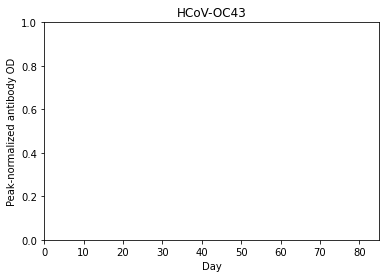

In [33]:
from matplotlib import pyplot as plt
plt.plot(oc43antibodytimecourse)
plt.ylim(0,1.0)
#####Added x limit
plt.xlim(0,85)
plt.xlabel("Day")
plt.ylabel("Peak-normalized antibody OD")
plt.title('HCoV-OC43')
plt.show()

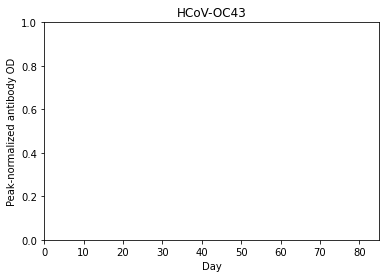

In [34]:
import matplotlib.pyplot as plt
import math

f = plt.figure()
plt.plot(oc43antibodytimecourse)
plt.ylim(0,1.0)
#####Added x limit
plt.xlim(0,85)
plt.xlabel("Day")
plt.ylabel("Peak-normalized antibody OD")
plt.title('HCoV-OC43')
plt.show()

f.savefig("HCoV-OC43_AntibodyTimecourse" + str(datetime.now().strftime('%Y_%m_%d_%H_%M_%S')) + ".pdf", bbox_inches='tight')

###### Export to Excel

In [35]:
from datetime import datetime

df3 = pd.DataFrame(oc43antibodytimecourse, columns=["Antibody Time Course"])
df3.to_csv('OC43-Antibody-Time-Course' + str(datetime.now().strftime('%Y_%m_%d_%H_%M_%S')) + '.csv', index=False)

In [36]:
len(oc43antibodytimecourse)

2

In [37]:
import math

def calculatelambda(sarscov1baseline, lambdaValue, index):
    exponentValue = -lambdaValue * index
    result = sarscov1baseline + (1 - sarscov1baseline) * math.exp(exponentValue)
    return result

In [38]:
oc43lsfunc = 0
baseline = 0.1
currentMinValue = float('inf')
currentMinValue

for index in range(0, (len(oc43antibodytimecourse))):
    print(oc43antibodytimecourse[index])
    ##Need to find the step value and maximum value for this lambdaValue
    lambdaValue = 0.005
    
    ##Added 11/28
    oc43lsfunc = (oc43antibodytimecourse[index]) - math.pow((calculatelambda(baseline, lambdaValue, index)), 2)     
    print(oc43lsfunc)
    
    if oc43lsfunc < currentMinValue:
        currentMinValue = oc43lsfunc      

1.0
0.0
nan
nan


In [39]:
print(currentMinValue)

0.0


In [40]:
oc43halflife = np.log(2) / 0.0042019881376685235

In [41]:
print(oc43halflife)

164.95695795670156


##### Added as part of python code

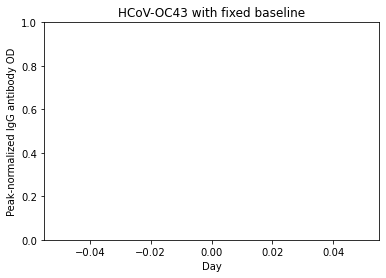

In [42]:
plt.plot(oc43antibodytimecourse, color='red')
plt.ylim(0,1.0)
plt.xlabel("Day")
plt.ylabel("Peak-normalized IgG antibody OD")
plt.title('HCoV-OC43 with fixed baseline')
plt.show()

##### Added as part of python code

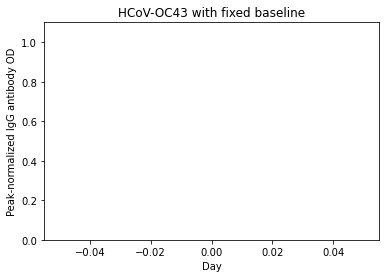

In [43]:
f2 = plt.figure()
plt.plot(oc43antibodytimecourse, color='red')
plt.ylim(0,1.1)
plt.xlabel("Day")
plt.ylabel("Peak-normalized IgG antibody OD")
plt.title('HCoV-OC43 with fixed baseline')
plt.show()

f2.savefig("HCoV-OC43_withFixedBaseline" + str(datetime.now().strftime('%Y_%m_%d_%H_%M_%S')) + ".pdf", bbox_inches='tight')

In [44]:
lambdaForPlot = 0.00420101
baseline = 0.0996472
result = 0
plotBaseLines = list()

for days in range(0, len(oc43antibodytimecourse)):
    exponentValue = -lambdaForPlot * days
    result = baseline + (1 - baseline) * math.exp(exponentValue)
    plotBaseLines.append(result)

In [45]:
print(plotBaseLines)

[1.0, 0.9962255427012198]


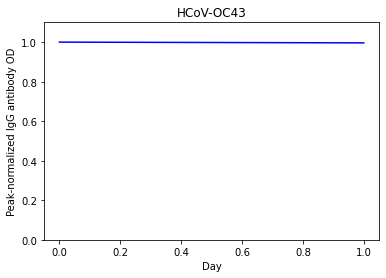

In [46]:
from matplotlib import pyplot as plt

plt.plot(oc43antibodytimecourse, color='red')
plt.ylim(0,1.1)
plt.xlabel("Day")

plt.plot(plotBaseLines, color = 'blue')

plt.ylabel("Peak-normalized IgG antibody OD")
plt.title('HCoV-OC43 with fixed baseline')
#plt.show()

plt.title('HCoV-OC43')
plt.show()

##### Added as part of python code

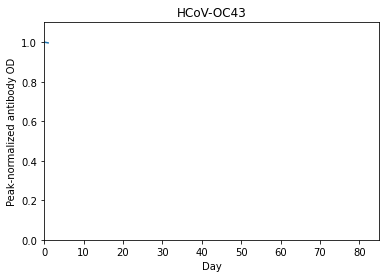

In [47]:
f2 = plt.figure()
plt.plot(plotBaseLines)
plt.ylim(0,1.1)
#####Added x limit
plt.xlim(0,85)
plt.xlabel("Day")
plt.ylabel("Peak-normalized antibody OD")
plt.title('HCoV-OC43')
plt.show()

f2.savefig("HCoV-OC43_withFixedBaseline" + str(datetime.now().strftime('%Y_%m_%d_%H_%M_%S')) + ".pdf", bbox_inches='tight')

In [48]:
len(oc43antibodytimecourse)

2

In [49]:
oc43antibodytimecourseplusexp = oc43antibodytimecourse
day = len(oc43antibodytimecourse)

print(day)

2


In [50]:
#while day < 4393 - Length[oc43antibodytimecourse]:
#Small file 86 records
#while day < 89:
maxDays = 2
while day < maxDays:
    day = day + 1
    print("day : " + str(day))
    exponentValueBaseLine = -0.00420101
    tempValue = 0.09964716261621707 + (oc43antibodytimecourseplusexp[day-1] - 0.09964716261621707) * math.exp(exponentValueBaseLine)
    print('tempValue' + str(tempValue))
    oc43antibodytimecourseplusexp.append(tempValue)

In [51]:
print(oc43antibodytimecourseplusexp)

[1.0, nan]


Text(0.5, 1.0, 'HCoV-OC43')

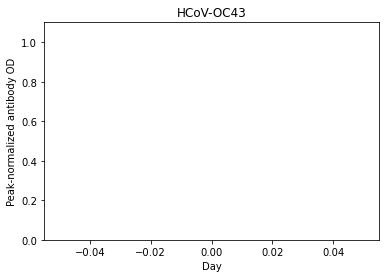

In [52]:
import matplotlib.pyplot as plt2
plt2.plot(oc43antibodytimecourseplusexp)
plt2.ylim(0,1.1)
plt2.xlabel("Day")
plt2.ylabel("Peak-normalized antibody OD")
plt2.title('HCoV-OC43')

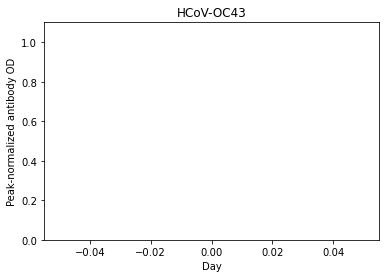

In [53]:
import matplotlib.pyplot as plt3

f = plt3.figure()
plt3.plot(oc43antibodytimecourseplusexp)

plt3.ylim(0,1.1)
plt3.xlabel("Day")
plt3.ylabel("Peak-normalized antibody OD")
plt3.title('HCoV-OC43')
plt3.show()

f.savefig("HCoV-OC43_nOD-by-Day_" + str(datetime.now().strftime('%Y_%m_%d_%H_%M_%S')) + ".pdf", bbox_inches='tight')

In [54]:
lengthabtc = len(oc43antibodytimecourse)
print(lengthabtc)

2


##### HCoV-OC43 Probability of No Reinfection Time Course

##### oc43probinfgivenaod - yet to update

In [55]:
######## ToDo: Need to update based on Full Simplify value
a = 1
b = 1

In [56]:
import math

def oc43probinfgivenaod(aod, a, b):
    exponentValue = -(a + b * aod)   
    result = 1 / (1 + math.exp(exponentValue))
    return result

In [57]:
oc43probnoreinfectiontimecourse = list()
day = 0
oc43probnoreinfectiontimecourse.append(1.0)

oc43probnoreinfectiontimecourse.append(oc43probnoreinfectiontimecourse[day] * (1-oc43probinfgivenaod(oc43antibodytimecourse[day+1], a, b)))

In [58]:
print(oc43probnoreinfectiontimecourse)

[1.0, nan]


In [59]:
#### Need to change days to 4393
while day < lengthabtc:  
    print("day : " +str(day))
    if(day < lengthabtc):
        #Not working
        #oc43probnoreinfectiontimecourse.append(oc43probnoreinfectiontimecourse[day] * (1 - oc43probinfgivenaod(oc43antibodytimecourse[day + 1], a, b)))
        oc43probnoreinfectiontimecourse.append(oc43probnoreinfectiontimecourse[day] * (1 - oc43probinfgivenaod(oc43antibodytimecourse[day], a, b)))
    else:
        oc43probnoreinfectiontimecourse.append(oc43probnoreinfectiontimecourse[day] * (1 - oc43probinfgivenaod(oc43antibodytimecourse[lengthabtc], a, b)))
            
    day = day + 1   

day : 0
day : 1


In [60]:
print(oc43probnoreinfectiontimecourse)

[1.0, nan, 0.11920292202211769, nan]


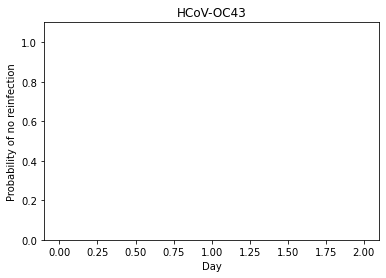

In [61]:
plt.plot(oc43probnoreinfectiontimecourse, color='blue')
plt.ylim(0,1.1)
plt.xlabel("Day")
plt.ylabel("Probability of no reinfection")
plt.title('HCoV-OC43')
plt.show()

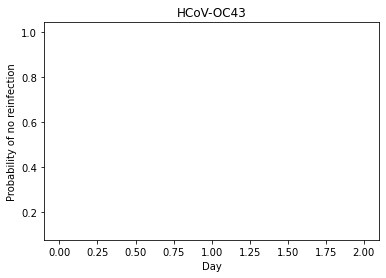

In [62]:
import matplotlib.pyplot as plt6

f6 = plt6.figure()
plt6.plot(oc43probnoreinfectiontimecourse, color = 'blue')

#plt6.ylim(0,0.007)
#plt6.xlim(0.0, 1.0)

plt6.xlabel("Day")
plt6.ylabel("Probability of no reinfection")
plt6.title('HCoV-OC43')
plt6.show()

f6.savefig("HCoV-NL63_PnorInfTimecourse-by-Day" + str(datetime.now().strftime('%Y_%m_%d_%H_%M_%S')) + ".pdf", bbox_inches='tight')

In [63]:
oc43probreinfection = list()

day = 0

#while day < 4393:
while day < 2:
    day = day + 1  
        
    #if day < 1392:
    if day < 2:
        tempValue = oc43probinfgivenaod(oc43antibodytimecourse[day], a, b) * oc43probnoreinfectiontimecourse[day]
    else:
        #tempValue = oc43probinfgivenaod(oc43antibodytimecourse[lengthabtc], a, b)* oc43probnoreinfectiontimecourse[day]
        tempValue = oc43probinfgivenaod(oc43antibodytimecourse[1], a, b)* oc43probnoreinfectiontimecourse[day]
    
    oc43probreinfection.append(tempValue)      

Text(0.5, 1.0, 'HCoV-OC43')

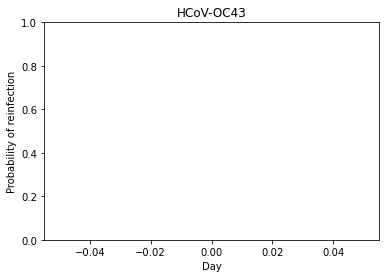

In [64]:
import matplotlib.pyplot as plt7
plt7.plot(oc43probreinfection)
plt7.ylim(0, 1.0)
plt7.xlabel("Day")
plt7.ylabel("Probability of reinfection")
plt7.title('HCoV-OC43') 

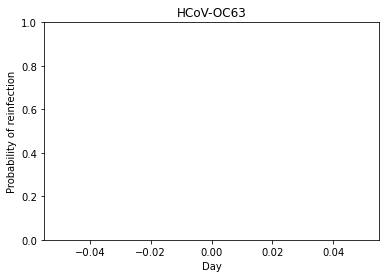

In [65]:
import matplotlib.pyplot as plt7

f = plt7.figure()

plt7.plot(oc43probreinfection)
plt7.ylim(0, 1.0)
plt7.xlabel("Day")
plt7.ylabel("Probability of reinfection")
plt7.title('HCoV-OC63') 
f.savefig("HCoV-OC43_PrInf-by-Day" + str(datetime.now().strftime('%Y_%m_%d_%H_%M_%S')) + ".pdf", bbox_inches='tight')

##### NL63 Waning of Antibody OD

###### Input Data: ELIZA ODs for HCoV-NL63 N IgG antibodies converted to S IgG antibodies from the 
###### supplementary dataset of Edridge et al. 2020, "Seasonal coronavirus protective immunity is short-lasting", 
###### Nature Medicine. using a linear regression model of N and S IgG antibody data from Gudbjartsson et al. 2020, 
###### "Humoral Immune Response to SARS-CoV-2 in Iceland", New England Journal of Medicine.

In [66]:
nl63data = df[df2.isin(["NL63"]).any(axis=1)]

In [67]:
print(nl63data)

     Unnamed: 0     X      Date Virus  OD_value     V4   V5           V6  \
138           1   139   8/20/85  NL63  0.677122   True  NaN          NaN   
139           1   140  11/18/85  NL63   2.11913  False   90    0.0160223   
140           1   141   2/14/86  NL63  0.770497  False   88   -0.0153254   
141           1   142   5/29/86  NL63  0.736037   True  104 -0.000331352   
142           1   143    9/5/86  NL63   1.42322  False   99   0.00694129   
...         ...   ...       ...   ...       ...    ...  ...          ...   
2926         10  2927    4/6/09  NL63  0.652253  False  182 -0.000115434   
2927         10  2928   10/5/09  NL63  0.594215  False  182 -0.000318892   
2928         10  2929   3/29/10  NL63   1.26944  False  175   0.00385841   
2929         10  2930   9/20/10  NL63  0.669604  False  175  -0.00342761   
2930         10  2931   3/21/11  NL63  0.969932    NaN  182   0.00165016   

            V8           V9  
138   0.311365          NaN  
139   0.974452   0.00736763

In [68]:
print(len(nl63data))

513


####### To Do: need to calculate llnl63lrdaily to get FullSimplify

In [69]:
a = 1
b = 1

In [70]:
import math

def nl63probinfgivenaod(aod, a, b):
    exponentValue = -(a + b * aod)   
    result = 1 / (1 + math.exp(exponentValue))
    return result

In [71]:
nl63dataArr = nl63data.to_numpy()

In [72]:
import re

aod = 0
nl63paddedmeanwaning = dict();

index = 0

while aod <= 2.9:       
    index  = 2
    valueList = list()
    
    while index <= lloc43length:    
        #print("aod :" + str(aod))
        #print("index : " + str(index))
        print(nl63dataArr[index-2])
        
        if ((nl63dataArr[index-2][9] >= aod and aod >= nl63dataArr[index-2][9]) or 
            (nl63dataArr[index-2][9] <= aod and aod <= nl63dataArr[index-2][9]) ) :
            if (nl63dataArr[[index-1, 10]] != "NA" and re.match( r'^(F).*(E)$', nl63dataArr[index-2][6] )):
                if nl63dataArr[index-1][8].isnumeric() == True: 
                    valueList.append(oc43dataArr[index-1][8])
                else:
                    valueList.append(0)
        average = grade_avg(valueList)
        print("average : " + str(average))
        nl63paddedmeanwaning["{0:.3f}".format(aod)] = average
        
        index = index + 1    
    aod = aod + 0.05


[1 139 '8/20/85' 'NL63' 0.677121515 True nan nan 0.311364849 nan]
average : nan
[1 140 '11/18/85' 'NL63' 2.119129208 False 90.0 0.016022308 0.9744519
 0.0073676340000000005]
average : nan
[1 141 '2/14/86' 'NL63' 0.7704974809999999 False 88.0
 -0.015325361000000001 0.35430248 -0.007047151999999999]
average : nan
[1 142 '5/29/86' 'NL63' 0.736036857 True 104.0 -0.000331352 0.338456245
 -0.000152368]
average : nan
[1 143 '9/5/86' 'NL63' 1.423224501 False 99.0 0.006941289000000001
 0.654449863 0.003191855]
average : nan
[1 144 '11/26/86' 'NL63' 1.329308518 False 82.0 -0.0011453169999999999
 0.6112639129999999 -0.000526658]
average : nan
[1 145 '3/4/87' 'NL63' 1.131106014 False 98.0 -0.002022475 0.520123266
 -0.000930007]
average : nan
[1 146 '6/1/87' 'NL63' 1.678760183 False 89.0 0.006153418000000001
 0.771954369 0.002829563]
average : nan
[1 147 '8/20/87' 'NL63' 1.217953675 False 80.0 -0.005760080999999999
 0.560058947 -0.0026486929999999997]
average : nan
[1 148 '11/19/87' 'NL63' 1.281466

[4 1153 '10/25/88' 'NL63' 0.736059685 False 90.0 -0.000852343
 0.33846674200000004 -0.00039193800000000004]
average : nan
[4 1154 '4/26/89' 'NL63' 0.748429325 False 183.0 6.759999999999999e-05
 0.34415474799999995 3.11e-05]
average : nan
[4 1155 '10/25/89' 'NL63' 0.687444235 False 182.0 -0.000335083 0.316111608
 -0.00015408299999999998]
average : nan
[4 1156 '4/25/90' 'NL63' 2.291877221 False 182.0 0.008815566 1.053887655
 0.004053715]
average : nan
[4 1157 '10/19/90' 'NL63' 1.7667505419999998 False 177.0 -0.002966817
 0.812415503 -0.0013642489999999999]
average : nan
[4 1158 '4/24/91' 'NL63' 1.5871453830000002 False 187.0 -0.000960455
 0.729826585 -0.00044165199999999995]
average : nan
[4 1159 '10/30/91' 'NL63' 1.3921433019999998 False 189.0 -0.001031757
 0.640157608 -0.000474439]
average : nan
[4 1160 '4/28/92' 'NL63' 1.27388119 False 181.0 -0.000653382
 0.5857764320000001 -0.000300448]
average : nan
[4 1161 '10/28/92' 'NL63' 1.21686768 False 183.0 -0.000311549 0.559559567
 -0.000143

average : nan
[8 2206 '10/11/04' 'NL63' 0.8530060009999999 False 175.0
 -0.00011196200000000001 0.39224286799999997 -5.15e-05]
average : nan
[8 2207 '4/11/05' 'NL63' 0.800173661 False 182.0 -0.000290288
 0.36794865600000004 -0.000133485]
average : nan
[8 2208 '10/17/05' 'NL63' 0.823014446 False 189.0 0.000120851 0.378451671
 5.56e-05]
average : nan
[8 2209 '4/24/06' 'NL63' 0.956410155 False 189.0 0.000705797 0.439791821
 0.00032455099999999996]
average : nan
[8 2210 '3/26/07' 'NL63' 0.829878053 False 336.0 -0.000376584 0.381607805
 -0.000173167]
average : nan
[8 2211 '9/24/07' 'NL63' 0.8442644 False 182.0 7.900000000000001e-05
 0.388223165 3.63e-05]
average : nan
[8 2212 '4/21/08' 'NL63' 0.7961167440000001 False 210.0 -0.000229275
 0.36608314 -0.000105429]
average : nan
[8 2213 '10/13/08' 'NL63' 0.7231968559999999 False 175.0 -0.000416685
 0.33255195 -0.000191607]
average : nan
[8 2214 '4/6/09' 'NL63' 1.410750213 False 175.0 0.0039288759999999995
 0.648713736 0.0018066389999999999]
ave

average : nan
[4 1181 '11/6/08' 'NL63' 0.953778052 False 211.0 -0.000899222 0.438581485
 -0.000413495]
average : nan
[4 1182 '4/23/09' 'NL63' 0.942375207 False 168.0 -6.790000000000001e-05
 0.43333804600000003 -3.12e-05]
average : nan
[4 1183 '10/29/09' 'NL63' 0.8416021709999999 False 189.0 -0.000533191
 0.386998976 -0.00024518]
average : nan
[4 1184 '4/28/10' 'NL63' 1.0736213140000002 False 181.0 0.001281874
 0.493689731 0.000589452]
average : nan
[4 1185 '10/20/10' 'NL63' 0.78915483 nan 175.0 -0.0016255229999999998
 0.362881801 -0.0007474739999999999]
average : nan
[5 1421 '5/6/85' 'NL63' 0.912167838 False nan nan 0.419447611 nan]
average : nan
[5 1422 '8/6/85' 'NL63' 0.817240105 False 92.0 -0.001031823 0.375796421
 -0.00047446900000000004]
average : nan
[5 1423 '11/6/85' 'NL63' 0.670335709 False 92.0 -0.0015967870000000001
 0.308244492 -0.00073426]
average : nan
[5 1424 '2/5/86' 'NL63' 0.6460363020000001 True 91.0
 -0.00026702599999999996 0.29707074899999997 -0.000122788]
average : 

 0.0034756120000000003 0.656946092 0.001598211]
average : nan
[7 1952 '3/25/87' 'NL63' 1.046185176 False 77.0 -0.004967115 0.481073607
 -0.002284058]
average : nan
[7 1953 '7/1/87' 'NL63' 0.930417347 False 98.0 -0.001181304
 0.42783939200000004 -0.000543206]
average : nan
[7 1954 '9/30/87' 'NL63' 0.8878829109999999 False 91.0 -0.000467411
 0.408280527 -0.000214933]
average : nan
[7 1955 '1/6/88' 'NL63' 0.719423922 True 98.0 -0.0017189689999999999
 0.330817019 -0.000790444]
average : nan
[7 1956 '3/30/88' 'NL63' 2.099324747 False 84.0 0.016427391 0.965345096
 0.007553906]
average : nan
[7 1957 '6/29/88' 'NL63' 1.485753083 False 91.0 -0.0067425459999999994
 0.6832027559999999 -0.003100465]
average : nan
[7 1958 '9/28/88' 'NL63' 1.130785495 False 91.0 -0.003900743 0.51997588
 -0.001793702]
average : nan
[7 1959 '1/3/89' 'NL63' 0.9062561440000001 False 97.0 -0.002314736
 0.416729201 -0.001064399]
average : nan
[7 1960 '7/3/89' 'NL63' 0.7705941279999999 False 181.0 -0.000749514
 0.354346922

average : nan
[3 807 '8/6/85' 'NL63' 1.282199142 False 96.0 -0.000522593 0.589601325
 -0.00024030700000000002]
average : nan
[3 808 '11/5/85' 'NL63' 1.156015143 False 91.0 -0.001386637 0.53157738
 -0.000637626]
average : nan
[3 809 '2/4/86' 'NL63' 1.2483612579999999 False 91.0 0.001014792
 0.574041448 0.000466638]
average : nan
[3 810 '5/6/86' 'NL63' 1.19870225 False 91.0 -0.000545703
 0.5512064489999999 -0.000250934]
average : nan
[3 811 '8/6/86' 'NL63' 1.159251058 False 92.0 -0.00042881699999999996
 0.53306537 -0.000197186]
average : nan
[3 812 '11/11/86' 'NL63' 1.1991170820000001 False 97.0 0.00041099
 0.551397203 0.000188988]
average : nan
[3 813 '2/11/87' 'NL63' 1.01895626 False 92.0 -0.00195827
 0.46855277100000003 -0.000900483]
average : nan
[3 814 '5/11/87' 'NL63' 0.9822639679999999 False 89.0
 -0.00041227300000000006 0.451680335 -0.00018957799999999998]
average : nan
[3 815 '8/18/87' 'NL63' 1.088880173 False 99.0 0.0010769310000000002
 0.5007063039999999 0.000495212]
average :

 0.306538405 -7.020000000000001e-05]
average : nan
[5 1465 '4/15/09' 'NL63' 0.7157283329999999 False 176.0 0.000278993
 0.329117654 0.000128291]
average : nan
[5 1466 '10/15/09' 'NL63' 0.7699333709999999 False 183.0 0.000296202
 0.354043082 0.000136205]
average : nan
[5 1467 '4/8/10' 'NL63' 0.775433542 False 175.0 3.14e-05 0.356572259
 1.4499999999999998e-05]
average : nan
[5 1468 '10/7/10' 'NL63' 0.791874436 nan 182.0 9.03e-05 0.364132374
 4.15e-05]
average : nan
[6 1705 '11/28/84' 'NL63' 0.7880567270000001 False nan nan
 0.36237685399999997 nan]
average : nan
[6 1706 '2/27/85' 'NL63' 0.791505795 False 91.0 3.79e-05
 0.36396285899999997 1.74e-05]
average : nan
[6 1707 '5/24/85' 'NL63' 0.697020603 False 86.0 -0.001098665 0.320515166
 -0.000505206]
average : nan
[6 1708 '8/27/85' 'NL63' 0.7994546090000001 False 95.0 0.001078253
 0.36761801 0.000495819]
average : nan
[6 1709 '11/29/85' 'NL63' 0.8146146120000001 False 94.0 0.000161277
 0.374589125 7.42e-05]
average : nan
[6 1710 '2/28/86'

[9 2579 '6/23/16' 'NL63' 1.099044957 False 189.0 0.000419904 0.505380438
 0.00019308700000000002]
average : nan
[9 2580 '12/15/16' 'NL63' 1.0026188440000001 True 175.0
 -0.0005510059999999999 0.46104023899999996 -0.000253373]
average : nan
[9 2581 '4/24/17' 'NL63' 2.3942167619999997 False 130.0
 0.010704598999999999 1.1009470609999998 0.00492236]
average : nan
[9 2582 '9/26/17' 'NL63' 1.5932349609999998 False 155.0 -0.005167625
 0.732626793 -0.00237626]
average : nan
[9 2583 '3/27/18' 'NL63' 1.237201301 False 182.0 -0.001956229 0.568909698
 -0.000899544]
average : nan
[9 2584 '9/27/18' 'NL63' 1.112631809 True 184.0 -0.000677008 0.511628161
 -0.000311313]
average : nan
[9 2585 '4/4/19' 'NL63' 1.828915876 False 189.0 0.003789863 0.841001362
 0.001742715]
average : nan
[9 2586 '10/8/19' 'NL63' 1.678508211 nan 187.0 -0.000804319 0.771838503
 -0.000369855]
average : nan
[10 2883 '4/24/85' 'NL63' 0.950845203 False nan nan 0.437232855 nan]
average : nan
[10 2884 '5/23/85' 'NL63' 2.150229386 F

[7 1945 '6/26/85' 'NL63' 0.767611985 False nan nan 0.352975625 nan]
average : nan
[7 1946 '9/25/85' 'NL63' 0.8497485920000001 False 91.0
 0.0009025999999999999 0.390744994 0.00041504800000000006]
average : nan
[7 1947 '12/18/85' 'NL63' 0.8084802259999999 True 84.0 -0.00049129
 0.371768314 -0.000225913]
average : nan
[7 1948 '3/26/86' 'NL63' 1.630323355 False 98.0 0.008386154 0.749681371
 0.0038562559999999997]
average : nan
[7 1949 '7/2/86' 'NL63' 1.3751162000000001 False 98.0 -0.002604155
 0.632327934 -0.001197484]
average : nan
[7 1950 '10/1/86' 'NL63' 1.0880430909999999 False 91.0 -0.00315465
 0.500321383 -0.001450621]
average : nan
[7 1951 '1/7/87' 'NL63' 1.4286530219999998 False 98.0
 0.0034756120000000003 0.656946092 0.001598211]
average : nan
[7 1952 '3/25/87' 'NL63' 1.046185176 False 77.0 -0.004967115 0.481073607
 -0.002284058]
average : nan
[7 1953 '7/1/87' 'NL63' 0.930417347 False 98.0 -0.001181304
 0.42783939200000004 -0.000543206]
average : nan
[7 1954 '9/30/87' 'NL63' 0.88

average : nan
[1 182 '4/9/13' 'NL63' 0.693761042 False 363.0 -0.000264812 0.319016303
 -0.00012177]
average : nan
[1 183 '4/15/14' 'NL63' 1.214965404 False 371.0 0.001404864
 0.5586848320000001 0.000646007]
average : nan
[1 184 '4/28/15' 'NL63' 0.686592973 False 378.0 -0.001397811 0.315720167
 -0.000642764]
average : nan
[1 185 '8/30/17' 'NL63' 0.69951109 nan 855.0 1.51e-05 0.32166038199999997
 6.95e-06]
average : nan
[2 443 '3/1/85' 'NL63' 0.805332973 False nan nan 0.370321093 nan]
average : nan
[2 444 '5/31/85' 'NL63' 0.779018487 False 91.0 -0.00028917 0.358220745
 -0.000132971]
average : nan
[2 445 '9/5/85' 'NL63' 0.81727897 False 97.0 0.00039443800000000005
 0.37581429299999997 0.000181377]
average : nan
[2 446 '12/5/85' 'NL63' 0.813791281 False 91.0 -3.8299999999999996e-05
 0.374210528 -1.76e-05]
average : nan
[2 447 '3/20/86' 'NL63' 0.7866014040000001 False 105.0 -0.000258951
 0.361707644 -0.000119075]
average : nan
[2 448 '6/26/86' 'NL63' 0.7655707979999999 False 98.0
 -0.000214

average : nan
[2 500 '5/22/18' 'NL63' 0.870067745 False 203.0 -0.00035423
 0.40008847200000003 -0.000162888]
average : nan
[2 501 '11/20/18' 'NL63' 0.8459654120000001 False 182.0 -0.00013243
 0.389005352 -6.0899999999999996e-05]
average : nan
[2 502 '5/16/19' 'NL63' 0.856551198 False 177.0 5.98e-05 0.393873077
 2.75e-05]
average : nan
[2 503 '11/19/19' 'NL63' 0.811657154 nan 187.0 -0.000240075 0.37322918
 -0.000110395]
average : nan
[3 805 '1/31/85' 'NL63' 1.331341652 False nan nan 0.612198821 nan]
average : nan
[3 806 '5/2/85' 'NL63' 1.332368091 False 91.0 1.13e-05 0.612670814
 5.19e-06]
average : nan
[3 807 '8/6/85' 'NL63' 1.282199142 False 96.0 -0.000522593 0.589601325
 -0.00024030700000000002]
average : nan
[3 808 '11/5/85' 'NL63' 1.156015143 False 91.0 -0.001386637 0.53157738
 -0.000637626]
average : nan
[3 809 '2/4/86' 'NL63' 1.2483612579999999 False 91.0 0.001014792
 0.574041448 0.000466638]
average : nan
[3 810 '5/6/86' 'NL63' 1.19870225 False 91.0 -0.000545703
 0.5512064489999

 0.600603384 -0.0008769219999999999]
average : nan
[6 1716 '8/17/87' 'NL63' 1.227091385 False 91.0 -0.0008685030000000001
 0.564260795 -0.000399369]
average : nan
[6 1717 '11/16/87' 'NL63' 1.122638351 False 91.0 -0.001147836 0.516229529
 -0.000527816]
average : nan
[6 1718 '2/18/88' 'NL63' 1.124761617 False 94.0 2.26e-05 0.517205884
 1.04e-05]
average : nan
[6 1719 '5/26/88' 'NL63' 1.016549072 False 98.0 -0.00110421 0.46744586
 -0.000507755]
average : nan
[6 1720 '8/26/88' 'NL63' 1.1442989209999999 False 92.0 0.001388585
 0.5261898389999999 0.000638522]
average : nan
[6 1721 '11/28/88' 'NL63' 1.029643377 False 94.0 -0.00121974
 0.47346709299999995 -0.00056088]
average : nan
[6 1722 '2/23/89' 'NL63' 1.105179717 False 87.0 0.000868234 0.508201421
 0.000399245]
average : nan
[6 1723 '5/18/89' 'NL63' 0.9781361159999999 False 84.0
 -0.0015124239999999998 0.4497822 -0.000695467]
average : nan
[6 1724 '8/8/89' 'NL63' 0.9428483329999999 False 82.0 -0.000430339
 0.433555607 -0.000197885]
averag

 0.000478914]
average : nan
[10 2904 '11/25/91' 'NL63' 1.014614393 False 188.0 -0.0013293279999999998
 0.466556225 -0.0006112730000000001]
average : nan
[10 2905 '5/25/92' 'NL63' 1.000703475 False 182.0 -7.64e-05 0.460159484
 -3.5100000000000006e-05]
average : nan
[10 2906 '11/6/92' 'NL63' 0.9938349259999999 False 165.0 -4.16e-05
 0.45700107799999995 -1.91e-05]
average : nan
[10 2907 '5/10/93' 'NL63' 1.014813633 False 185.0 0.00011339799999999999
 0.46664784200000003 5.21e-05]
average : nan
[10 2908 '11/8/93' 'NL63' 0.988274753 False 182.0 -0.000145818 0.45444431
 -6.709999999999999e-05]
average : nan
[10 2909 '5/16/94' 'NL63' 1.2303767909999999 False 189.0 0.001280963
 0.565771543 0.000589033]
average : nan
[10 2910 '11/7/94' 'NL63' 0.9356222540000001 False 175.0 -0.001684312
 0.430232795 -0.000774507]
average : nan
[10 2911 '5/8/95' 'NL63' 0.877754212 False 182.0 -0.000317956 0.403622986
 -0.000146208]
average : nan
[10 2912 '11/6/95' 'NL63' 0.8630272929999999 False 182.0 -8.09e-05
 

 0.362286027 -0.000134824]
average : nan
[10 2918 '10/25/04' 'NL63' 0.836176613 False 182.0 0.00026548 0.38450411
 0.000122077]
average : nan
[10 2919 '4/12/05' 'NL63' 0.812101854 False 169.0 -0.000142454
 0.37343366899999997 -6.55e-05]
average : nan
[10 2920 '10/10/05' 'NL63' 0.755376742 False 181.0 -0.000313398 0.34734942
 -0.000144112]
average : nan
[10 2921 '4/10/06' 'NL63' 0.7404686140000001 False 182.0
 -8.190000000000001e-05 0.340494126 -3.77e-05]
average : nan
[10 2922 '10/9/06' 'NL63' 0.69594486 False 182.0 -0.000244636 0.320020501
 -0.000112492]
average : nan
[10 2923 '4/10/07' 'NL63' 0.801268353 False 183.0 0.000575538 0.368452035
 0.000264653]
average : nan
[10 2924 '10/8/07' 'NL63' 0.798819375 False 181.0 -1.3500000000000001e-05
 0.367325907 -6.22e-06]
average : nan
[10 2925 '4/7/08' 'NL63' 0.741043102 False 182.0 -0.000317452 0.340758296
 -0.000145976]
average : nan
[10 2926 '10/6/08' 'NL63' 0.673261853 False 182.0 -0.000372424 0.309590038
 -0.00017125400000000002]
averag

 0.42783939200000004 -0.000543206]
average : nan
[7 1954 '9/30/87' 'NL63' 0.8878829109999999 False 91.0 -0.000467411
 0.408280527 -0.000214933]
average : nan
[7 1955 '1/6/88' 'NL63' 0.719423922 True 98.0 -0.0017189689999999999
 0.330817019 -0.000790444]
average : nan
[7 1956 '3/30/88' 'NL63' 2.099324747 False 84.0 0.016427391 0.965345096
 0.007553906]
average : nan
[7 1957 '6/29/88' 'NL63' 1.485753083 False 91.0 -0.0067425459999999994
 0.6832027559999999 -0.003100465]
average : nan
[7 1958 '9/28/88' 'NL63' 1.130785495 False 91.0 -0.003900743 0.51997588
 -0.001793702]
average : nan
[7 1959 '1/3/89' 'NL63' 0.9062561440000001 False 97.0 -0.002314736
 0.416729201 -0.001064399]
average : nan
[7 1960 '7/3/89' 'NL63' 0.7705941279999999 False 181.0 -0.000749514
 0.354346922 -0.00034465300000000005]
average : nan
[7 1961 '6/20/90' 'NL63' 0.79799704 False 352.0 7.780000000000001e-05
 0.36694776700000004 3.5799999999999996e-05]
average : nan
[7 1962 '12/20/90' 'NL63' 0.8641287240000001 False 183.

[3 866 '5/29/18' 'NL63' 1.091114664 False 180.0 0.0007328110000000001
 0.5017338029999999 0.000336973]
average : nan
[3 867 '1/7/19' 'NL63' 0.955992814 False 223.0 -0.000605928
 0.43959991200000004 -0.000278627]
average : nan
[3 868 '7/16/19' 'NL63' 0.983549007 False 190.0 0.000145033 0.452271242
 6.670000000000001e-05]
average : nan
[3 869 '1/14/20' 'NL63' 0.971216304 nan 182.0 -6.78e-05 0.446600221
 -3.12e-05]
average : nan
[4 1138 '1/31/85' 'NL63' 0.724383949 False nan nan 0.333097818 nan]
average : nan
[4 1139 '5/8/85' 'NL63' 0.6870672309999999 False 97.0
 -0.00038470800000000004 0.31593824800000003 -0.00017690299999999998]
average : nan
[4 1140 '8/9/85' 'NL63' 0.7869252440000001 False 93.0 0.001073742
 0.361856557 0.000493745]
average : nan
[4 1141 '11/13/85' 'NL63' 0.6770747429999999 False 96.0 -0.001144276
 0.31134334199999997 -0.000526179]
average : nan
[4 1142 '2/13/86' 'NL63' 0.7123956229999999 False 92.0
 0.00038392300000000004 0.327585154 0.00017654099999999998]
average : n

average : nan
[6 1726 '2/6/90' 'NL63' 0.94419455 False 91.0 -0.000120404 0.434174646
 -5.539999999999999e-05]
average : nan
[6 1727 '5/7/90' 'NL63' 0.900034425 False 90.0 -0.000490668 0.41386823
 -0.000225627]
average : nan
[6 1728 '7/11/90' 'NL63' 0.9170980040000001 False 65.0 0.000262517
 0.42171467799999995 0.000120715]
average : nan
[6 1729 '11/12/90' 'NL63' 0.952132546 False 124.0 0.000282537 0.437824822
 0.000129921]
average : nan
[6 1730 '2/5/91' 'NL63' 1.06222279 False 85.0 0.001295179 0.48844828
 0.00059557]
average : nan
[6 1731 '5/15/91' 'NL63' 1.10414157 False 99.0 0.00042342199999999996
 0.5077240439999999 0.000194705]
average : nan
[6 1732 '8/7/91' 'NL63' 0.952933275 False 84.0 -0.0018000989999999999
 0.43819302600000004 -0.00082775]
average : nan
[6 1733 '11/20/91' 'NL63' 1.007889831 False 105.0 0.000523396 0.463464029
 0.000240676]
average : nan
[6 1734 '2/19/92' 'NL63' 1.000642428 False 91.0 -7.96e-05 0.460131412
 -3.66e-05]
average : nan
[6 1735 '5/20/92' 'NL63' 1.031

 0.5521159999999999 -9.46e-05]
average : nan
[10 2900 '11/27/89' 'NL63' 1.145600164 False 182.0 -0.000302638
 0.526788198 -0.000139164]
average : nan
[10 2901 '5/21/90' 'NL63' 1.1617302 False 175.0 9.22e-05
 0.5342053689999999 4.24e-05]
average : nan
[10 2902 '11/19/90' 'NL63' 1.073935523 False 182.0 -0.00048238800000000004
 0.493834216 -0.00022182]
average : nan
[10 2903 '5/21/91' 'NL63' 1.264528143 False 183.0 0.00104149 0.581475564
 0.000478914]
average : nan
[10 2904 '11/25/91' 'NL63' 1.014614393 False 188.0 -0.0013293279999999998
 0.466556225 -0.0006112730000000001]
average : nan
[10 2905 '5/25/92' 'NL63' 1.000703475 False 182.0 -7.64e-05 0.460159484
 -3.5100000000000006e-05]
average : nan
[10 2906 '11/6/92' 'NL63' 0.9938349259999999 False 165.0 -4.16e-05
 0.45700107799999995 -1.91e-05]
average : nan
[10 2907 '5/10/93' 'NL63' 1.014813633 False 185.0 0.00011339799999999999
 0.46664784200000003 5.21e-05]
average : nan
[10 2908 '11/8/93' 'NL63' 0.988274753 False 182.0 -0.000145818 0.

average : nan
[4 1154 '4/26/89' 'NL63' 0.748429325 False 183.0 6.759999999999999e-05
 0.34415474799999995 3.11e-05]
average : nan
[4 1155 '10/25/89' 'NL63' 0.687444235 False 182.0 -0.000335083 0.316111608
 -0.00015408299999999998]
average : nan
[4 1156 '4/25/90' 'NL63' 2.291877221 False 182.0 0.008815566 1.053887655
 0.004053715]
average : nan
[4 1157 '10/19/90' 'NL63' 1.7667505419999998 False 177.0 -0.002966817
 0.812415503 -0.0013642489999999999]
average : nan
[4 1158 '4/24/91' 'NL63' 1.5871453830000002 False 187.0 -0.000960455
 0.729826585 -0.00044165199999999995]
average : nan
[4 1159 '10/30/91' 'NL63' 1.3921433019999998 False 189.0 -0.001031757
 0.640157608 -0.000474439]
average : nan
[4 1160 '4/28/92' 'NL63' 1.27388119 False 181.0 -0.000653382
 0.5857764320000001 -0.000300448]
average : nan
[4 1161 '10/28/92' 'NL63' 1.21686768 False 183.0 -0.000311549 0.559559567
 -0.000143262]
average : nan
[4 1162 '4/27/93' 'NL63' 1.046882348 False 181.0 -0.000939145
 0.48139419200000005 -0.000

 0.34632142200000005 -0.0005825769999999999]
average : nan
[9 2550 '12/4/95' 'NL63' 0.676618657 False 188.0 -0.000407035 0.311133617
 -0.00018716900000000002]
average : nan
[9 2551 '5/30/96' 'NL63' 0.602449775 False 178.0 -0.00041667900000000004
 0.277028095 -0.000191604]
average : nan
[9 2552 '12/3/96' 'NL63' 0.5831920629999999 False 187.0
 -0.00010298200000000001 0.26817270600000004 -4.74e-05]
average : nan
[9 2553 '4/10/03' 'NL63' 0.683740095 False 2319.0 4.34e-05 0.314408311
 1.99e-05]
average : nan
[9 2554 '10/13/03' 'NL63' 0.611702115 True 186.0 -0.000387301
 0.28128265399999997 -0.000178095]
average : nan
[9 2555 '4/13/04' 'NL63' 0.9036013629999999 False 183.0 0.001595078
 0.415508437 0.0007334739999999999]
average : nan
[9 2556 '10/12/04' 'NL63' 0.763565616 False 182.0 -0.0007694269999999999
 0.351114959 -0.00035381]
average : nan
[9 2557 '4/11/05' 'NL63' 0.7240492359999999 False 181.0 -0.000218323
 0.332943905 -0.000100393]
average : nan
[9 2558 '10/10/05' 'NL63' 0.68815342900

average : nan
[1 158 '12/11/92' 'NL63' 1.143835337 False 357.0 0.000738791 0.525976667
 0.00033972300000000005]
average : nan
[1 159 '6/11/93' 'NL63' 0.989369304 False 182.0 -0.000848714 0.454947624
 -0.000390269]
average : nan
[1 160 '12/9/93' 'NL63' 0.8890346379999999 False 181.0 -0.000554335
 0.40881013200000005 -0.000254903]
average : nan
[1 161 '6/9/94' 'NL63' 0.9294766390000001 False 182.0 0.000222209
 0.42740682 0.00010218]
average : nan
[1 162 '12/8/94' 'NL63' 1.09961111 False 182.0 0.000934805 0.505640775
 0.00042985699999999996]
average : nan
[1 163 '6/15/95' 'NL63' 0.870059958 False 189.0 -0.001214556 0.400084891
 -0.0005584969999999999]
average : nan
[1 164 '12/11/95' 'NL63' 1.146396177 False 179.0 0.001543778 0.527154233
 0.000709885]
average : nan
[1 165 '6/10/96' 'NL63' 1.051635294 False 182.0 -0.000520664
 0.48357976799999997 -0.00023942]
average : nan
[1 166 '12/2/96' 'NL63' 0.8026316040000001 False 175.0
 -0.0014228779999999998 0.369078907 -0.000654291]
average : nan


 -0.0014702670000000001 0.6484647139999999 -0.0006760819999999999]
average : nan
[9 2547 '5/24/94' 'NL63' 1.119769066 False 183.0 -0.0015871020000000002
 0.514910129 -0.000729806]
average : nan
[9 2548 '11/29/94' 'NL63' 0.9837210809999999 False 189.0
 -0.0007198310000000001 0.45235036799999995 -0.00033100400000000003]
average : nan
[9 2549 '5/30/95' 'NL63' 0.753141167 False 182.0 -0.001266923
 0.34632142200000005 -0.0005825769999999999]
average : nan
[9 2550 '12/4/95' 'NL63' 0.676618657 False 188.0 -0.000407035 0.311133617
 -0.00018716900000000002]
average : nan
[9 2551 '5/30/96' 'NL63' 0.602449775 False 178.0 -0.00041667900000000004
 0.277028095 -0.000191604]
average : nan
[9 2552 '12/3/96' 'NL63' 0.5831920629999999 False 187.0
 -0.00010298200000000001 0.26817270600000004 -4.74e-05]
average : nan
[9 2553 '4/10/03' 'NL63' 0.683740095 False 2319.0 4.34e-05 0.314408311
 1.99e-05]
average : nan
[9 2554 '10/13/03' 'NL63' 0.611702115 True 186.0 -0.000387301
 0.28128265399999997 -0.000178095

average : nan
[2 462 '12/7/90' 'NL63' 0.865908345 False 183.0 -0.002042308 0.39817583
 -0.000939127]
average : nan
[2 463 '6/7/91' 'NL63' 0.806652618 False 182.0 -0.00032558099999999997
 0.37092791399999997 -0.00014971399999999998]
average : nan
[2 464 '12/4/91' 'NL63' 0.7597433109999999 False 180.0 -0.000260607
 0.349357326 -0.00011983700000000001]
average : nan
[2 465 '6/3/92' 'NL63' 0.79359584 False 182.0 0.000186003
 0.36492393700000003 8.55e-05]
average : nan
[2 466 '12/3/92' 'NL63' 0.990745593 False 183.0 0.001077321
 0.45558049100000003 0.000495391]
average : nan
[2 467 '6/3/93' 'NL63' 0.864433417 False 182.0 -0.000694023 0.397497605
 -0.000319137]
average : nan
[2 468 '12/8/93' 'NL63' 0.8238786990000001 False 188.0 -0.000215717
 0.378849086 -9.92e-05]
average : nan
[2 469 '6/16/94' 'NL63' 0.847682642 False 190.0 0.000125284 0.389794996
 5.7600000000000004e-05]
average : nan
[2 470 '12/14/94' 'NL63' 0.769809183 True 181.0 -0.00043024
 0.35398597600000004 -0.00019784]
average : n

 0.49509666799999996 -4.45e-05]
average : nan
[8 2183 '3/14/88' 'NL63' 0.9708272240000001 False 91.0 -0.001163228
 0.44642130799999996 -0.0005348940000000001]
average : nan
[8 2184 '6/13/88' 'NL63' 1.0808221359999999 False 91.0 0.001208735
 0.49700092799999995 0.00055582]
average : nan
[8 2185 '9/16/88' 'NL63' 1.06748603 False 95.0 -0.00014038 0.490868507
 -6.459999999999998e-05]
average : nan
[8 2186 '12/16/88' 'NL63' 1.025277612 False 91.0 -0.000463829
 0.47145955700000003 -0.000213285]
average : nan
[8 2187 '6/9/89' 'NL63' 0.907798157 False 175.0 -0.0006713110000000001
 0.417438274 -0.00030869299999999997]
average : nan
[8 2188 '12/15/89' 'NL63' 0.93902673 False 189.0 0.00016523099999999998
 0.431798296 7.6e-05]
average : nan
[8 2189 '6/15/90' 'NL63' 0.966153184 False 182.0 0.000149046 0.444272016
 6.850000000000001e-05]
average : nan
[8 2190 '12/10/90' 'NL63' 1.874464774 False 178.0 0.005102874 0.861946385
 0.002346485]
average : nan
[8 2191 '6/10/91' 'NL63' 1.127275295 False 182.0

 -0.001292259]
average : nan
[2 473 '6/11/96' 'NL63' 1.099674518 False 188.0 -1.4000000000000001e-05
 0.505669932 -6.44e-06]
average : nan
[2 474 '12/4/96' 'NL63' 1.098896177 False 176.0 -4.42e-06 0.505312023
 -2.03e-06]
average : nan
[2 475 '10/17/05' 'NL63' 0.900619699 False 3239.0 -6.12e-05 0.41413736
 -2.8100000000000002e-05]
average : nan
[2 476 '4/18/06' 'NL63' 0.82973605 False 183.0 -0.000387342
 0.38154250700000003 -0.00017811400000000002]
average : nan
[2 477 '10/24/06' 'NL63' 0.889052728 True 189.0 0.000313845 0.408818451
 0.000144317]
average : nan
[2 478 '4/24/07' 'NL63' 2.18496241 False 182.0 0.007120383 1.004724376
 0.003274208]
average : nan
[2 479 '10/23/07' 'NL63' 1.487832698 False 182.0 -0.0038303829999999997
 0.684159037 -0.0017613479999999998]
average : nan
[2 480 '4/15/08' 'NL63' 1.336570978 False 175.0 -0.000864353 0.614603453
 -0.00039746]
average : nan
[2 481 '10/14/08' 'NL63' 1.277236394 False 182.0 -0.000326014 0.587319275
 -0.000149913]
average : nan
[2 482 '

 0.329180415 -0.00012181]
average : nan
[5 1457 '4/19/05' 'NL63' 1.4287369719999998 False 181.0 0.00393852
 0.656984695 0.0018110729999999998]
average : nan
[5 1458 '10/26/05' 'NL63' 0.9614536029999999 False 190.0 -0.002459386
 0.44211098 -0.001130914]
average : nan
[5 1459 '4/24/06' 'NL63' 0.787297475 False 180.0 -0.0009675339999999999
 0.36202772200000005 -0.000444907]
average : nan
[5 1460 '10/23/06' 'NL63' 0.935923235 False 182.0 0.000816625
 0.43037119700000004 0.000375514]
average : nan
[5 1461 '4/25/07' 'NL63' 0.788548283 False 184.0 -0.000800951 0.362602889
 -0.000368306]
average : nan
[5 1462 '10/23/07' 'NL63' 0.8595843040000001 False 181.0
 0.00039246400000000003 0.39526780899999997 0.00018046900000000002]
average : nan
[5 1463 '4/24/08' 'NL63' 0.694087647 False 184.0 -0.000899438 0.319166488
 -0.00041359400000000004]
average : nan
[5 1464 '10/21/08' 'NL63' 0.666625503 False 180.0 -0.00015256700000000002
 0.306538405 -7.020000000000001e-05]
average : nan
[5 1465 '4/15/09' 'NL

average : nan
[9 2547 '5/24/94' 'NL63' 1.119769066 False 183.0 -0.0015871020000000002
 0.514910129 -0.000729806]
average : nan
[9 2548 '11/29/94' 'NL63' 0.9837210809999999 False 189.0
 -0.0007198310000000001 0.45235036799999995 -0.00033100400000000003]
average : nan
[9 2549 '5/30/95' 'NL63' 0.753141167 False 182.0 -0.001266923
 0.34632142200000005 -0.0005825769999999999]
average : nan
[9 2550 '12/4/95' 'NL63' 0.676618657 False 188.0 -0.000407035 0.311133617
 -0.00018716900000000002]
average : nan
[9 2551 '5/30/96' 'NL63' 0.602449775 False 178.0 -0.00041667900000000004
 0.277028095 -0.000191604]
average : nan
[9 2552 '12/3/96' 'NL63' 0.5831920629999999 False 187.0
 -0.00010298200000000001 0.26817270600000004 -4.74e-05]
average : nan
[9 2553 '4/10/03' 'NL63' 0.683740095 False 2319.0 4.34e-05 0.314408311
 1.99e-05]
average : nan
[9 2554 '10/13/03' 'NL63' 0.611702115 True 186.0 -0.000387301
 0.28128265399999997 -0.000178095]
average : nan
[9 2555 '4/13/04' 'NL63' 0.9036013629999999 False 1

 0.44752751799999996 -4.48e-05]
average : nan
[2 459 '6/8/89' 'NL63' 0.889765473 False 182.0 -0.00045861199999999995
 0.40914619700000004 -0.00021088599999999997]
average : nan
[2 460 '12/7/89' 'NL63' 0.865983589 False 182.0 -0.00013067 0.39821043
 -6.01e-05]
average : nan
[2 461 '6/7/90' 'NL63' 1.239650703 False 182.0 0.0020531160000000002
 0.5700360210000001 0.000944097]
average : nan
[2 462 '12/7/90' 'NL63' 0.865908345 False 183.0 -0.002042308 0.39817583
 -0.000939127]
average : nan
[2 463 '6/7/91' 'NL63' 0.806652618 False 182.0 -0.00032558099999999997
 0.37092791399999997 -0.00014971399999999998]
average : nan
[2 464 '12/4/91' 'NL63' 0.7597433109999999 False 180.0 -0.000260607
 0.349357326 -0.00011983700000000001]
average : nan
[2 465 '6/3/92' 'NL63' 0.79359584 False 182.0 0.000186003
 0.36492393700000003 8.55e-05]
average : nan
[2 466 '12/3/92' 'NL63' 0.990745593 False 183.0 0.001077321
 0.45558049100000003 0.000495391]
average : nan
[2 467 '6/3/93' 'NL63' 0.864433417 False 182.0 

 0.812415503 -0.0013642489999999999]
average : nan
[4 1158 '4/24/91' 'NL63' 1.5871453830000002 False 187.0 -0.000960455
 0.729826585 -0.00044165199999999995]
average : nan
[4 1159 '10/30/91' 'NL63' 1.3921433019999998 False 189.0 -0.001031757
 0.640157608 -0.000474439]
average : nan
[4 1160 '4/28/92' 'NL63' 1.27388119 False 181.0 -0.000653382
 0.5857764320000001 -0.000300448]
average : nan
[4 1161 '10/28/92' 'NL63' 1.21686768 False 183.0 -0.000311549 0.559559567
 -0.000143262]
average : nan
[4 1162 '4/27/93' 'NL63' 1.046882348 False 181.0 -0.000939145
 0.48139419200000005 -0.00043185300000000005]
average : nan
[4 1163 '11/8/93' 'NL63' 1.0245290059999999 False 195.0 -0.000114633
 0.47111532100000003 -5.27e-05]
average : nan
[4 1164 '5/16/94' 'NL63' 1.083432145 False 189.0 0.000311657 0.498201105
 0.000143311]
average : nan
[4 1165 '11/9/94' 'NL63' 0.9954675140000001 False 177.0 -0.000496975
 0.4577518 -0.00022852700000000002]
average : nan
[4 1166 '5/10/95' 'NL63' 1.059634821 False 182.0

 0.5238358710000001 -0.000601316]
average : nan
[6 1741 '12/16/93' 'NL63' 1.039717081 False 91.0 -0.001092997 0.478099344
 -0.0005025990000000001]
average : nan
[6 1742 '3/17/94' 'NL63' 1.119590939 False 91.0 0.000877735 0.51482822
 0.000403614]
average : nan
[6 1743 '6/27/94' 'NL63' 0.910384249 False 102.0 -0.002051046 0.418627452
 -0.000943145]
average : nan
[6 1744 '10/12/94' 'NL63' 1.04291149 False 107.0 0.001238572 0.479568249
 0.00056954]
average : nan
[6 1745 '1/18/95' 'NL63' 0.902450614 False 98.0 -0.001433274
 0.41497928100000003 -0.000659071]
average : nan
[6 1746 '4/18/95' 'NL63' 0.8513920979999999 False 90.0 -0.000567317
 0.39150073700000004 -0.000260873]
average : nan
[6 1747 '7/11/95' 'NL63' 0.853070991 False 84.0 2e-05 0.392272753 9.19e-06]
average : nan
[6 1748 '10/10/95' 'NL63' 0.870406624 False 91.0 0.00019050099999999998
 0.400244301 8.759999999999999e-05]
average : nan
[6 1749 '1/11/96' 'NL63' 0.806982685 False 93.0 -0.0006819780000000001
 0.37107969 -0.000313598]
a

 0.00033972300000000005]
average : nan
[1 159 '6/11/93' 'NL63' 0.989369304 False 182.0 -0.000848714 0.454947624
 -0.000390269]
average : nan
[1 160 '12/9/93' 'NL63' 0.8890346379999999 False 181.0 -0.000554335
 0.40881013200000005 -0.000254903]
average : nan
[1 161 '6/9/94' 'NL63' 0.9294766390000001 False 182.0 0.000222209
 0.42740682 0.00010218]
average : nan
[1 162 '12/8/94' 'NL63' 1.09961111 False 182.0 0.000934805 0.505640775
 0.00042985699999999996]
average : nan
[1 163 '6/15/95' 'NL63' 0.870059958 False 189.0 -0.001214556 0.400084891
 -0.0005584969999999999]
average : nan
[1 164 '12/11/95' 'NL63' 1.146396177 False 179.0 0.001543778 0.527154233
 0.000709885]
average : nan
[1 165 '6/10/96' 'NL63' 1.051635294 False 182.0 -0.000520664
 0.48357976799999997 -0.00023942]
average : nan
[1 166 '12/2/96' 'NL63' 0.8026316040000001 False 175.0
 -0.0014228779999999998 0.369078907 -0.000654291]
average : nan
[1 167 '4/28/03' 'NL63' 0.90223385 False 2338.0 4.26e-05 0.414879605
 1.960000000000000

average : nan
[7 1963 '6/13/91' 'NL63' 0.681813818 False 175.0 -0.001041799 0.313522539
 -0.00047905699999999996]
average : nan
[7 1964 '12/16/91' 'NL63' 0.8037479470000001 False 186.0 0.00065556
 0.369592241 0.00030145]
average : nan
[7 1965 '7/2/92' 'NL63' 0.651883232 True 199.0 -0.0007631389999999999
 0.299759378 -0.000350919]
average : nan
[7 1966 '1/8/93' 'NL63' 1.007465185 False 190.0 0.0018714839999999999
 0.46326876100000003 0.000860576]
average : nan
[7 1967 '7/2/93' 'NL63' 1.191723502 False 175.0 0.001052905 0.547997369
 0.000484163]
average : nan
[7 1968 '1/7/94' 'NL63' 0.9151007879999999 False 189.0
 -0.0014636120000000002 0.42079628700000005 -0.000673022]
average : nan
[7 1969 '6/28/94' 'NL63' 1.202133911 False 172.0 0.001668797 0.55278445
 0.000767373]
average : nan
[7 1970 '1/6/95' 'NL63' 0.970217524 False 192.0 -0.001207898
 0.44614094600000004 -0.000555435]
average : nan
[7 1971 '6/30/95' 'NL63' 0.850607696 False 175.0 -0.000683485 0.391140041
 -0.00031429099999999996]

 0.00022151700000000001]
average : nan
[2 484 '4/13/10' 'NL63' 1.329517048 False 182.0 9.41e-06
 0.6113598020000001 4.33e-06]
average : nan
[2 485 '10/12/10' 'NL63' 1.169289588 False 182.0 -0.000880371 0.537681448
 -0.000404826]
average : nan
[2 486 '4/26/11' 'NL63' 1.035837471 False 196.0 -0.000680878 0.47631536
 -0.000313092]
average : nan
[2 487 '10/18/11' 'NL63' 1.029649623 False 175.0 -3.54e-05 0.473469965
 -1.63e-05]
average : nan
[2 488 '4/24/12' 'NL63' 0.997745873 False 189.0 -0.000168803
 0.45879947200000004 -7.759999999999999e-05]
average : nan
[2 489 '10/30/12' 'NL63' 0.94078214 True 189.0 -0.000301395 0.432605497
 -0.00013859200000000002]
average : nan
[2 490 '4/22/13' 'NL63' 1.85962081 False 174.0 0.005280681999999999
 0.8551205959999999 0.002428248]
average : nan
[2 491 '10/28/13' 'NL63' 0.9349095820000001 False 189.0 -0.004892652
 0.42990508299999997 -0.002249818]
average : nan
[2 492 '4/29/14' 'NL63' 1.160840697 False 183.0 0.0012345960000000001
 0.533796343 0.000567712

average : nan
[9 2541 '5/23/91' 'NL63' 0.534565336 False 198.0 -0.000359645
 0.24581238600000002 -0.000165378]
average : nan
[9 2542 '11/4/91' 'NL63' 0.47800031299999995 False 165.0
 -0.00034281800000000005 0.219801752 -0.00015764]
average : nan
[9 2543 '5/10/92' 'NL63' 1.157834634 False 188.0 0.00361614
 0.5324140479999999 0.001662831]
average : nan
[9 2544 '11/9/92' 'NL63' 0.80995313 False 183.0 -0.0019009920000000002
 0.372445608 -0.000874144]
average : nan
[9 2545 '5/11/93' 'NL63' 1.696910695 False 183.0 0.004846763 0.780300627
 0.002228716]
average : nan
[9 2546 '11/22/93' 'NL63' 1.4102086669999998 False 195.0
 -0.0014702670000000001 0.6484647139999999 -0.0006760819999999999]
average : nan
[9 2547 '5/24/94' 'NL63' 1.119769066 False 183.0 -0.0015871020000000002
 0.514910129 -0.000729806]
average : nan
[9 2548 '11/29/94' 'NL63' 0.9837210809999999 False 189.0
 -0.0007198310000000001 0.45235036799999995 -0.00033100400000000003]
average : nan
[9 2549 '5/30/95' 'NL63' 0.753141167 False 

[2 477 '10/24/06' 'NL63' 0.889052728 True 189.0 0.000313845 0.408818451
 0.000144317]
average : nan
[2 478 '4/24/07' 'NL63' 2.18496241 False 182.0 0.007120383 1.004724376
 0.003274208]
average : nan
[2 479 '10/23/07' 'NL63' 1.487832698 False 182.0 -0.0038303829999999997
 0.684159037 -0.0017613479999999998]
average : nan
[2 480 '4/15/08' 'NL63' 1.336570978 False 175.0 -0.000864353 0.614603453
 -0.00039746]
average : nan
[2 481 '10/14/08' 'NL63' 1.277236394 False 182.0 -0.000326014 0.587319275
 -0.000149913]
average : nan
[2 482 '4/7/09' 'NL63' 1.236757302 False 175.0 -0.00023130900000000002
 0.5687055320000001 -0.000106364]
average : nan
[2 483 '10/13/09' 'NL63' 1.327804525 False 189.0 0.000481731 0.610572322
 0.00022151700000000001]
average : nan
[2 484 '4/13/10' 'NL63' 1.329517048 False 182.0 9.41e-06
 0.6113598020000001 4.33e-06]
average : nan
[2 485 '10/12/10' 'NL63' 1.169289588 False 182.0 -0.000880371 0.537681448
 -0.000404826]
average : nan
[2 486 '4/26/11' 'NL63' 1.035837471 Fal

 -1.09e-05]
average : nan
[3 820 '11/9/88' 'NL63' 1.055106845 False 91.0 -0.000116464
 0.48517611200000005 -5.36e-05]
average : nan
[3 821 '5/10/89' 'NL63' 1.102923213 False 182.0 0.00026272700000000003
 0.507163799 0.000120811]
average : nan
[3 822 '11/9/89' 'NL63' 1.0132526179999999 False 183.0 -0.000490003
 0.46593003200000005 -0.00022532099999999998]
average : nan
[3 823 '5/9/90' 'NL63' 0.981596365 False 181.0 -0.000174896
 0.45137334700000004 -8.04e-05]
average : nan
[3 824 '11/7/90' 'NL63' 0.89395936 False 182.0 -0.00048152199999999996
 0.41107469700000004 -0.000221421]
average : nan
[3 825 '5/13/91' 'NL63' 1.153914073 False 187.0 0.001390132 0.530611232
 0.000639233]
average : nan
[3 826 '11/11/91' 'NL63' 0.939127995 False 182.0 -0.001180143 0.431844861
 -0.000542672]
average : nan
[3 827 '5/11/92' 'NL63' 0.851037928 False 182.0 -0.000484011
 0.39133787700000006 -0.000222566]
average : nan
[3 828 '11/10/92' 'NL63' 0.9613991909999999 False 183.0 0.000603067
 0.442085959 0.0002773

[6 1750 '4/15/96' 'NL63' 0.782924988 False 95.0 -0.000253239 0.360017095
 -0.000116448]
average : nan
[6 1751 '8/5/96' 'NL63' 0.7651690240000001 False 112.0 -0.000158535
 0.35185226399999997 -7.290000000000001e-05]
average : nan
[6 1752 '11/5/96' 'NL63' 0.788040601 False 92.0 0.00024860400000000003
 0.362369438 0.00011431700000000001]
average : nan
[6 1753 '2/11/97' 'NL63' 0.76792007 nan 98.0 -0.000205312
 0.35311729399999997 -9.44e-05]
average : nan
[7 1945 '6/26/85' 'NL63' 0.767611985 False nan nan 0.352975625 nan]
average : nan
[7 1946 '9/25/85' 'NL63' 0.8497485920000001 False 91.0
 0.0009025999999999999 0.390744994 0.00041504800000000006]
average : nan
[7 1947 '12/18/85' 'NL63' 0.8084802259999999 True 84.0 -0.00049129
 0.371768314 -0.000225913]
average : nan
[7 1948 '3/26/86' 'NL63' 1.630323355 False 98.0 0.008386154 0.749681371
 0.0038562559999999997]
average : nan
[7 1949 '7/2/86' 'NL63' 1.3751162000000001 False 98.0 -0.002604155
 0.632327934 -0.001197484]
average : nan
[7 1950 '

 0.560058947 -0.0026486929999999997]
average : nan
[1 148 '11/19/87' 'NL63' 1.2814669909999998 False 91.0
 0.0006979489999999999 0.589264656 0.000320942]
average : nan
[1 149 '2/25/88' 'NL63' 1.229073576 False 98.0 -0.000534627
 0.5651722779999999 -0.000245841]
average : nan
[1 150 '5/19/88' 'NL63' 1.166665935 False 84.0 -0.000742948 0.536474998
 -0.000341634]
average : nan
[1 151 '9/28/88' 'NL63' 1.17003682 False 132.0 2.55e-05 0.5380250520000001
 1.17e-05]
average : nan
[1 152 '12/14/88' 'NL63' 1.382749702 False 77.0 0.002762505
 0.6358380929999999 0.001270299]
average : nan
[1 153 '11/14/89' 'NL63' 1.204475351 False 335.0 -0.000532162 0.553861128
 -0.000244707]
average : nan
[1 154 '6/11/90' 'NL63' 1.006473639 False 209.0 -0.000947377 0.462812813
 -0.000435638]
average : nan
[1 155 '12/17/90' 'NL63' 0.988143827 False 189.0 -9.7e-05 0.454384105
 -4.46e-05]
average : nan
[1 156 '6/26/91' 'NL63' 0.8833994909999999 False 191.0 -0.0005484
 0.40621888899999997 -0.00025217400000000003]
ave

[3 825 '5/13/91' 'NL63' 1.153914073 False 187.0 0.001390132 0.530611232
 0.000639233]
average : nan
[3 826 '11/11/91' 'NL63' 0.939127995 False 182.0 -0.001180143 0.431844861
 -0.000542672]
average : nan
[3 827 '5/11/92' 'NL63' 0.851037928 False 182.0 -0.000484011
 0.39133787700000006 -0.000222566]
average : nan
[3 828 '11/10/92' 'NL63' 0.9613991909999999 False 183.0 0.000603067
 0.442085959 0.000277312]
average : nan
[3 829 '5/10/93' 'NL63' 0.939126238 False 181.0 -0.000123055
 0.43184405299999995 -5.660000000000001e-05]
average : nan
[3 830 '11/10/93' 'NL63' 0.8518616920000001 False 184.0 -0.000474264
 0.391716674 -0.000218084]
average : nan
[3 831 '5/16/94' 'NL63' 0.895629404 False 187.0 0.000234052
 0.41184264299999995 0.000107626]
average : nan
[3 832 '11/7/94' 'NL63' 0.780333807 False 175.0 -0.0006588319999999999
 0.358825577 -0.000302955]
average : nan
[3 833 '5/8/95' 'NL63' 0.830148324 False 182.0 0.00027370599999999997
 0.381732085 0.00012586]
average : nan
[3 834 '11/6/95' 'NL

 0.36396285899999997 1.74e-05]
average : nan
[6 1707 '5/24/85' 'NL63' 0.697020603 False 86.0 -0.001098665 0.320515166
 -0.000505206]
average : nan
[6 1708 '8/27/85' 'NL63' 0.7994546090000001 False 95.0 0.001078253
 0.36761801 0.000495819]
average : nan
[6 1709 '11/29/85' 'NL63' 0.8146146120000001 False 94.0 0.000161277
 0.374589125 7.42e-05]
average : nan
[6 1710 '2/28/86' 'NL63' 0.811469117 False 91.0 -3.46e-05
 0.37314271299999996 -1.59e-05]
average : nan
[6 1711 '5/30/86' 'NL63' 1.752987878 False 91.0 0.01034636 0.806086935
 0.004757629]
average : nan
[6 1712 '8/28/86' 'NL63' 1.499022162 False 90.0 -0.002821841 0.689304356
 -0.0012975839999999998]
average : nan
[6 1713 '11/24/86' 'NL63' 1.39564071 False 88.0 -0.0011747889999999999
 0.641765842 -0.00054021]
average : nan
[6 1714 '2/23/87' 'NL63' 1.46631588 False 91.0 0.00077665 0.67426483
 0.00035713199999999997]
average : nan
[6 1715 '5/18/87' 'NL63' 1.306125191 False 84.0 -0.0019070320000000001
 0.600603384 -0.0008769219999999999]


 0.46888696799999996 -0.000332759]
average : nan
[9 2579 '6/23/16' 'NL63' 1.099044957 False 189.0 0.000419904 0.505380438
 0.00019308700000000002]
average : nan
[9 2580 '12/15/16' 'NL63' 1.0026188440000001 True 175.0
 -0.0005510059999999999 0.46104023899999996 -0.000253373]
average : nan
[9 2581 '4/24/17' 'NL63' 2.3942167619999997 False 130.0
 0.010704598999999999 1.1009470609999998 0.00492236]
average : nan
[9 2582 '9/26/17' 'NL63' 1.5932349609999998 False 155.0 -0.005167625
 0.732626793 -0.00237626]
average : nan
[9 2583 '3/27/18' 'NL63' 1.237201301 False 182.0 -0.001956229 0.568909698
 -0.000899544]
average : nan
[9 2584 '9/27/18' 'NL63' 1.112631809 True 184.0 -0.000677008 0.511628161
 -0.000311313]
average : nan
[9 2585 '4/4/19' 'NL63' 1.828915876 False 189.0 0.003789863 0.841001362
 0.001742715]
average : nan
[9 2586 '10/8/19' 'NL63' 1.678508211 nan 187.0 -0.000804319 0.771838503
 -0.000369855]
average : nan
[10 2883 '4/24/85' 'NL63' 0.950845203 False nan nan 0.437232855 nan]
aver

average : nan
[3 817 '2/3/88' 'NL63' 0.9836017109999999 False 91.0
 -0.0005957180000000001 0.45229547700000006 -0.00027393299999999997]
average : nan
[3 818 '5/4/88' 'NL63' 1.068021952 False 91.0 0.000927695
 0.49111494299999997 0.00042658800000000004]
average : nan
[3 819 '8/10/88' 'NL63' 1.065705036 False 98.0 -2.36e-05 0.490049542
 -1.09e-05]
average : nan
[3 820 '11/9/88' 'NL63' 1.055106845 False 91.0 -0.000116464
 0.48517611200000005 -5.36e-05]
average : nan
[3 821 '5/10/89' 'NL63' 1.102923213 False 182.0 0.00026272700000000003
 0.507163799 0.000120811]
average : nan
[3 822 '11/9/89' 'NL63' 1.0132526179999999 False 183.0 -0.000490003
 0.46593003200000005 -0.00022532099999999998]
average : nan
[3 823 '5/9/90' 'NL63' 0.981596365 False 181.0 -0.000174896
 0.45137334700000004 -8.04e-05]
average : nan
[3 824 '11/7/90' 'NL63' 0.89395936 False 182.0 -0.00048152199999999996
 0.41107469700000004 -0.000221421]
average : nan
[3 825 '5/13/91' 'NL63' 1.153914073 False 187.0 0.001390132 0.53061

 0.35185226399999997 -7.290000000000001e-05]
average : nan
[6 1752 '11/5/96' 'NL63' 0.788040601 False 92.0 0.00024860400000000003
 0.362369438 0.00011431700000000001]
average : nan
[6 1753 '2/11/97' 'NL63' 0.76792007 nan 98.0 -0.000205312
 0.35311729399999997 -9.44e-05]
average : nan
[7 1945 '6/26/85' 'NL63' 0.767611985 False nan nan 0.352975625 nan]
average : nan
[7 1946 '9/25/85' 'NL63' 0.8497485920000001 False 91.0
 0.0009025999999999999 0.390744994 0.00041504800000000006]
average : nan
[7 1947 '12/18/85' 'NL63' 0.8084802259999999 True 84.0 -0.00049129
 0.371768314 -0.000225913]
average : nan
[7 1948 '3/26/86' 'NL63' 1.630323355 False 98.0 0.008386154 0.749681371
 0.0038562559999999997]
average : nan
[7 1949 '7/2/86' 'NL63' 1.3751162000000001 False 98.0 -0.002604155
 0.632327934 -0.001197484]
average : nan
[7 1950 '10/1/86' 'NL63' 1.0880430909999999 False 91.0 -0.00315465
 0.500321383 -0.001450621]
average : nan
[7 1951 '1/7/87' 'NL63' 1.4286530219999998 False 98.0
 0.00347561200000

In [73]:
print(nl63paddedmeanwaning)

{'0.000': nan, '0.050': nan, '0.100': nan, '0.150': nan, '0.200': nan, '0.250': nan, '0.300': nan, '0.350': nan, '0.400': nan, '0.450': nan, '0.500': nan, '0.550': nan, '0.600': nan, '0.650': nan, '0.700': nan, '0.750': nan, '0.800': nan, '0.850': nan, '0.900': nan, '0.950': nan, '1.000': nan, '1.050': nan, '1.100': nan, '1.150': nan, '1.200': nan, '1.250': nan, '1.300': nan, '1.350': nan, '1.400': nan, '1.450': nan, '1.500': nan, '1.550': nan, '1.600': nan, '1.650': nan, '1.700': nan, '1.750': nan, '1.800': nan, '1.850': nan, '1.900': nan, '1.950': nan, '2.000': nan, '2.050': nan, '2.100': nan, '2.150': nan, '2.200': nan, '2.250': nan, '2.300': nan, '2.350': nan, '2.400': nan, '2.450': nan, '2.500': nan, '2.550': nan, '2.600': nan, '2.650': nan, '2.700': nan, '2.750': nan, '2.800': nan, '2.850': nan, '2.900': nan}


In [74]:
for i in range(0, 5):
    (k := next(iter(nl63paddedmeanwaning)), nl63paddedmeanwaning.pop(k))


In [75]:
print(nl63paddedmeanwaning)

{'0.250': nan, '0.300': nan, '0.350': nan, '0.400': nan, '0.450': nan, '0.500': nan, '0.550': nan, '0.600': nan, '0.650': nan, '0.700': nan, '0.750': nan, '0.800': nan, '0.850': nan, '0.900': nan, '0.950': nan, '1.000': nan, '1.050': nan, '1.100': nan, '1.150': nan, '1.200': nan, '1.250': nan, '1.300': nan, '1.350': nan, '1.400': nan, '1.450': nan, '1.500': nan, '1.550': nan, '1.600': nan, '1.650': nan, '1.700': nan, '1.750': nan, '1.800': nan, '1.850': nan, '1.900': nan, '1.950': nan, '2.000': nan, '2.050': nan, '2.100': nan, '2.150': nan, '2.200': nan, '2.250': nan, '2.300': nan, '2.350': nan, '2.400': nan, '2.450': nan, '2.500': nan, '2.550': nan, '2.600': nan, '2.650': nan, '2.700': nan, '2.750': nan, '2.800': nan, '2.850': nan, '2.900': nan}


In [76]:
updict = {'0.20':'0', '0.15':'0', '0.10':'0', '0.05':'0', '0':'0'}

# ** operator for packing and unpacking items in order
nl63paddedmeanwaningNew = {**updict, **nl63paddedmeanwaning}
print(nl63paddedmeanwaningNew)

{'0.20': '0', '0.15': '0', '0.10': '0', '0.05': '0', '0': '0', '0.250': nan, '0.300': nan, '0.350': nan, '0.400': nan, '0.450': nan, '0.500': nan, '0.550': nan, '0.600': nan, '0.650': nan, '0.700': nan, '0.750': nan, '0.800': nan, '0.850': nan, '0.900': nan, '0.950': nan, '1.000': nan, '1.050': nan, '1.100': nan, '1.150': nan, '1.200': nan, '1.250': nan, '1.300': nan, '1.350': nan, '1.400': nan, '1.450': nan, '1.500': nan, '1.550': nan, '1.600': nan, '1.650': nan, '1.700': nan, '1.750': nan, '1.800': nan, '1.850': nan, '1.900': nan, '1.950': nan, '2.000': nan, '2.050': nan, '2.100': nan, '2.150': nan, '2.200': nan, '2.250': nan, '2.300': nan, '2.350': nan, '2.400': nan, '2.450': nan, '2.500': nan, '2.550': nan, '2.600': nan, '2.650': nan, '2.700': nan, '2.750': nan, '2.800': nan, '2.850': nan, '2.900': nan}


In [77]:
import numpy as np

aodList = list(nl63paddedmeanwaningNew.keys())
print(aodList)

arraod = np.array(aodList)
arraod = arraod.astype(float)

['0.20', '0.15', '0.10', '0.05', '0', '0.250', '0.300', '0.350', '0.400', '0.450', '0.500', '0.550', '0.600', '0.650', '0.700', '0.750', '0.800', '0.850', '0.900', '0.950', '1.000', '1.050', '1.100', '1.150', '1.200', '1.250', '1.300', '1.350', '1.400', '1.450', '1.500', '1.550', '1.600', '1.650', '1.700', '1.750', '1.800', '1.850', '1.900', '1.950', '2.000', '2.050', '2.100', '2.150', '2.200', '2.250', '2.300', '2.350', '2.400', '2.450', '2.500', '2.550', '2.600', '2.650', '2.700', '2.750', '2.800', '2.850', '2.900']


In [78]:
covdataList = list(nl63paddedmeanwaningNew.values())
print(covdataList)

arrcov = np.array(covdataList).squeeze()

['0', '0', '0', '0', '0', nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan]


In [79]:
from scipy.interpolate import interp1d
print(len(aodList))
print(len(covdataList))

y_interpolation = interp1d(arraod, arrcov)

59
59


In [80]:
interpolate_x_new = 1.0


print("Value of Y at x = {} is".format(interpolate_x_new),
      y_interpolation(interpolate_x_new))

Value of Y at x = 1.0 is nan


In [81]:
nl63antibodytimecourse = list()

nl63antibodytimecourse.append(1.0)

In [82]:
print(str(nl63antibodytimecourse))

[1.0]


##### Populating a dictionary for the interpolate values

In [83]:
day = 0
print("Populating a dictionary for the interpolate values")

while nl63antibodytimecourse[day] >= 0:
    print("For day : " +  str(day))
    print("nl63antibodytimecourse[day] : " + str(nl63antibodytimecourse[day]))
    print("nl63antibodytimecourse : " + str(nl63antibodytimecourse))
    print("inerpolate of nl63paddedmeanwaningNew")
    print(y_interpolation(nl63antibodytimecourse[day]))
    print("Added value")
    nl63antibodytimecourse.append(nl63antibodytimecourse[day] + y_interpolation(nl63antibodytimecourse[day]))    
    day = day + 1

Populating a dictionary for the interpolate values
For day : 0
nl63antibodytimecourse[day] : 1.0
nl63antibodytimecourse : [1.0]
inerpolate of nl63paddedmeanwaningNew
nan
Added value


In [84]:
print(nl63antibodytimecourse)

[1.0, nan]


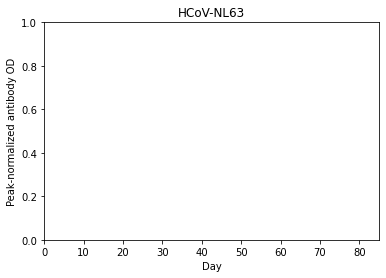

In [85]:
from matplotlib import pyplot as plt
plt.plot(nl63antibodytimecourse)
plt.ylim(0,1.0)
#####Added x limit
plt.xlim(0,85)
plt.xlabel("Day")
plt.ylabel("Peak-normalized antibody OD")
plt.title('HCoV-NL63')
plt.show()

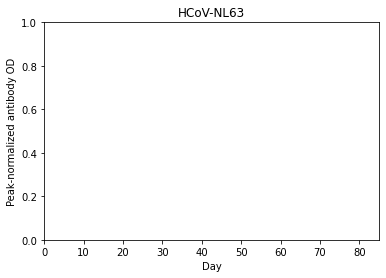

In [86]:
import matplotlib.pyplot as plt
import math

f = plt.figure()
plt.plot(nl63antibodytimecourse)
plt.ylim(0,1.0)
#####Added x limit
plt.xlim(0,85)
plt.xlabel("Day")
plt.ylabel("Peak-normalized antibody OD")
plt.title('HCoV-NL63')
plt.show()

f.savefig("HCoV-NL63_AntibodyTimecourse" + str(datetime.now().strftime('%Y_%m_%d_%H_%M_%S')) + ".pdf", bbox_inches='tight')

In [87]:
nl63lsfunc = 0
baseline = 0.1
currentMinValue = float('inf')
currentMinValue

for index in range(0, (len(nl63antibodytimecourse))):
    print(nl63antibodytimecourse[index])
    ##Need to find the step value and maximum value for this lambdaValue
    lambdaValue = 0.005
    
    ##Added 11/28
    nl63lsfunc = (nl63antibodytimecourse[index]) - math.pow((calculatelambda(baseline, lambdaValue, index)), 2)     
    print(oc43lsfunc)
    
    if nl63lsfunc < currentMinValue:
        currentMinValue = nl63lsfunc    

1.0
nan
nan
nan


In [88]:
print(currentMinValue)

0.0


In [89]:
nl63halflife  = np.log(2) / 0.0023166874396891007

In [90]:
print(nl63halflife )

299.19753898823984


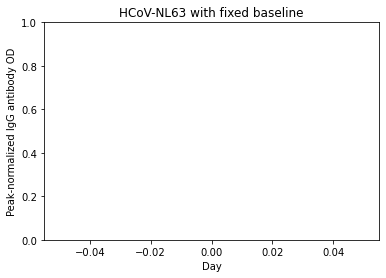

In [91]:
plt.plot(nl63antibodytimecourse, color='red')
plt.ylim(0,1.0)
plt.xlabel("Day")
plt.ylabel("Peak-normalized IgG antibody OD")
plt.title('HCoV-NL63 with fixed baseline')
plt.show()

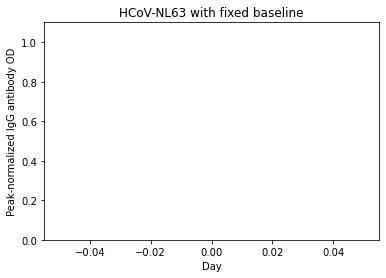

In [92]:
f2 = plt.figure()
plt.plot(nl63antibodytimecourse, color='red')
plt.ylim(0,1.1)
plt.xlabel("Day")
plt.ylabel("Peak-normalized IgG antibody OD")
plt.title('HCoV-NL63 with fixed baseline')
plt.show()

f2.savefig("HCoV-NL63_withFixedBaseline" + str(datetime.now().strftime('%Y_%m_%d_%H_%M_%S')) + ".pdf", bbox_inches='tight')

In [93]:
lambdaForPlot = 0.00231669
baseline = 0.249782
result = 0
plotBaseLines = list()

for days in range(0, 1675):
    exponentValue = -lambdaForPlot * days
    result = baseline + (1 - baseline) * math.exp(exponentValue)
    plotBaseLines.append(result)

print(plotBaseLines)

[1.0, 0.9982639891375209, 0.9965319954190115, 0.9948040095487662, 0.9930800222525902, 0.9913600242777485, 0.9896440063929177, 0.9879319593881355, 0.9862238740747515, 0.9845197412853779, 0.9828195518738405, 0.9811232967151293, 0.9794309667053493, 0.977742552761673, 0.9760580458222892, 0.9743774368463571, 0.9727007168139556, 0.9710278767260365, 0.9693589076043749, 0.9676938004915221, 0.9660325464507562, 0.964375136566036, 0.9627215619419511, 0.961071813703676, 0.9594258829969211, 0.9577837609878856, 0.9561454388632107, 0.9545109078299316, 0.9528801591154301, 0.9512531839673886, 0.9496299736537419, 0.9480105194626309, 0.946394812702356, 0.9447828447013304, 0.9431746068080333, 0.9415700903909632, 0.9399692868385927, 0.9383721875593207, 0.9367787839814281, 0.9351890675530299, 0.933603029742031, 0.9320206620360791, 0.9304419559425199, 0.9288669029883507, 0.9272954947201761, 0.9257277227041616, 0.9241635785259885, 0.922603053790809, 0.9210461401232011, 0.9194928291671236, 0.917943112585871, 0

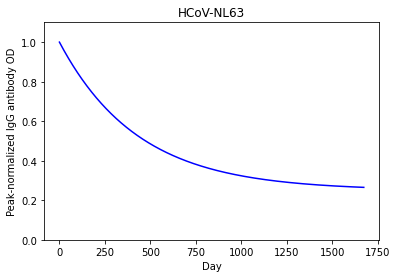

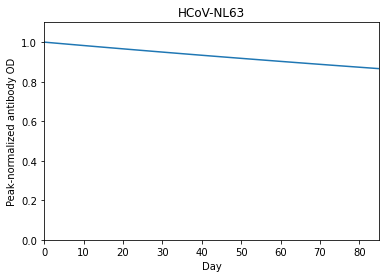

In [94]:
from matplotlib import pyplot as plt

plt.plot(nl63antibodytimecourse, color='red')
plt.ylim(0,1.1)
plt.xlabel("Day")

plt.plot(plotBaseLines, color = 'blue')

plt.ylabel("Peak-normalized IgG antibody OD")
plt.title('HCoV-NL63 with fixed baseline')
#plt.show()

plt.title('HCoV-NL63')
plt.show()

f2 = plt.figure()
plt.plot(plotBaseLines)
plt.ylim(0,1.1)
#####Added x limit
plt.xlim(0,85)
plt.xlabel("Day")
plt.ylabel("Peak-normalized antibody OD")
plt.title('HCoV-NL63')
plt.show()

f2.savefig("HCoV-NL63_withFixedBaseline" + str(datetime.now().strftime('%Y_%m_%d_%H_%M_%S')) + ".pdf", bbox_inches='tight')

In [95]:
nl63probnoreinfectiontimecourse = list()
day = 0
nl63probnoreinfectiontimecourse.append(1.0)

nl63probnoreinfectiontimecourse.append(nl63probnoreinfectiontimecourse[day] * (1-nl63probinfgivenaod(nl63antibodytimecourse[day+1], a, b)))

In [96]:
print(nl63probnoreinfectiontimecourse)

[1.0, nan]


In [97]:
#### Need to change days to 4393
while day < 85:
    
    if(day < len(nl63probnoreinfectiontimecourse)):        
        nl63probnoreinfectiontimecourse.append(nl63probnoreinfectiontimecourse[day] * (1 - nl63probinfgivenaod(nl63probnoreinfectiontimecourse[day + 1], a, b)))        
    else:        
        nl63probnoreinfectiontimecourse.append(nl63probnoreinfectiontimecourse[day] * (1 - nl63probinfgivenaod(nl63probnoreinfectiontimecourse[1392], a, b)))
            
    day = day + 1   

In [98]:
print(nl63probnoreinfectiontimecourse)

[1.0, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan]


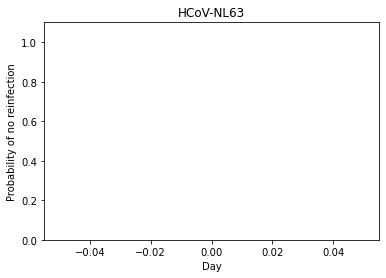

In [99]:
plt.plot(nl63probnoreinfectiontimecourse, color='blue')
plt.ylim(0,1.1)
plt.xlabel("Day")
plt.ylabel("Probability of no reinfection")
plt.title('HCoV-NL63')
plt.show()

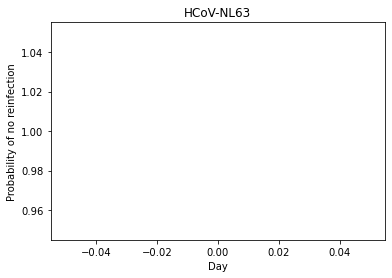

In [100]:
import matplotlib.pyplot as plt6

f6 = plt6.figure()
plt6.plot(nl63probnoreinfectiontimecourse, color = 'blue')

#plt6.ylim(0,0.007)
#plt6.xlim(0.0, 1.0)

plt6.xlabel("Day")
plt6.ylabel("Probability of no reinfection")
plt6.title('HCoV-NL63')
plt6.show()

f6.savefig("HCoV-NL63_PnorInfTimecourse-by-Day" + str(datetime.now().strftime('%Y_%m_%d_%H_%M_%S')) + ".pdf", bbox_inches='tight')

In [101]:
nl63probreinfection = list()

day = 0

#while day < 4393:
while day < 4393:
    day = day + 1  
        
    #if day < 1392:
    if day < 2:
        tempValue = nl63probinfgivenaod(oc43antibodytimecourse[day], a, b) * nl63probnoreinfectiontimecourse[day]
    else:
        #Not working
        #tempValue = oc43probinfgivenaod(oc43antibodytimecourse[lengthabtc], a, b)* oc43probnoreinfectiontimecourse[day]
        tempValue = nl63probinfgivenaod(oc43antibodytimecourse[1], a, b)* nl63probnoreinfectiontimecourse[1]
    
    nl63probreinfection.append(tempValue)      

In [102]:
print(nl63probreinfection)

[nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,

Text(0.5, 1.0, 'HCoV-NL63')

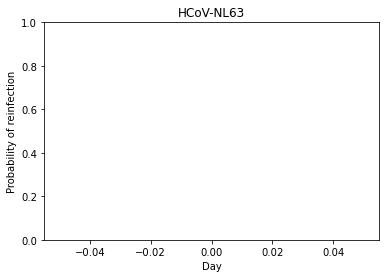

In [103]:
import matplotlib.pyplot as plt7
plt7.plot(nl63probreinfection)
plt7.ylim(0, 1.0)
plt7.xlabel("Day")
plt7.ylabel("Probability of reinfection")
plt7.title('HCoV-NL63') 

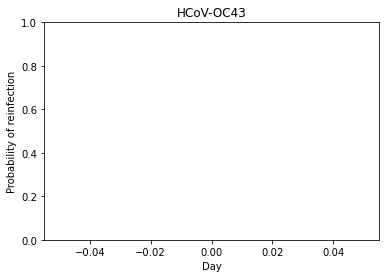

In [104]:
import matplotlib.pyplot as plt7

f = plt7.figure()

plt7.plot(nl63probreinfection)
plt7.ylim(0, 1.0)
plt7.xlabel("Day")
plt7.ylabel("Probability of reinfection")
plt7.title('HCoV-OC43') 
f.savefig("HCoV-NL63_PrInf-by-Day" + str(datetime.now().strftime('%Y_%m_%d_%H_%M_%S')) + ".pdf", bbox_inches='tight')

##### 229E Waning of Antibody OD

####### Input Data: ELIZA ODs for HCoV-229E N IgG antibodies converted to S IgG antibodies from the supplementary dataset 
####### of Edridge et al. 2020, "Seasonal coronavirus protective immunity is short-lasting", Nature Medicine. 
####### using a linear regression model of N and S IgG antibody data from Gudbjartsson et al. 2020, 
####### "Humoral Immune Response to SARS-CoV-2 in Iceland", New England Journal of Medicine.

In [105]:
x229edata = df2[df2.isin(["229E"]).any(axis=1)]

In [106]:
print(x229edata)

      Unnamed: 0     X      Date Virus  OD_value     V4     V5        V6  \
0              1     1   8/20/85  229E  0.614941  False    NaN       NaN   
1              1     2  11/18/85  229E  0.870174  False   90.0  0.002836   
2              1     3   2/14/86  229E  0.709271  False   88.0 -0.001828   
3              1     4   5/29/86  229E  0.617718  False  104.0 -0.000880   
4              1     5    9/5/86  229E  0.698786  False   99.0  0.000819   
...          ...   ...       ...   ...       ...    ...    ...       ...   
2780          10  2781    4/6/09  229E  0.649889  False  182.0  0.000359   
2781          10  2782   10/5/09  229E  0.562211   True  182.0 -0.000482   
2782          10  2783   3/29/10  229E  5.737067  False  175.0  0.029571   
2783          10  2784   9/20/10  229E  1.020412  False  175.0 -0.026952   
2784          10  2785   3/21/11  229E  0.873955    NaN  182.0 -0.000805   

            V8        V9  
0     0.149344       NaN  
1     0.211330  0.000689  
2     

In [107]:
x229edata.iloc[:1]

,Unnamed: 0,X,Date,Virus,OD_value,V4,V5,V6,V8,V9
0,1,1,8/20/85,229E,0.614941,False,NaN,NaN,0.149344,NaN


In [108]:
llx229elength = len(x229edata)

In [109]:
print(llx229elength)

513


In [110]:
##### Probability of Infection | Antibody OD

In [111]:
##### Probability of Infection | Antibody OD

In [112]:
###### llx229elrdaily = yet to do

##### 229E Waning of Antibody OD

In [113]:
print(x229edata)

      Unnamed: 0     X      Date Virus  OD_value     V4     V5        V6  \
0              1     1   8/20/85  229E  0.614941  False    NaN       NaN   
1              1     2  11/18/85  229E  0.870174  False   90.0  0.002836   
2              1     3   2/14/86  229E  0.709271  False   88.0 -0.001828   
3              1     4   5/29/86  229E  0.617718  False  104.0 -0.000880   
4              1     5    9/5/86  229E  0.698786  False   99.0  0.000819   
...          ...   ...       ...   ...       ...    ...    ...       ...   
2780          10  2781    4/6/09  229E  0.649889  False  182.0  0.000359   
2781          10  2782   10/5/09  229E  0.562211   True  182.0 -0.000482   
2782          10  2783   3/29/10  229E  5.737067  False  175.0  0.029571   
2783          10  2784   9/20/10  229E  1.020412  False  175.0 -0.026952   
2784          10  2785   3/21/11  229E  0.873955    NaN  182.0 -0.000805   

            V8        V9  
0     0.149344       NaN  
1     0.211330  0.000689  
2     

In [114]:
x229edataArr = x229edata.to_numpy()

In [115]:
import re

aod = 0
x229epaddedmeanwaning = dict();

index = 0

while aod <= 1.5:       
    index  = 2
    valueList = list()
    
    while index <= llx229elength:    
        #print("aod :" + str(aod))
        #print("index : " + str(index))
        print(x229edataArr[index-2])
        
        if ((x229edataArr[index-2][9] >= aod and aod >= x229edataArr[index-2][9]) or 
            (x229edataArr[index-2][9] <= aod and aod <= x229edataArr[index-2][9]) ) :
            if (x229edataArr[[index-1, 10]] != "NA" and re.match( r'^(F).*(E)$', x229edataArr[index-2][6] )):
                if x229edataArr[index-1][8].isnumeric() == True: 
                    valueList.append(x229edataArr[index-1][8])
                else:
                    valueList.append(0)
        average = grade_avg(valueList)
        print("average : " + str(average))
        x229epaddedmeanwaning["{0:.3f}".format(aod)] = average
        
        index = index + 1    
    aod = aod + 0.05

[1 1 '8/20/85' '229E' 0.614940589 False nan nan 0.149344324 nan]
average : nan
[1 2 '11/18/85' '229E' 0.870174098 False 90.0 0.0028359279999999997
 0.21133027199999999 0.0006887330000000001]
average : nan
[1 3 '2/14/86' '229E' 0.7092706459999999 False 88.0 -0.0018284479999999999
 0.172253299 -0.000444057]
average : nan
[1 4 '5/29/86' '229E' 0.617718497 False 104.0 -0.0008803089999999999
 0.150018966 -0.000213792]
average : nan
[1 5 '9/5/86' '229E' 0.6987859359999999 False 99.0 0.0008188630000000001
 0.16970698399999998 0.000198869]
average : nan
[1 6 '11/26/86' '229E' 0.762518067 False 82.0 0.000777221
 0.18518495399999998 0.000188756]
average : nan
[1 7 '3/4/87' '229E' 0.7026068940000001 False 98.0 -0.000611339
 0.170634941 -0.00014847]
average : nan
[1 8 '6/1/87' '229E' 1.974125176 False 89.0 0.014286722
 0.47943556600000004 0.00346967]
average : nan
[1 9 '8/20/87' '229E' 1.098260527 False 80.0 -0.010948308 0.266723288
 -0.002658903]
average : nan
[1 10 '11/19/87' '229E' 1.0053142529

average : nan
[5 1297 '8/2/89' '229E' 1.527617715 False 177.0 -0.007392245 0.370996871
 -0.0017952789999999999]
average : nan
[5 1298 '2/19/90' '229E' 1.165629887 False 201.0 -0.001800934
 0.28308459399999997 -0.000437375]
average : nan
[5 1299 '8/8/90' '229E' 1.153527005 False 170.0 -7.120000000000001e-05
 0.280145291 -1.73e-05]
average : nan
[5 1300 '2/7/91' '229E' 1.0104880440000001 False 183.0
 -0.0007816339999999999 0.24540688300000002 -0.000189827]
average : nan
[5 1301 '8/7/91' '229E' 1.023122591 False 181.0 6.979999999999999e-05
 0.248475307 1.7e-05]
average : nan
[5 1302 '2/5/92' '229E' 0.898627657 False 182.0 -0.000684038 0.218240497
 -0.000166125]
average : nan
[5 1303 '7/22/92' '229E' 0.936577958 False 168.0 0.000225895 0.227457098
 5.489999999999999e-05]
average : nan
[5 1304 '2/4/93' '229E' 0.95313106 False 197.0 8.4e-05 0.23147718
 2.0399999999999998e-05]
average : nan
[5 1305 '8/4/93' '229E' 1.001330562 False 181.0 0.00026629599999999996
 0.24318289999999998 6.47e-05]
a

 0.41650123 -0.000777188]
average : nan
[6 1573 '2/23/87' '229E' 1.487372376 False 91.0 -0.002501255
 0.36122289799999996 -0.000607454]
average : nan
[6 1574 '5/18/87' '229E' 1.403695717 False 84.0 -0.000996151
 0.34090120399999996 -0.000241925]
average : nan
[6 1575 '8/17/87' '229E' 1.329618449 False 91.0 -0.0008140360000000001
 0.322910817 -0.00019769700000000001]
average : nan
[6 1576 '11/16/87' '229E' 1.284290015 False 91.0 -0.000498115 0.311902364
 -0.000120972]
average : nan
[6 1577 '2/18/88' '229E' 1.326264024 False 94.0 0.00044653199999999997
 0.322096162 0.000108445]
average : nan
[6 1578 '5/26/88' '229E' 1.137940474 False 98.0 -0.001921669 0.27635995
 -0.000466696]
average : nan
[6 1579 '8/26/88' '229E' 1.369758656 False 92.0 0.002519763 0.332659258
 0.000611949]
average : nan
[6 1580 '11/28/88' '229E' 1.330324617 False 94.0 -0.00041951099999999996
 0.323082317 -0.00010188200000000001]
average : nan
[6 1581 '2/23/89' '229E' 1.1796485429999999 False 87.0 -0.001731909
 0.286489

[3 631 '1/31/85' '229E' 1.149688737 False nan nan 0.27921313 nan]
average : nan
[3 632 '5/2/85' '229E' 1.161873888 False 91.0 0.000133903 0.282172413
 3.2500000000000004e-05]
average : nan
[3 633 '8/6/85' '229E' 1.108174705 False 96.0 -0.0005593659999999999
 0.269131042 -0.000135848]
average : nan
[3 634 '11/5/85' '229E' 1.031716024 False 91.0 -0.000840205 0.250562306
 -0.000204052]
average : nan
[3 635 '2/4/86' '229E' 1.153183433 False 91.0 0.0013348070000000001
 0.28006185100000003 0.000324171]
average : nan
[3 636 '5/6/86' '229E' 1.131256969 False 91.0 -0.00024095 0.274736796
 -5.85e-05]
average : nan
[3 637 '8/6/86' '229E' 1.0974610790000001 False 92.0
 -0.00036734699999999996 0.266529134 -8.92e-05]
average : nan
[3 638 '11/11/86' '229E' 1.05270975 False 97.0 -0.00046135400000000003
 0.255660837 -0.000112044]
average : nan
[3 639 '2/11/87' '229E' 0.9112729159999999 False 92.0 -0.001537357
 0.221311521 -0.00037336199999999997]
average : nan
[3 640 '5/11/87' '229E' 0.942157583 False 

average : nan
[4 1041 '11/6/08' '229E' 1.05671508 True 211.0 -0.000904492 0.25663357
 -0.000219665]
average : nan
[4 1042 '4/23/09' '229E' 2.190231292 False 168.0 0.00674712 0.531919045
 0.0016386039999999999]
average : nan
[4 1043 '10/29/09' '229E' 0.899682827 True 189.0 -0.006828299 0.218496755
 -0.001658319]
average : nan
[4 1044 '4/28/10' '229E' 1.4905496269999998 False 181.0 0.003264457
 0.361994524 0.000792805]
average : nan
[4 1045 '10/20/10' '229E' 0.9318233579999999 nan 175.0
 -0.0031927220000000003 0.226302397 -0.000775384]
average : nan
[5 1281 '5/6/85' '229E' 0.8164944129999999 False nan nan 0.198293637 nan]
average : nan
[5 1282 '8/6/85' '229E' 0.7251650829999999 False 92.0 -0.00099271
 0.176113418 -0.00024108900000000002]
average : nan
[5 1283 '11/6/85' '229E' 0.70038138 False 92.0 -0.000269388
 0.17009445399999998 -6.54e-05]
average : nan
[5 1284 '2/5/86' '229E' 0.716438535 False 91.0 0.000176452 0.17399409
 4.29e-05]
average : nan
[5 1285 '4/28/86' '229E' 1.14721437 Fal

 3.4899999999999995e-05]
average : nan
[1 44 '4/9/13' '229E' 0.9298237090000001 False 363.0
 1.3800000000000002e-05 0.225816762 3.36e-06]
average : nan
[1 45 '4/15/14' '229E' 6.2808771729999995 False 371.0 0.014423325
 1.52537232 0.003502845]
average : nan
[1 46 '4/28/15' '229E' 2.081023209 False 378.0 -0.011110725 0.505396796
 -0.0026983479999999997]
average : nan
[1 47 '8/30/17' '229E' 1.458228289 nan 855.0 -0.000728415 0.354144972
 -0.00017690299999999998]
average : nan
[2 279 '3/1/85' '229E' 0.851638232 False nan nan 0.20682865600000003 nan]
average : nan
[2 280 '5/31/85' '229E' 0.765329068 False 91.0 -0.000948452 0.185867633
 -0.00023034099999999998]
average : nan
[2 281 '9/5/85' '229E' 0.75440723 False 97.0 -0.000112596 0.183215159
 -2.7300000000000003e-05]
average : nan
[2 282 '12/5/85' '229E' 0.74396914 False 91.0 -0.00011470399999999999
 0.180680167 -2.7899999999999997e-05]
average : nan
[2 283 '3/20/86' '229E' 0.730562756 False 105.0 -0.00012768 0.177424295
 -3.1e-05]
average

average : nan
[5 1327 '4/8/10' '229E' 0.889211658 False 175.0 6.24e-05 0.21595373
 1.51e-05]
average : nan
[5 1328 '10/7/10' '229E' 0.9068092390000001 nan 182.0 9.67e-05
 0.22022747399999998 2.35e-05]
average : nan
[6 1564 '11/28/84' '229E' 1.2994815240000002 False nan nan 0.315591771 nan]
average : nan
[6 1565 '2/27/85' '229E' 1.368807321 False 91.0 0.000761822
 0.33242821699999997 0.00018501599999999998]
average : nan
[6 1566 '5/24/85' '229E' 1.176141005 False 86.0 -0.002240306
 0.28563732199999997 -0.00054408]
average : nan
[6 1567 '8/27/85' '229E' 1.2328348059999998 False 95.0
 0.0005967769999999999 0.299405965 0.000144933]
average : nan
[6 1568 '11/29/85' '229E' 1.234947228 False 94.0 2.25e-05
 0.29991898699999997 5.46e-06]
average : nan
[6 1569 '2/28/86' '229E' 1.203218946 False 91.0 -0.00034866199999999996
 0.292213464 -8.47e-05]
average : nan
[6 1570 '5/30/86' '229E' 1.292177183 False 91.0 0.000977563 0.31381784
 0.00023741099999999998]
average : nan
[6 1571 '8/28/86' '229E' 1.

average : nan
[9 2374 '12/16/13' '229E' 1.219475865 False 196.0 -0.000135874 0.296161615
 -3.3e-05]
average : nan
[9 2375 '6/16/14' '229E' 3.071739749 False 182.0 0.010177274 0.746001977
 0.00247165]
average : nan
[9 2376 '12/11/14' '229E' 2.21703581 False 178.0 -0.004801708
 0.5384287839999999 -0.001166142]
average : nan
[9 2377 '6/11/15' '229E' 2.030635041 False 182.0 -0.00102418
 0.49315953799999995 -0.000248732]
average : nan
[9 2378 '12/17/15' '229E' 1.436439379 False 189.0 -0.003143892 0.348853322
 -0.000763525]
average : nan
[9 2379 '6/23/16' '229E' 1.3654807340000001 False 189.0
 -0.00037544300000000004 0.331620323 -9.120000000000001e-05]
average : nan
[9 2380 '12/15/16' '229E' 1.215114711 False 175.0 -0.000859234 0.295102467
 -0.00020867299999999999]
average : nan
[9 2381 '4/24/17' '229E' 2.146119797 False 130.0 0.007161578
 0.5212061379999999 0.001739259]
average : nan
[9 2382 '9/26/17' '229E' 1.6382786630000001 False 155.0 -0.003276394
 0.397871962 -0.0007957039999999999]
av

 0.35730282700000005 -0.001323617]
average : nan
[9 2347 '5/24/94' '229E' 1.254965117 False 183.0 -0.001181781
 0.30478052699999997 -0.000287007]
average : nan
[9 2348 '11/29/94' '229E' 0.9824647559999999 False 189.0
 -0.0014418010000000002 0.23860115399999998 -0.000350155]
average : nan
[9 2349 '5/30/95' '229E' 0.6788789959999999 False 182.0 -0.001668054
 0.16487239 -0.00040510300000000003]
average : nan
[9 2350 '12/4/95' '229E' 0.7233422840000001 False 188.0 0.000236507
 0.175670733 5.739999999999999e-05]
average : nan
[9 2351 '5/30/96' '229E' 0.63658915 False 178.0 -0.000487377
 0.15460188800000002 -0.000118364]
average : nan
[9 2352 '12/3/96' '229E' 0.737817526 False 187.0 0.000541328 0.179186187
 0.00013146700000000002]
average : nan
[9 2353 '4/10/03' '229E' 0.516364292 False 2319.0 -9.549999999999999e-05
 0.12540410800000001 -2.3199999999999998e-05]
average : nan
[9 2354 '10/13/03' '229E' 0.501978449 False 186.0 -7.730000000000001e-05
 0.121910365 -1.88e-05]
average : nan
[9 2355

 0.24520609100000001 -0.00011808700000000001]
average : nan
[10 2748 '11/24/87' '229E' 0.97558663 False 89.0 -0.00038286099999999997
 0.23693073399999998 -9.300000000000001e-05]
average : nan
[10 2749 '2/11/88' '229E' 0.967541933 False 79.0 -0.00010183200000000001
 0.23497700100000002 -2.47e-05]
average : nan
[10 2750 '5/19/88' '229E' 0.8814480659999999 False 98.0 -0.000878509
 0.214068265 -0.00021335400000000002]
average : nan
[10 2751 '8/18/88' '229E' 0.9548865040000001 False 91.0 0.000807016
 0.23190350699999998 0.000195992]
average : nan
[10 2752 '11/17/88' '229E' 1.05235323 False 91.0 0.0010710630000000001
 0.255574252 0.000260118]
average : nan
[10 2753 '5/29/89' '229E' 1.048610236 False 193.0 -1.9399999999999997e-05
 0.25466523 -4.71e-06]
average : nan
[10 2754 '11/27/89' '229E' 0.91223386 False 182.0 -0.0007493210000000001
 0.22154489600000002 -0.00018198]
average : nan
[10 2755 '5/21/90' '229E' 0.931685725 False 175.0 0.000111154 0.226268971
 2.7000000000000002e-05]
average : 

 -6.709999999999999e-05 0.20208117 -1.63e-05]
average : nan
[3 669 '8/8/06' '229E' 0.7938378340000001 False 180.0
 -0.00021251200000000001 0.19279126600000002 -5.16e-05]
average : nan
[3 670 '2/20/07' '229E' 0.656621046 False 196.0 -0.000700086 0.159466829
 -0.000170023]
average : nan
[3 671 '8/29/07' '229E' 1.177465236 False 190.0 0.002741285 0.285958924
 0.0006657480000000001]
average : nan
[3 672 '2/20/08' '229E' 0.912319323 False 175.0 -0.00151512 0.221565651
 -0.00036796199999999994]
average : nan
[3 673 '10/15/08' '229E' 0.84466297 False 238.0 -0.00028427 0.205134646
 -6.9e-05]
average : nan
[3 674 '4/23/09' '229E' 0.843676401 False 190.0 -5.19e-06 0.204895048
 -1.26e-06]
average : nan
[3 675 '10/6/09' '229E' 0.855541075 False 166.0 7.15e-05
 0.20777649999999998 1.74e-05]
average : nan
[3 676 '3/30/10' '229E' 0.837011161 False 175.0 -0.000105885
 0.20327632899999998 -2.57e-05]
average : nan
[3 677 '9/30/10' '229E' 0.917976604 False 184.0 0.00044003 0.222939577
 0.000106865]
avera

 3.06e-05]
average : nan
[10 2737 '4/24/85' '229E' 1.025535178 False nan nan 0.249061227 nan]
average : nan
[10 2738 '5/23/85' '229E' 2.264367633 False 29.0 0.042718360999999996
 0.549923779 0.010374570999999999]
average : nan
[10 2739 '8/23/85' '229E' 1.2378282170000001 False 92.0
 -0.011158036999999999 0.300618663 -0.002709838]
average : nan
[10 2740 '11/22/85' '229E' 1.13305754 False 91.0 -0.001151326 0.275174082
 -0.000279611]
average : nan
[10 2741 '2/21/86' '229E' 1.2484322159999999 False 91.0 0.001267854
 0.303193948 0.00030791099999999996]
average : nan
[10 2742 '5/23/86' '229E' 1.084078539 False 91.0 -0.001806084 0.263279053
 -0.000438625]
average : nan
[10 2743 '8/11/86' '229E' 1.2240519509999999 False 80.0
 0.0017496679999999998 0.297272963 0.000424924]
average : nan
[10 2744 '11/13/86' '229E' 1.762840554 False 94.0 0.005731794 0.428123033
 0.0013920220000000001]
average : nan
[10 2745 '2/24/87' '229E' 1.2298451670000001 False 103.0 -0.005174712
 0.298679902 -0.001256729]
av

 0.00117482]
average : nan
[4 1027 '11/8/95' '229E' 0.667492437 True 182.0 -0.004521311 0.162107053
 -0.0010980439999999998]
average : nan
[4 1028 '4/22/96' '229E' 3.6397978930000003 False 166.0 0.017905455
 0.8839604409999999 0.004348514]
average : nan
[4 1029 '10/22/96' '229E' 1.866762614 False 183.0 -0.009688717 0.45336152
 -0.002353]
average : nan
[4 1030 '5/13/03' '229E' 1.179792225 False 2394.0 -0.000286955 0.286524056
 -6.97e-05]
average : nan
[4 1031 '11/25/03' '229E' 0.995158019 False 196.0 -0.0009420110000000001
 0.24168383699999998 -0.000228777]
average : nan
[4 1032 '5/10/04' '229E' 0.8879019920000001 False 167.0 -0.000642252
 0.21563566399999998 -0.00015597700000000001]
average : nan
[4 1033 '10/13/04' '229E' 0.8706490170000001 True 156.0
 -0.00011059600000000001 0.211445611 -2.6899999999999997e-05]
average : nan
[4 1034 '4/13/05' '229E' 1.777036742 False 182.0 0.004980152 0.431570716
 0.0012094789999999998]
average : nan
[4 1035 '10/12/05' '229E' 0.8179304490000001 True 1

average : nan
[10 2739 '8/23/85' '229E' 1.2378282170000001 False 92.0
 -0.011158036999999999 0.300618663 -0.002709838]
average : nan
[10 2740 '11/22/85' '229E' 1.13305754 False 91.0 -0.001151326 0.275174082
 -0.000279611]
average : nan
[10 2741 '2/21/86' '229E' 1.2484322159999999 False 91.0 0.001267854
 0.303193948 0.00030791099999999996]
average : nan
[10 2742 '5/23/86' '229E' 1.084078539 False 91.0 -0.001806084 0.263279053
 -0.000438625]
average : nan
[10 2743 '8/11/86' '229E' 1.2240519509999999 False 80.0
 0.0017496679999999998 0.297272963 0.000424924]
average : nan
[10 2744 '11/13/86' '229E' 1.762840554 False 94.0 0.005731794 0.428123033
 0.0013920220000000001]
average : nan
[10 2745 '2/24/87' '229E' 1.2298451670000001 False 103.0 -0.005174712
 0.298679902 -0.001256729]
average : nan
[10 2746 '5/21/87' '229E' 1.057312257 False 86.0 -0.002006197 0.256778601
 -0.000487224]
average : nan
[10 2747 '8/27/87' '229E' 1.009661261 False 98.0 -0.000486235
 0.24520609100000001 -0.000118087000

average : nan
[5 1317 '4/19/05' '229E' 2.8425734410000003 False 181.0
 0.011650536999999999 0.690346703 0.002829447]
average : nan
[5 1318 '10/26/05' '229E' 1.361397365 False 190.0 -0.007795664 0.330628637
 -0.001893253]
average : nan
[5 1319 '4/24/06' '229E' 1.10519127 False 180.0 -0.001423367 0.268406486
 -0.000345679]
average : nan
[5 1320 '10/23/06' '229E' 1.221952556 False 182.0 0.000641546 0.296763104
 0.000155806]
average : nan
[5 1321 '4/25/07' '229E' 1.06961505 False 184.0 -0.000827921 0.259766454
 -0.000201069]
average : nan
[5 1322 '10/23/07' '229E' 1.140936889 False 181.0 0.000394043 0.277087659
 9.570000000000001e-05]
average : nan
[5 1323 '4/24/08' '229E' 0.8671340790000001 False 184.0 -0.001488059
 0.210591974 -0.00036139]
average : nan
[5 1324 '10/21/08' '229E' 0.779924614 False 180.0 -0.00048449699999999997
 0.18941230399999998 -0.000117665]
average : nan
[5 1325 '4/15/09' '229E' 0.8367111309999999 False 176.0
 0.00032265099999999997 0.20320346399999997 7.8400000000000

 2.34e-05]
average : nan
[2 319 '10/13/09' '229E' 1.505903044 True 189.0 0.001040053 0.365723251
 0.000252587]
average : nan
[2 320 '4/13/10' '229E' 2.346338673 False 182.0 0.0046177779999999995
 0.569831246 0.0011214719999999999]
average : nan
[2 321 '10/12/10' '229E' 1.527676995 False 182.0 -0.004498141
 0.37101126799999995 -0.001092417]
average : nan
[2 322 '4/26/11' '229E' 1.3783155009999999 False 196.0 -0.000762048
 0.334737371 -0.00018507099999999998]
average : nan
[2 323 '10/18/11' '229E' 1.190649552 False 175.0 -0.001072377
 0.28916086399999996 -0.00026043700000000003]
average : nan
[2 324 '4/24/12' '229E' 1.2605728059999999 False 189.0 0.000369964
 0.306142409 8.98e-05]
average : nan
[2 325 '10/30/12' '229E' 1.1281709979999999 False 189.0
 -0.0007005389999999999 0.273987337 -0.000170133]
average : nan
[2 326 '4/22/13' '229E' 1.8185961480000001 False 174.0 0.003967961
 0.44166382299999996 0.000963658]
average : nan
[2 327 '10/28/13' '229E' 0.7984519809999999 False 189.0 -0.0053

 -0.0014879079999999998]
average : nan
[4 1020 '4/28/92' '229E' 0.8045406270000001 False 181.0 -0.000421243
 0.195390543 -0.00010230299999999999]
average : nan
[4 1021 '10/28/92' '229E' 0.7661549259999999 False 183.0 -0.000209758
 0.18606820100000002 -5.0900000000000004e-05]
average : nan
[4 1022 '4/27/93' '229E' 0.668691434 False 181.0 -0.000538472 0.162398241
 -0.000130773]
average : nan
[4 1023 '11/8/93' '229E' 0.690845591 False 195.0 0.00011361100000000001
 0.16777859399999998 2.7600000000000003e-05]
average : nan
[4 1024 '5/16/94' '229E' 0.649468216 False 189.0 -0.000218928 0.157729695
 -5.3200000000000006e-05]
average : nan
[4 1025 '11/9/94' '229E' 0.609956313 True 177.0 -0.00022323099999999998
 0.14813384400000001 -5.42e-05]
average : nan
[4 1026 '5/10/95' '229E' 1.490370987 False 182.0 0.004837443 0.36195114
 0.00117482]
average : nan
[4 1027 '11/8/95' '229E' 0.667492437 True 182.0 -0.004521311 0.162107053
 -0.0010980439999999998]
average : nan
[4 1028 '4/22/96' '229E' 3.639797

[1 18 '6/26/91' '229E' 0.846944099 False 191.0 -0.000344209 0.20568864
 -8.36e-05]
average : nan
[1 19 '12/20/91' '229E' 0.870990252 False 177.0 0.000135854
 0.21152848300000002 3.3e-05]
average : nan
[1 20 '12/11/92' '229E' 0.791353503 False 357.0 -0.000223072
 0.19218792199999998 -5.42e-05]
average : nan
[1 21 '6/11/93' '229E' 0.823409288 False 182.0 0.000176131 0.199972982
 4.28e-05]
average : nan
[1 22 '12/9/93' '229E' 0.752648985 False 181.0 -0.000390941
 0.18278815199999998 -9.49e-05]
average : nan
[1 23 '6/9/94' '229E' 0.810897724 False 182.0 0.00032004799999999997
 0.19693442600000002 7.77e-05]
average : nan
[1 24 '12/8/94' '229E' 1.054162315 False 182.0 0.001336619 0.256013606
 0.000324611]
average : nan
[1 25 '6/15/95' '229E' 0.7342739559999999 False 189.0
 -0.0016925310000000002 0.178325596 -0.000411048]
average : nan
[1 26 '12/11/95' '229E' 0.9858938629999999 False 179.0 0.001405698
 0.23943394699999998 0.00034138699999999996]
average : nan
[1 27 '6/10/96' '229E' 0.93723560

[9 2342 '11/4/91' '229E' 0.641994815 False 165.0 -0.0008119910000000001
 0.155914706 -0.0001972]
average : nan
[9 2343 '5/10/92' '229E' 0.705770103 False 188.0 0.00033923 0.171403158
 8.240000000000001e-05]
average : nan
[9 2344 '11/9/92' '229E' 0.653394394 True 183.0 -0.000286206 0.158683205
 -6.95e-05]
average : nan
[9 2345 '5/11/93' '229E' 2.534006565 False 183.0 0.010276569000000001
 0.615408225 0.002495765]
average : nan
[9 2346 '11/22/93' '229E' 1.471231084 False 195.0 -0.0054501309999999996
 0.35730282700000005 -0.001323617]
average : nan
[9 2347 '5/24/94' '229E' 1.254965117 False 183.0 -0.001181781
 0.30478052699999997 -0.000287007]
average : nan
[9 2348 '11/29/94' '229E' 0.9824647559999999 False 189.0
 -0.0014418010000000002 0.23860115399999998 -0.000350155]
average : nan
[9 2349 '5/30/95' '229E' 0.6788789959999999 False 182.0 -0.001668054
 0.16487239 -0.00040510300000000003]
average : nan
[9 2350 '12/4/95' '229E' 0.7233422840000001 False 188.0 0.000236507
 0.175670733 5.73999

average : nan
[6 1575 '8/17/87' '229E' 1.329618449 False 91.0 -0.0008140360000000001
 0.322910817 -0.00019769700000000001]
average : nan
[6 1576 '11/16/87' '229E' 1.284290015 False 91.0 -0.000498115 0.311902364
 -0.000120972]
average : nan
[6 1577 '2/18/88' '229E' 1.326264024 False 94.0 0.00044653199999999997
 0.322096162 0.000108445]
average : nan
[6 1578 '5/26/88' '229E' 1.137940474 False 98.0 -0.001921669 0.27635995
 -0.000466696]
average : nan
[6 1579 '8/26/88' '229E' 1.369758656 False 92.0 0.002519763 0.332659258
 0.000611949]
average : nan
[6 1580 '11/28/88' '229E' 1.330324617 False 94.0 -0.00041951099999999996
 0.323082317 -0.00010188200000000001]
average : nan
[6 1581 '2/23/89' '229E' 1.1796485429999999 False 87.0 -0.001731909
 0.286489162 -0.000420611]
average : nan
[6 1582 '5/18/89' '229E' 1.172300914 False 84.0 -8.75e-05 0.284704718
 -2.12e-05]
average : nan
[6 1583 '8/8/89' '229E' 1.019219226 False 82.0 -0.00186685
 0.24752733600000001 -0.000453383]
average : nan
[6 1584 '1

In [116]:
for key in dict(x229epaddedmeanwaning):
    print(key)

0.000
0.050
0.100
0.150
0.200
0.250
0.300
0.350
0.400
0.450
0.500
0.550
0.600
0.650
0.700
0.750
0.800
0.850
0.900
0.950
1.000
1.050
1.100
1.150
1.200
1.250
1.300
1.350
1.400
1.450


In [117]:
(k := next(iter(x229epaddedmeanwaning)), x229epaddedmeanwaning.pop(k))

('0.000', nan)

In [118]:
updict = {'0.05':'0', '0': '0'}

# ** operator for packing and unpacking items in order
x229epaddedmeanwaningNew = {**updict, **x229epaddedmeanwaning}
print(x229epaddedmeanwaningNew)

{'0.05': '0', '0': '0', '0.050': nan, '0.100': nan, '0.150': nan, '0.200': nan, '0.250': nan, '0.300': nan, '0.350': nan, '0.400': nan, '0.450': nan, '0.500': nan, '0.550': nan, '0.600': nan, '0.650': nan, '0.700': nan, '0.750': nan, '0.800': nan, '0.850': nan, '0.900': nan, '0.950': nan, '1.000': nan, '1.050': nan, '1.100': nan, '1.150': nan, '1.200': nan, '1.250': nan, '1.300': nan, '1.350': nan, '1.400': nan, '1.450': nan}


In [119]:
x229emeanwaning = x229epaddedmeanwaningNew

In [120]:
import numpy as np

aodList = list(x229emeanwaning.keys())
print(aodList)

arraod = np.array(aodList)
arraod = arraod.astype(float)

['0.05', '0', '0.050', '0.100', '0.150', '0.200', '0.250', '0.300', '0.350', '0.400', '0.450', '0.500', '0.550', '0.600', '0.650', '0.700', '0.750', '0.800', '0.850', '0.900', '0.950', '1.000', '1.050', '1.100', '1.150', '1.200', '1.250', '1.300', '1.350', '1.400', '1.450']


In [121]:
covdataList = list(x229emeanwaning.values())
print(covdataList)

arrcov = np.array(covdataList).squeeze()

['0', '0', nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan]


In [122]:
from scipy.interpolate import interp1d
print(len(aodList))
print(len(covdataList))

y_interpolation = interp1d(arraod, arrcov)

31
31


In [123]:
x229eantibodytimecourse = list()

x229eantibodytimecourse.append(1.0)

In [124]:
print(str(x229eantibodytimecourse))

[1.0]


##### Populating a dictionary for the interpolate values

In [125]:
day = 0
print("Populating a dictionary for the interpolate values")

while x229eantibodytimecourse[day] >= 0.1:
    print("For day : " +  str(day))
    print("x229eantibodytimecourse[day] : " + str(x229eantibodytimecourse[day]))
    print("x229eantibodytimecourse : " + str(x229eantibodytimecourse))
    print("inerpolate of x229emeanwaning")
    print(y_interpolation(x229eantibodytimecourse[day]))
    print("Added value")
    x229eantibodytimecourse.append(x229eantibodytimecourse[day] + y_interpolation(x229eantibodytimecourse[day]))    
    day = day + 1

Populating a dictionary for the interpolate values
For day : 0
x229eantibodytimecourse[day] : 1.0
x229eantibodytimecourse : [1.0]
inerpolate of x229emeanwaning
nan
Added value


In [126]:
print(x229eantibodytimecourse)

[1.0, nan]


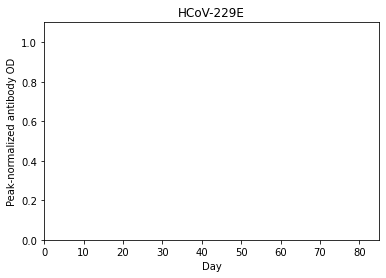

In [127]:
from matplotlib import pyplot as plt
plt.plot(x229eantibodytimecourse)
plt.ylim(0,1.1)
#####Added x limit
plt.xlim(0,85)
plt.xlabel("Day")
plt.ylabel("Peak-normalized antibody OD")
plt.title('HCoV-229E')
plt.show()

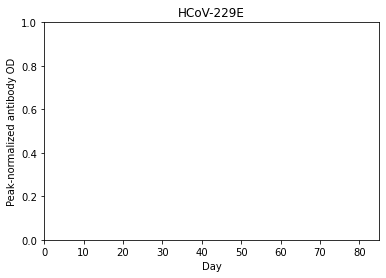

In [128]:
import matplotlib.pyplot as plt
import math

f = plt.figure()
plt.plot(x229eantibodytimecourse)
plt.ylim(0,1.0)
#####Added x limit
plt.xlim(0,85)
plt.xlabel("Day")
plt.ylabel("Peak-normalized antibody OD")
plt.title('HCoV-229E')
plt.show()

f.savefig("HCoV-229E_AntibodyTimecourse" + str(datetime.now().strftime('%Y_%m_%d_%H_%M_%S')) + ".pdf", bbox_inches='tight')

###### Export to Excel

In [129]:
from datetime import datetime

df3 = pd.DataFrame(x229eantibodytimecourse, columns=["Antibody Time Course"])
df3.to_csv('HCoV-229E-Antibody-Time-Course' + str(datetime.now().strftime('%Y_%m_%d_%H_%M_%S')) + '.csv', index=False)

In [130]:
len(x229eantibodytimecourse)

2

In [131]:
import math

def calculatelambda(sarscov1baseline, lambdaValue, index):
    exponentValue = -lambdaValue * index
    result = sarscov1baseline + (1 - sarscov1baseline) * math.exp(exponentValue)
    return result

In [132]:
x229elsfunc = 0
baseline = 0.1
currentMinValue = float('inf')
currentMinValue

for index in range(0, (len(x229eantibodytimecourse))):
    print(x229eantibodytimecourse[index])
    ##Need to find the step value and maximum value for this lambdaValue
    lambdaValue = 0.005
    
    ##Added 11/28
    x229elsfunc = (x229eantibodytimecourse[index]) - math.pow((calculatelambda(baseline, lambdaValue, index)), 2)     
    print(x229elsfunc)
    
    if x229elsfunc < currentMinValue:
        currentMinValue = x229elsfunc      

1.0
0.0
nan
nan


In [133]:
print(currentMinValue)

0.0


In [134]:
x229ehalflife = np.log(2) / 0.005241500716948157

In [135]:
print(x229ehalflife)

132.24212262695778


##### Added as part of python code

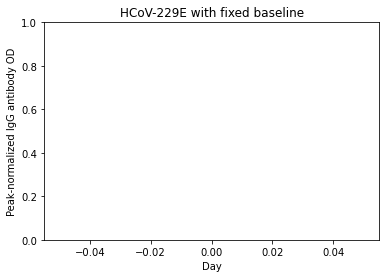

In [136]:
plt.plot(x229eantibodytimecourse, color='red')
plt.ylim(0,1.0)
plt.xlabel("Day")
plt.ylabel("Peak-normalized IgG antibody OD")
plt.title('HCoV-229E with fixed baseline')
plt.show()

##### Added as part of python code

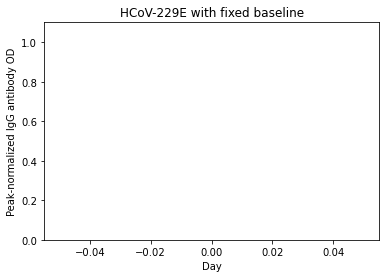

In [137]:
f2 = plt.figure()
plt.plot(x229eantibodytimecourse, color='red')
plt.ylim(0,1.1)
plt.xlabel("Day")
plt.ylabel("Peak-normalized IgG antibody OD")
plt.title('HCoV-229E with fixed baseline')
plt.show()

f2.savefig("HCoV-229E_withFixedBaseline" + str(datetime.now().strftime('%Y_%m_%d_%H_%M_%S')) + ".pdf", bbox_inches='tight')

In [138]:
lambdaForPlot = 0.005241500716948157
baseline = 0.0999574
result = 0
plotBaseLines = list()

for days in range(0, len(x229eantibodytimecourse)):
    exponentValue = -lambdaForPlot * days
    result = baseline + (1 - baseline) * math.exp(exponentValue)
    plotBaseLines.append(result)

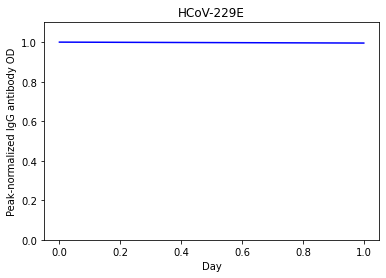

In [139]:
from matplotlib import pyplot as plt

plt.plot(x229eantibodytimecourse, color='red')
plt.ylim(0,1.1)
plt.xlabel("Day")

plt.plot(plotBaseLines, color = 'blue')

plt.ylabel("Peak-normalized IgG antibody OD")
plt.title('HCoV-229E with fixed baseline')
#plt.show()

plt.title('HCoV-229E')
plt.show()

In [140]:
len(x229eantibodytimecourse)

2

In [141]:
x229eantibodytimecourseplusexp = x229eantibodytimecourse
day = len(x229eantibodytimecourse)

print(day)

2


In [142]:
#while day < 4393 - Length[oc43antibodytimecourse]:
#Small file 86 records
#while day < 89:
maxDays = 2
while day < maxDays:
    day = day + 1
    print("day : " + str(day))
    exponentValueBaseLine = -0.005241500716948157
    tempValue = 0.09995743181844773 + (x229eantibodytimecourseplusexp[day-1] - 0.09995743181844773) * math.exp(exponentValueBaseLine)
    print('tempValue' + str(tempValue))
    x229eantibodytimecourseplusexp.append(tempValue)

In [143]:
print(x229eantibodytimecourseplusexp)

[1.0, nan]


Text(0.5, 1.0, 'HCoV-229E')

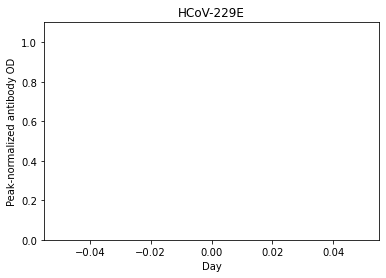

In [144]:
import matplotlib.pyplot as plt2
plt2.plot(x229eantibodytimecourseplusexp)
plt2.ylim(0,1.1)
plt2.xlabel("Day")
plt2.ylabel("Peak-normalized antibody OD")
plt2.title('HCoV-229E')

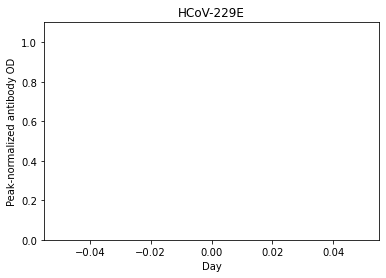

In [145]:
import matplotlib.pyplot as plt3

f = plt3.figure()
plt3.plot(x229eantibodytimecourseplusexp)

plt3.ylim(0,1.1)
plt3.xlabel("Day")
plt3.ylabel("Peak-normalized antibody OD")
plt3.title('HCoV-229E')
plt3.show()

f.savefig("HCoV-229E_nOD-by-Day_" + str(datetime.now().strftime('%Y_%m_%d_%H_%M_%S')) + ".pdf", bbox_inches='tight')

In [146]:
import math

a = 1
b = 1

def x229eprobinfgivenaod(aod, a, b):
    exponentValue = -(a + b * aod)   
    result = 1 / (1 + math.exp(exponentValue))
    return result

In [147]:
x229eprobnoreinfectiontimecourse = list()
day = 0
x229eprobnoreinfectiontimecourse.append(1.0)

x229eprobnoreinfectiontimecourse.append(x229eprobnoreinfectiontimecourse[day] * (1-x229eprobinfgivenaod(x229eantibodytimecourse[day+1], a, b)))

In [148]:
print(x229eprobnoreinfectiontimecourse)

[1.0, nan]


In [149]:
#### Need to change days to 4393
while day < 1:
    
    if(day < lengthabtc):
        x229eprobnoreinfectiontimecourse.append(x229eprobnoreinfectiontimecourse[day] * (1 - x229eprobinfgivenaod(x229eantibodytimecourse[day + 1], a, b)))
    else:
        x229eprobnoreinfectiontimecourse.append(x229eprobnoreinfectiontimecourse[day] * (1 - x229eprobinfgivenaod(x229eantibodytimecourse[1392], a, b)))
            
    day = day + 1   

In [150]:
print(x229eprobnoreinfectiontimecourse)

[1.0, nan, nan]


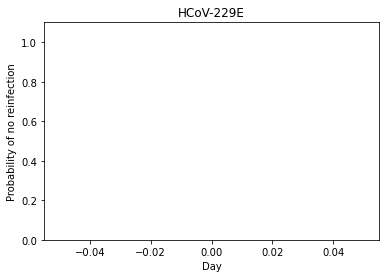

In [151]:
plt.plot(x229eprobnoreinfectiontimecourse, color='blue')
plt.ylim(0,1.1)
plt.xlabel("Day")
plt.ylabel("Probability of no reinfection")
plt.title('HCoV-229E')
plt.show()

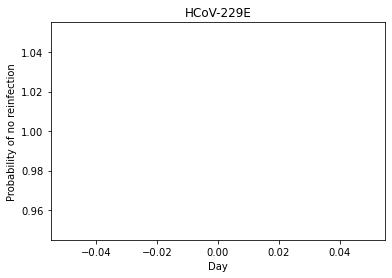

In [152]:
import matplotlib.pyplot as plt6

f6 = plt6.figure()
plt6.plot(x229eprobnoreinfectiontimecourse, color = 'blue')

#plt6.ylim(0,0.007)
#plt6.xlim(0.0, 1.0)

plt6.xlabel("Day")
plt6.ylabel("Probability of no reinfection")
plt6.title('HCoV-229E')
plt6.show()

f6.savefig("HCoV-229E_PnorInfTimecourse-by-Day" + str(datetime.now().strftime('%Y_%m_%d_%H_%M_%S')) + ".pdf", bbox_inches='tight')

In [153]:
x229eprobreinfection = list()

day = 0

#while day < 4393:
while day < 2:
    day = day + 1  
        
    #if day < 1392:
    if day < 2:
        tempValue = x229eprobinfgivenaod(x229eantibodytimecourse[day], a, a) * x229eantibodytimecourse[day]
    else:
        #tempValue = oc43probinfgivenaod(oc43antibodytimecourse[lengthabtc])* oc43probnoreinfectiontimecourse[day]
        tempValue = x229eprobinfgivenaod(x229eantibodytimecourse[1], a, b)* x229eantibodytimecourse[1]
    
    x229eprobreinfection.append(tempValue)      

Text(0.5, 1.0, 'HCoV-229E')

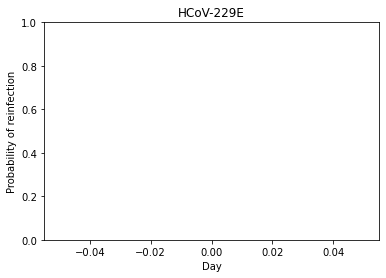

In [154]:
import matplotlib.pyplot as plt7
plt7.plot(x229eprobreinfection)
plt7.ylim(0, 1.0)
plt7.xlabel("Day")
plt7.ylabel("Probability of reinfection")
plt7.title('HCoV-229E') 

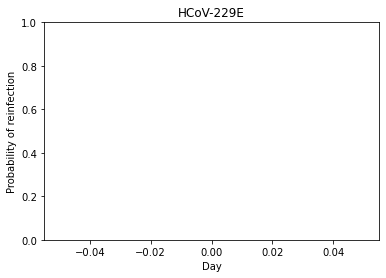

In [155]:
import matplotlib.pyplot as plt7

f = plt7.figure()

plt7.plot(x229eprobreinfection)
plt7.ylim(0, 1.0)
plt7.xlabel("Day")
plt7.ylabel("Probability of reinfection")
plt7.title('HCoV-229E') 
f.savefig("HCoV-229E_PrInf-by-Day" + str(datetime.now().strftime('%Y_%m_%d_%H_%M_%S')) + ".pdf", bbox_inches='tight')

In [156]:
mersdata = [[1, 50, "MERS", 2.67561878/2.67561878, True, "NA", "NA"],
                [2, 75, "MERS", 2.5938248/2.67561878,  False, (75 - 50), ((2.5938248 - 2.67561878)/2.67561878)/(75 - 50)],
                [3, 100, "MERS", 2.49390066/2.67561878, False, (100 - 75),  ((2.49390066 - 2.5938248)/2.67561878)/(100 - 75)],
                [4, 125, "MERS", 2.40265641/2.67561878, False, (125 - 100),  ((2.40265641 - 2.49390066)/2.67561878)/(125 - 100)],
                [5, 150, "MERS", 2.31624222/2.67561878, False, (150 - 125),  ((2.31624222 - 2.40265641)/2.67561878)/(150 - 125)],
                [6, 175, "MERS", 2.22800926/2.67561878, False, (175 - 150),  ((2.22800926 - 2.31624222)/2.67561878)/(175 - 150)],
                [7, 200, "MERS", 2.13682784/2.67561878, False, (200 - 175),  ((2.13682784 - 2.22800926)/2.67561878)/(200 - 175)],
                [8, 225, "MERS", 2.04875422/2.67561878, False, (225 - 200),  ((2.04875422 - 2.13682784)/2.67561878)/(225 - 200)],
                [9, 250, "MERS", 2.00596085/2.67561878, False, (250 - 225),  ((2.00596085 - 2.04875422)/2.67561878)/(250 - 225)],
                [10, 275, "MERS", 1.96931203/2.67561878, False, (275 - 250),  ((1.96931203 - 2.00596085)/2.67561878)/(275 - 250)],
                [11, 300, "MERS", 1.93628719/2.67561878, False, (300 - 275),  ((1.93628719 - 1.96931203)/2.67561878)/(300 - 275)],
                [12, 325, "MERS", 1.88343661/2.67561878, False, (325 - 300),  ((1.88343661 - 1.93628719)/2.67561878)/(325 - 300)]]

##### MERS Waning of Antibody OD

In [157]:
mersdatalength = len(mersdata)

In [158]:
print(mersdatalength)

12


In [159]:
aod3 = 0.725
merspaddedmeanwaning  = dict();

index = 0

while aod3 <= 1:    
    #print("first loop")
   # print("{0:.3f}".format(aod3))
    
    #sarscov1paddedmeanwaning.append("{0:.3f}".format(aod))
    
    index  = 2
    valueList = list()
    #print("index" + str(index))
    
    while index <= mersdatalength:    
        #print(str(index))
        print("aod3:" + str(aod3))

        if ( (mersdata[index-2][3] >= aod3 and aod3 >= mersdata[index-1][3]) or 
             (mersdata[index-2][3] <= aod3 and aod3 <= mersdata[index-1][3]) ) :
            print(mersdata[index-1][6])
            valueList.append(mersdata[index-1][6])

        #else:
         #   valueList.append("None")
        merspaddedmeanwaning["{0:.3f}".format(aod3)] = valueList
            
        index = index + 1
        
    
    #print("second loop")
    aod3 = aod3 + 0.025

print(len(merspaddedmeanwaning))

aod3:0.725
aod3:0.725
aod3:0.725
aod3:0.725
aod3:0.725
aod3:0.725
aod3:0.725
aod3:0.725
aod3:0.725
aod3:0.725
-0.0004937151771673533
aod3:0.725
aod3:0.75
aod3:0.75
aod3:0.75
aod3:0.75
aod3:0.75
aod3:0.75
aod3:0.75
aod3:0.75
-0.0006397528724177971
aod3:0.75
aod3:0.75
aod3:0.75
aod3:0.775
aod3:0.775
aod3:0.775
aod3:0.775
aod3:0.775
aod3:0.775
aod3:0.775
-0.0013166841353983896
aod3:0.775
aod3:0.775
aod3:0.775
aod3:0.775
aod3:0.8
aod3:0.8
aod3:0.8
aod3:0.8
aod3:0.8
aod3:0.8
-0.001363145163751614
aod3:0.8
aod3:0.8
aod3:0.8
aod3:0.8
aod3:0.8
aod3:0.8250000000000001
aod3:0.8250000000000001
aod3:0.8250000000000001
aod3:0.8250000000000001
aod3:0.8250000000000001
aod3:0.8250000000000001
-0.001363145163751614
aod3:0.8250000000000001
aod3:0.8250000000000001
aod3:0.8250000000000001
aod3:0.8250000000000001
aod3:0.8250000000000001
aod3:0.8500000000000001
aod3:0.8500000000000001
aod3:0.8500000000000001
aod3:0.8500000000000001
aod3:0.8500000000000001
-0.001319066238576783
aod3:0.8500000000000001
aod3:0

In [160]:
for key in merspaddedmeanwaning:
    print(str(key) + " " + str(merspaddedmeanwaning[key]))

0.725 [-0.0004937151771673533]
0.750 [-0.0006397528724177971]
0.775 [-0.0013166841353983896]
0.800 [-0.001363145163751614]
0.825 [-0.001363145163751614]
0.850 [-0.001319066238576783]
0.875 [-0.0012918759674724687]
0.900 [-0.0013640844604925356]
0.925 [-0.0013640844604925356]
0.950 [-0.0014938471914896659]
0.975 [-0.001222804692677483]


In [161]:
import numpy as np

aodList = list(merspaddedmeanwaning.keys())
aodList

arraod = np.array(aodList)
arraod = arraod.astype(float)

In [162]:
covdataList = list(merspaddedmeanwaning.values())
covdataList

arrcov = np.array(covdataList).squeeze()

In [163]:
from scipy.interpolate import interp1d
print(len(aodList))
print(len(covdataList))

y_interpolation = interp1d(arraod, arrcov)

11
11


In [164]:
interpolate_x_new = 0.725


print("Value of Y at x = {} is".format(interpolate_x_new),
      y_interpolation(interpolate_x_new))

Value of Y at x = 0.725 is -0.0004937151771673533


In [165]:
mersantibodytimecourse = list()

mersantibodytimecourse.append(1.0)

In [166]:
print(mersantibodytimecourse)

[1.0]


In [167]:
print(len(mersantibodytimecourse))

1


In [168]:
print(len(merspaddedmeanwaning))

11


In [169]:
day = 0
print(mersantibodytimecourse[day])
print(len(mersantibodytimecourse))

while (day < len(merspaddedmeanwaning) and mersantibodytimecourse[day] >= 0.725):  
    print(day)
    print(mersantibodytimecourse[day])    
    #sarscov1antibodytimecourse.append(2.0)
    print(mersantibodytimecourse[day])
    print("merspaddedmeanwaning")
    print(merspaddedmeanwaning)
    print("mersantibodytimecourse[day]")
    print(mersantibodytimecourse[day])
    #print("sarscov1paddedmeanwaning3[sarscov1antibodytimecourse[day]]")
    #sarscov1antibodytimecourse.append(2.0)
    #print(sarscov1paddedmeanwaning3[sarscov1antibodytimecourse[day]])
    print("inerpolate of merspaddedmeanwaning")
    #print(y_interpolation(mersantibodytimecourse[day]))
    print("Added value")
    #test = mersantibodytimecourse[day] + y_interpolation(mersantibodytimecourse[day])
    #print(str())
    #Not working
    #mersantibodytimecourse.append(mersantibodytimecourse[day] + y_interpolation(mersantibodytimecourse[day]))
    mersantibodytimecourse.append(mersantibodytimecourse[day] + 0)
    print("mersantibodytimecourse")
    print(mersantibodytimecourse)

    print("day")
    day = day + 1    

1.0
1
0
1.0
1.0
merspaddedmeanwaning
{'0.725': [-0.0004937151771673533], '0.750': [-0.0006397528724177971], '0.775': [-0.0013166841353983896], '0.800': [-0.001363145163751614], '0.825': [-0.001363145163751614], '0.850': [-0.001319066238576783], '0.875': [-0.0012918759674724687], '0.900': [-0.0013640844604925356], '0.925': [-0.0013640844604925356], '0.950': [-0.0014938471914896659], '0.975': [-0.001222804692677483]}
mersantibodytimecourse[day]
1.0
inerpolate of merspaddedmeanwaning
Added value
mersantibodytimecourse
[1.0, 1.0]
day
1
1.0
1.0
merspaddedmeanwaning
{'0.725': [-0.0004937151771673533], '0.750': [-0.0006397528724177971], '0.775': [-0.0013166841353983896], '0.800': [-0.001363145163751614], '0.825': [-0.001363145163751614], '0.850': [-0.001319066238576783], '0.875': [-0.0012918759674724687], '0.900': [-0.0013640844604925356], '0.925': [-0.0013640844604925356], '0.950': [-0.0014938471914896659], '0.975': [-0.001222804692677483]}
mersantibodytimecourse[day]
1.0
inerpolate of mersp

In [170]:
print(mersantibodytimecourse)

[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


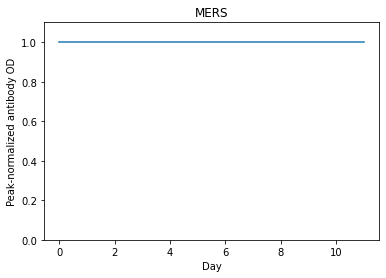

In [171]:
from matplotlib import pyplot as plt
plt.plot(mersantibodytimecourse)
plt.ylim(0,1.1)
plt.xlabel("Day")
plt.ylabel("Peak-normalized antibody OD")
plt.title('MERS')
plt.show()

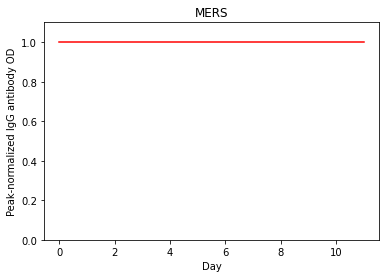

In [172]:
f2 = plt.figure()
plt.plot(mersantibodytimecourse, color='red')
plt.ylim(0,1.1)
plt.xlabel("Day")
plt.ylabel("Peak-normalized IgG antibody OD")
plt.title('MERS')
plt.show()

f2.savefig("MERS_choe_Antibody-Time-Course" + str(datetime.now().strftime('%Y_%m_%d_%H_%M_%S')) + ".pdf", bbox_inches='tight')

###### Export to Excel

In [173]:
df3 = pd.DataFrame(mersantibodytimecourse, columns=["Antibody Time Course"])
df3.to_csv('MERS_choe-Antibody-Time-Course.csv', index=False)

In [174]:
mersbaseline = 0.12992406

In [175]:
print(mersbaseline)

0.12992406


##### This baseline peak-normalized S IgG antibody level for MERS comes from the ancestral and descendent states 
##### analysis that used the baselines for the human "seasonal" coronaviruses to estimate the baselines for the 
##### zoonotic coronaviruses.

In [176]:
import math

def calculatelambda(sarscov1baseline, lambdaValue, index):
    exponentValue = -lambdaValue * index
    result = sarscov1baseline + (1 - sarscov1baseline) * math.exp(exponentValue)
    return result

In [177]:
merslsfuncwfixedbaseline = 0
currentMinValue = float('inf')
currentMinValue

for index in range(0, (len(mersantibodytimecourse))):
    print(mersantibodytimecourse[index] )
    ##Need to find the step value and maximum value for this lambdaValue
    lambdaValue = 0.002
    
    ##Added 11/28
    merslsfuncwfixedbaseline = (mersantibodytimecourse[index]) - math.pow((calculatelambda(mersbaseline, lambdaValue, index)), 2)     
    print(merslsfuncwfixedbaseline)
    
    if merslsfuncwfixedbaseline < currentMinValue:
        currentMinValue = merslsfuncwfixedbaseline      

1.0
0.0
1.0
0.00347380369591499
1.0
0.0069346406709717145
1.0
0.010382560888777648
1.0
0.013817614117080268
1.0
0.01723984992854244
1.0
0.02064931770151368
1.0
0.02404606662079878
1.0
0.027430145678423723
1.0
0.03080160367439766
1.0
0.03416048921747272
1.0
0.03750685072589932


In [178]:
print(currentMinValue)

0.0


In [179]:
#####This value of lambda goes into the ancestral and descendent states analysis estimating a and b for the zoonotic coronaviruses.
mershalflife = np.log(2) / 0.001658632767524445 

In [180]:
print(mershalflife)

417.90274142147


##### Added as part of python code

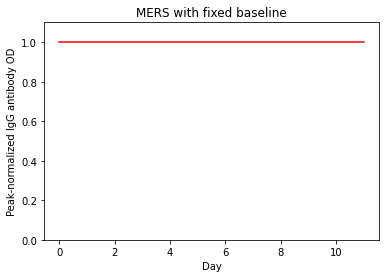

In [181]:
plt.plot(mersantibodytimecourse, color='red')
plt.ylim(0,1.1)
plt.xlabel("Day")
plt.ylabel("Peak-normalized IgG antibody OD")
plt.title('MERS with fixed baseline')
plt.show()

##### Added as part of python code

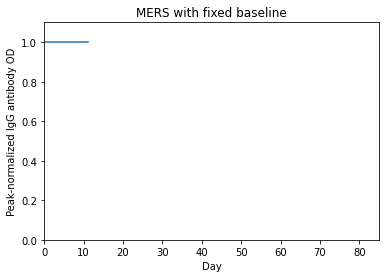

In [182]:
f2 = plt.figure()
plt.plot(mersantibodytimecourse)
plt.ylim(0,1.1)
#####Added x limit
plt.xlim(0,85)
plt.xlabel("Day")
plt.ylabel("Peak-normalized IgG antibody OD")
plt.title('MERS with fixed baseline')
plt.show()

f2.savefig("MERS_withFixedBaseline" + str(datetime.now().strftime('%Y_%m_%d_%H_%M_%S')) + ".pdf", bbox_inches='tight')

In [183]:
print(len(mersantibodytimecourse))

12


In [184]:
lambdaForPlot = 0.001658632767524445
result = 0
plotBaseLines = list()

for days in range(0, len(mersantibodytimecourse)):
    exponentValue = -lambdaForPlot * days
    result = mersbaseline + (1 - mersbaseline) * math.exp(exponentValue)
    plotBaseLines.append(result)

In [185]:
print(plotBaseLines)

[1.0, 0.9985580596909763, 0.9971185090490602, 0.9956813441139565, 0.9942465609319336, 0.9928141555558123, 0.9913841240449546, 0.9899564624652533, 0.988531166889121, 0.9871082333954796, 0.9856876580697488, 0.984269437003836]


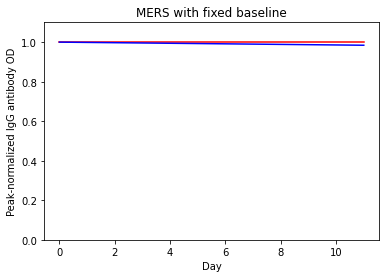

In [186]:
from matplotlib import pyplot as plt

plt.plot(mersantibodytimecourse, color='red')
plt.ylim(0,1.1)
plt.xlabel("Day")

plt.plot(plotBaseLines, color = 'blue')

plt.ylabel("Peak-normalized IgG antibody OD")
plt.title('MERS with fixed baseline')
#plt.show()



plt.title('MERS with fixed baseline')
plt.show()



In [187]:
print(len(mersantibodytimecourse))

12


In [188]:
mersantibodytimecourseplusexp = mersantibodytimecourse
day = len(mersantibodytimecourse)

print(day)

12


In [189]:
print(len(mersantibodytimecourseplusexp))

12


In [190]:
#while day < 4393:
#Small file 86 records
#while day < 89:
maxDays = 2
while day < maxDays:
    day = day + 1
    print("day : " + str(day))
    exponentValueBaseLine = -0.001658632767524445
    tempValue = mersbaseline + (mersantibodytimecourseplusexp[day-1] - mersbaseline) * math.exp(exponentValueBaseLine)
    print('tempValue' + str(tempValue))
    mersantibodytimecourseplusexp.append(tempValue)

In [191]:
print(mersantibodytimecourseplusexp)

[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


Text(0.5, 1.0, 'MERS')

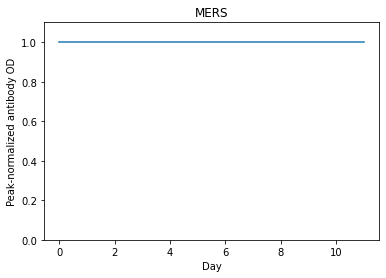

In [192]:
import matplotlib.pyplot as plt2
plt2.plot(mersantibodytimecourseplusexp)
plt2.ylim(0,1.1)
plt2.xlabel("Day")
plt2.ylabel("Peak-normalized antibody OD")
plt2.title('MERS')

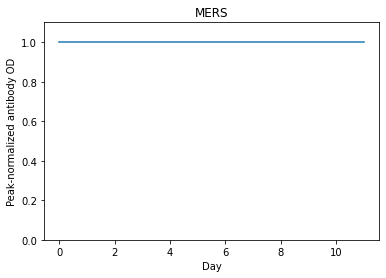

In [193]:
import matplotlib.pyplot as plt3

f = plt3.figure()
plt3.plot(mersantibodytimecourseplusexp)

plt3.ylim(0,1.1)
plt3.xlabel("Day")
plt3.ylabel("Peak-normalized antibody OD")
plt3.title('MERS')
plt3.show()

f.savefig("MERS_choe_nOD-by-Day_" + str(datetime.now().strftime('%Y_%m_%d_%H_%M_%S')) + ".pdf", bbox_inches='tight')

##### MERS Probability of Infection | Antibody OD

In [194]:
import math

a = 1
b = 1

def mersprobinfgivenaod(aod, a, b):
    exponentValue = -(a + b * aod)   
    result = 1 / (1 + math.exp(exponentValue))
    return result

##### These values for a and b come from the ancestral and descendent states analysis to determine them for the 
##### zoonotic coronaviruses given baselines and declines for all viruses, 
##### and a's and b's for the "seasonal" coronaviruses.

In [195]:
mersprobinfgivenaodList = list()

currentValue = 0;

while( currentValue <= 1):
    currentValue = currentValue + 0.00625
    mersprobinfgivenaodList.append(mersprobinfgivenaod(currentValue, a, b))

print(mersprobinfgivenaodList)

[0.7322856272178266, 0.7335091181602805, 0.7347290431150206, 0.7359453939271484, 0.7371581626286834, 0.7383673414380187, 0.739572922759361, 0.740774899182154, 0.7419732634804855, 0.7431680086124811, 0.7443591277196812, 0.7455466141264027, 0.746730461339088, 0.7479106630456372, 0.7490872131147275, 0.7502601055951177, 0.751429334714939, 0.7525948948809733, 0.7537567806779164, 0.7549149868676283, 0.7560695083883725, 0.75722034035404, 0.758367478053362, 0.759510916949111, 0.7606506526772884, 0.7617866810463009, 0.7629189980361263, 0.7640475997974661, 0.7651724826508886, 0.7662936430859597, 0.7674110777603648, 0.7685247834990178, 0.7696347572931619, 0.77074099629946, 0.7718434978390747, 0.7729422593967386, 0.7740372786198163, 0.7751285533173565, 0.7762160814591353, 0.7772998611746911, 0.7783798907523506, 0.7794561686382467, 0.780528693435329, 0.7815974639023655, 0.7826624789529376, 0.7837237376544267, 0.784781239226995, 0.7858349830425586, 0.7868849686237532, 0.7879311956428947, 0.788973663

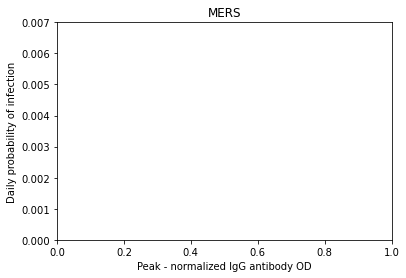

In [196]:
plt.plot(mersprobinfgivenaodList)
plt.ylim(0, 0.007)
plt.xlim(0.0, 1.0)
plt.xlabel("Peak - normalized IgG antibody OD")
plt.ylabel("Daily probability of infection")
plt.title('MERS')
plt.show()

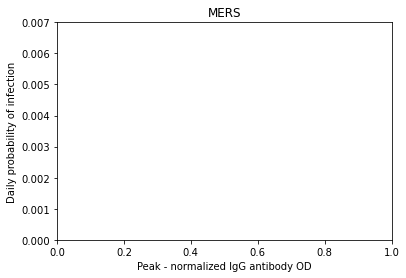

In [197]:
import matplotlib.pyplot as plt4

f2 = plt4.figure()
plt4.plot(mersprobinfgivenaodList)

plt4.ylim(0, 0.007)
plt4.xlim(0.0, 1.0)
plt4.xlabel("Peak - normalized IgG antibody OD")
plt4.ylabel("Daily probability of infection")
plt4.title('MERS')
plt4.show()

f2.savefig("MERS_choe_PrInf-by-nOD_" + str(datetime.now().strftime('%Y_%m_%d_%H_%M_%S')) + ".pdf", bbox_inches='tight')

In [198]:
import math

def mersprobinfgivenall(a, b, aod):
    exponentValue = (-a) + (-b) * aod
    result = 1 / (1 + math.exp(exponentValue))
    return result

In [199]:
def populatemersprobinfList(a, b):
    mersprobinfList = list()
    
    x = 0;

    while( x <= 1):
        x = x + 0.05
        mersprobinfList.append(mersprobinfgivenall(a, b, x))
    
    return mersprobinfList  

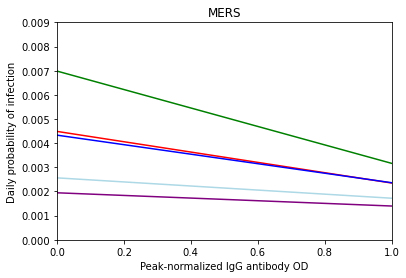

In [200]:
from matplotlib import pyplot as plt

mersprobinfList1 = populatemersprobinfList(-4.752999, -12.98306)

plt.plot(mersprobinfList1, color='red')
plt.ylim(0,0.009)
plt.xlim(0.0, 1.0)
plt.xlabel("Peak-normalized IgG antibody OD")

mersprobinfList2 = populatemersprobinfList(-4.1612, -15.91843)
mersprobinfList3 = populatemersprobinfList(-5.563915, -7.994218)
mersprobinfList4 = populatemersprobinfList(-5.908631, -6.627999)
mersprobinfList5 = populatemersprobinfList(-4.829109, -12.16748)

plt.plot(mersprobinfList2, color = 'green')
plt.plot(mersprobinfList3, color = 'lightblue')
plt.plot(mersprobinfList4, color = 'purple')
plt.plot(mersprobinfList5, color = 'blue')

plt.ylabel("Daily probability of infection")
plt.title('MERS')
plt.show()

##### The alternate values for a and b above come from our results using different approaches toward 
##### building the molecular evolutionary tree of the coronaviruses and toward building the time tree of the 
##### coronaviruses (see Supplement).

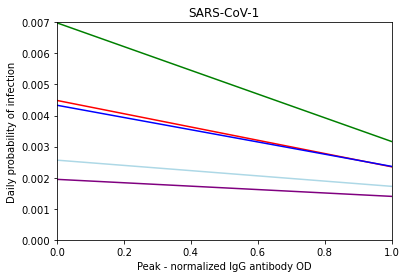

In [201]:
import matplotlib.pyplot as plt5

f5 = plt5.figure()
plt5.plot(mersprobinfList1, color='red')
plt5.plot(mersprobinfList2, color = 'green')
plt5.plot(mersprobinfList3, color = 'lightblue')
plt5.plot(mersprobinfList4, color = 'purple')
plt5.plot(mersprobinfList5, color = 'blue')

plt5.ylim(0,0.007)
plt5.xlim(0.0, 1.0)

plt5.xlabel("Peak - normalized IgG antibody OD")
plt5.ylabel("Daily probability of infection")
plt5.title('SARS-CoV-1')
plt5.show()

f5.savefig("SARS-CoV-1_PrInfs-by-nOD.pdf", bbox_inches='tight')

##### MERS Probability of No Reinfection Time Course

In [202]:
mersprobnoreinfectiontimecourse = list()
day = 0
mersprobnoreinfectiontimecourse.append(1.0)

mersprobnoreinfectiontimecourse.append(mersprobnoreinfectiontimecourse[day] * (1- mersprobinfgivenaod(mersantibodytimecourseplusexp[day+1], a, b)))

In [203]:
print(mersprobnoreinfectiontimecourse)

[1.0, 0.11920292202211769]


In [204]:
print(len(mersantibodytimecourse))

12


In [205]:
#### Need to change days to 4393
while day < 2:
    
    if(day < len(mersantibodytimecourse)):
        #mersprobnoreinfectiontimecourse.append(mersprobnoreinfectiontimecourse[day] * (1 - mersprobinfgivenaod(mersantibodytimecourseplusexp[day + 1])))
        mersprobnoreinfectiontimecourse.append(mersprobnoreinfectiontimecourse[day] * (1 - mersprobinfgivenaod(mersantibodytimecourseplusexp[1], a, b)))
    else:
        mersprobnoreinfectiontimecourse.append(mersprobnoreinfectiontimecourse[day] * (1 - mersprobinfgivenaod(mersantibodytimecourseplusexp[1], a, b)))
            
    day = day + 1   

In [206]:
print(mersprobnoreinfectiontimecourse)

[1.0, 0.11920292202211769, 0.11920292202211769, 0.01420933661861107]


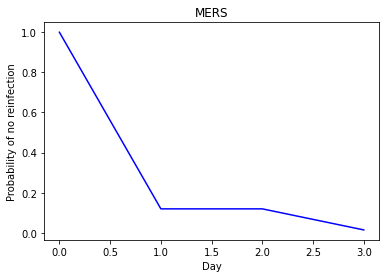

In [207]:
plt.plot(mersprobnoreinfectiontimecourse, color='blue')
#Limit not working
#plt.ylim(0,1.1)
plt.xlabel("Day")
plt.ylabel("Probability of no reinfection")
plt.title('MERS')
plt.show()

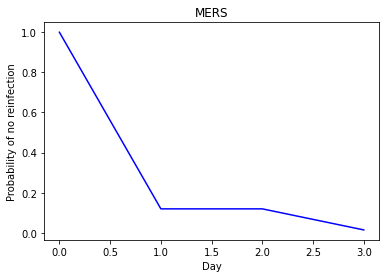

In [208]:
import matplotlib.pyplot as plt6

f6 = plt6.figure()
plt6.plot(mersprobnoreinfectiontimecourse, color = 'blue')

#plt6.ylim(0,0.007)
#plt6.xlim(0.0, 1.0)

plt6.xlabel("Day")
plt6.ylabel("Probability of no reinfection")
plt6.title('MERS')
plt6.show()

f6.savefig("MERS_PnorInfTimecourse-by-Day_" + str(datetime.now().strftime('%Y_%m_%d_%H_%M_%S')) + ".pdf", bbox_inches='tight')

In [209]:
mersprobreinfection = list()

day = 0

#while day < 4393:
while day < 2:
    day = day + 1  
        
    #if day < 1392:
    if day < 2:
        tempValue = mersprobinfgivenaod(mersantibodytimecourseplusexp[day], a, b) * mersprobnoreinfectiontimecourse[day]
    else:           
        tempValue = mersprobinfgivenaod(mersantibodytimecourseplusexp[1], a, b)* mersprobnoreinfectiontimecourse[day]
    
    mersprobreinfection.append(tempValue)      

Text(0.5, 1.0, 'MERS')

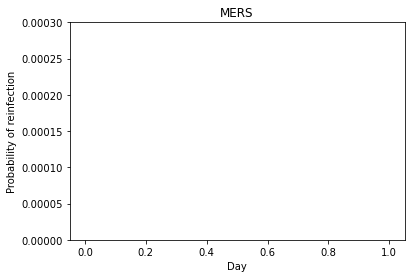

In [210]:
import matplotlib.pyplot as plt7
plt7.plot(mersprobreinfection)
plt7.ylim(0, 0.0003)
plt7.xlabel("Day")
plt7.ylabel("Probability of reinfection")
plt7.title('MERS') 

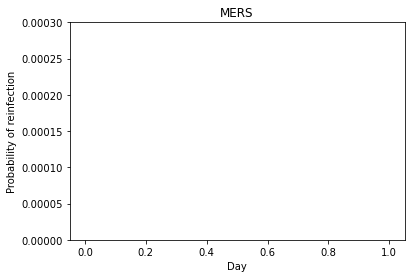

In [211]:
import matplotlib.pyplot as plt7

f = plt7.figure()

plt7.plot(mersprobreinfection)
plt7.ylim(0, 0.0003)
plt7.xlabel("Day")
plt7.ylabel("Probability of reinfection")
plt7.title('MERS') 
f.savefig("MERS_choe_PrInf-by-Day_" + str(datetime.now().strftime('%Y_%m_%d_%H_%M_%S')) + ".pdf", bbox_inches='tight')

##### SARS-CoV-2

##### Input Data: Average peak-normalized ELIZA ODs for SARS-CoV-2 S IgG antibodies from Gudbjartsson et al. 2020, 
##### "Humoral Immune Response to SARS-CoV-2 in Iceland", New England Journal of Medicine.

###### days : 34, 48, 70, 94, 109
###### OD : 1.6, 1.55, 1.43, 1.19, 1.22

In [212]:
sarscov2data = [[1, 34, "SARSCoV2", 1.6/1.6, True, "NA", "NA"],
                [2, 48, "SARSCoV2", 1.55/1.6, False, (48 - 34), ((1.55 - 1.6)/1.6) /(48 - 34)],
                [3, 70, "SARSCoV2", 1.43/1.6, False, (70 - 48), ((1.43 - 1.55)/1.6) /(70 - 48)], 
                [4, 94, "SARSCoV2", 1.19/1.6, False, (94 - 70), ((1.19 - 1.43)/1.6)/(94 - 70)]]         

In [213]:
## SARS-CoV-2 Waning of Antibody OD

sarscov2datalength = len(sarscov2data)

In [214]:
for i in range(0,len(sarscov2data)):
    for j in range(0,len(sarscov2data[i])):
        print(sarscov2data[i][j])

1
34
SARSCoV2
1.0
True
NA
NA
2
48
SARSCoV2
0.96875
False
14
-0.002232142857142859
3
70
SARSCoV2
0.8937499999999999
False
22
-0.003409090909090912
4
94
SARSCoV2
0.7437499999999999
False
24
-0.0062499999999999995


In [215]:
aod = 0.75
sarscov2paddedmeanwaning = dict();
sarscov2datalength = 4
index = 0

while aod <= 1:        
    index  = 2
    valueList = list()    
    
    while index <= sarscov2datalength:    
        print("aod :" + str(aod))
        if ( (sarscov2data[index-2][3] >= aod and aod >= sarscov2data[index-1][3]) or 
             (sarscov2data[index-2][3] <= aod and aod <= sarscov2data[index-1][3]) ) :
            valueList.append(sarscov2data[index-1][6])
        #else:
         #   valueList.append("None")
        if (len(valueList) != 0 ):
            sarscov2paddedmeanwaning["{0:.3f}".format(aod)] = valueList            
        index = index + 1    
    aod = aod + 0.05

print(len(sarscov2paddedmeanwaning))

aod :0.75
aod :0.75
aod :0.75
aod :0.8
aod :0.8
aod :0.8
aod :0.8500000000000001
aod :0.8500000000000001
aod :0.8500000000000001
aod :0.9000000000000001
aod :0.9000000000000001
aod :0.9000000000000001
aod :0.9500000000000002
aod :0.9500000000000002
aod :0.9500000000000002
5


In [216]:
for key in sarscov2paddedmeanwaning:
    print(str(key) + " " + str(sarscov2paddedmeanwaning[key]))

0.750 [-0.0062499999999999995]
0.800 [-0.0062499999999999995]
0.850 [-0.0062499999999999995]
0.900 [-0.003409090909090912]
0.950 [-0.003409090909090912]


In [217]:
import numpy as np

aod2List = list(sarscov2paddedmeanwaning.keys())
aod2List

arraod2 = np.array(aod2List)
arraod2 = arraod2.astype(float)

In [218]:
covdata2List = list(sarscov2paddedmeanwaning.values())
covdata2List

arrcov2 = np.array(covdata2List).squeeze()

In [219]:
from scipy.interpolate import interp1d
print(len(aod2List))
print(len(covdata2List))

y_interpolation = interp1d(arraod2, arrcov2)

5
5


In [220]:
sarscov2antibodytimecourse = list()

sarscov2antibodytimecourse.append(1.0)

In [221]:
day = 0

while ( day < len(sarscov2paddedmeanwaning) and sarscov2antibodytimecourse[day] >= 0.75):
    print(day)
    print(sarscov2antibodytimecourse[day])
    print(sarscov2antibodytimecourse[day])
    print("sarscov2paddedmeanwaning")
    print(sarscov2paddedmeanwaning)
    print("sarscov2antibodytimecourse[day]")
    print(sarscov2antibodytimecourse[day])
    print("inerpolate of sarscov2paddedmeanwaning")
    #print(y_interpolation(sarscov2antibodytimecourse[day]))
    print("Added value")
    #test = sarscov2antibodytimecourse[day] + y_interpolation(sarscov2antibodytimecourse[day])
    #Not working
    #sarscov2antibodytimecourse.append(sarscov2antibodytimecourse[day] + y_interpolation(sarscov2antibodytimecourse[day]))
    sarscov2antibodytimecourse.append(sarscov2antibodytimecourse[day] + 0)
    print("sarscov2antibodytimecourse")
    print(sarscov2antibodytimecourse)
    day = day + 1

0
1.0
1.0
sarscov2paddedmeanwaning
{'0.750': [-0.0062499999999999995], '0.800': [-0.0062499999999999995], '0.850': [-0.0062499999999999995], '0.900': [-0.003409090909090912], '0.950': [-0.003409090909090912]}
sarscov2antibodytimecourse[day]
1.0
inerpolate of sarscov2paddedmeanwaning
Added value
sarscov2antibodytimecourse
[1.0, 1.0]
1
1.0
1.0
sarscov2paddedmeanwaning
{'0.750': [-0.0062499999999999995], '0.800': [-0.0062499999999999995], '0.850': [-0.0062499999999999995], '0.900': [-0.003409090909090912], '0.950': [-0.003409090909090912]}
sarscov2antibodytimecourse[day]
1.0
inerpolate of sarscov2paddedmeanwaning
Added value
sarscov2antibodytimecourse
[1.0, 1.0, 1.0]
2
1.0
1.0
sarscov2paddedmeanwaning
{'0.750': [-0.0062499999999999995], '0.800': [-0.0062499999999999995], '0.850': [-0.0062499999999999995], '0.900': [-0.003409090909090912], '0.950': [-0.003409090909090912]}
sarscov2antibodytimecourse[day]
1.0
inerpolate of sarscov2paddedmeanwaning
Added value
sarscov2antibodytimecourse
[1.0

In [222]:
print(sarscov2antibodytimecourse)

[1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


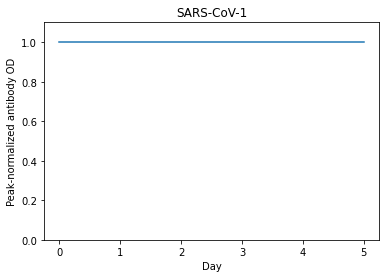

In [223]:
from matplotlib import pyplot as plt8
plt8.plot(sarscov2antibodytimecourse)
plt8.ylim(0,1.1)
plt8.xlabel("Day")
plt8.ylabel("Peak-normalized antibody OD")
plt8.title('SARS-CoV-1')
plt8.show()

In [224]:
df4 = pd.DataFrame(sarscov2antibodytimecourse, columns=["Antibody Time Course"])
df4.to_csv('SARS-CoV-2-Antibody-Time-Course' + str(datetime.now().strftime('%Y_%m_%d_%H_%M_%S')) + ".csv", index=False)

In [225]:
sarscov2baseline = 0.1298892

###This baseline peak-normalized N IgG antibody level for SARS-CoV-2 comes from the ancestral and descendent states analysis that used the baselines for the human "seasonal" coronaviruses to estimate the baselines for the zoonotic coronaviruses.

In [226]:
sarscov2lsfuncwfixedbaseline = 0
currentMinValue = float('inf')
currentMinValue

for index in range(0, (len(sarscov2antibodytimecourse))):
    print(sarscov2antibodytimecourse[index] )
    ##Need to find the step value and maximum value for this lambdaValue
    lambdaValue = 0.002
    ##Added 11/28
    sarscov2lsfuncwfixedbaseline = (sarscov2antibodytimecourse[index]) - math.pow((calculatelambda(sarscov2baseline, lambdaValue, index)), 2) 
    print(sarscov2lsfuncwfixedbaseline)
    
    if sarscov2lsfuncwfixedbaseline < currentMinValue:
        currentMinValue = sarscov2lsfuncwfixedbaseline      

1.0
0.0
1.0
0.0034739427544010493
1.0
0.0069349180272216815
1.0
0.010382975785516613
1.0
0.013818165800466686
1.0
0.01724053764815292


In [227]:
print(currentMinValue)

0.0


In [228]:
sarscov2halflife = np.log(2) / 0.0042668219735056195

In [229]:
print(sarscov2halflife)

162.45045724053395


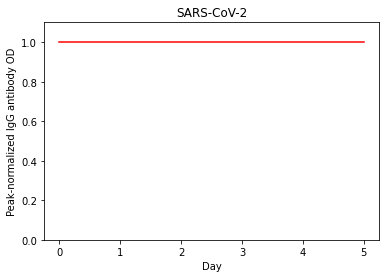

In [230]:
from matplotlib import pyplot as plt9
plt9.plot(sarscov2antibodytimecourse, color='red')
plt9.ylim(0,1.1)
plt9.xlabel("Day")
plt9.ylabel("Peak-normalized IgG antibody OD")
plt9.title('SARS-CoV-2')
plt9.show()

In [231]:
print(len(sarscov2antibodytimecourse))

6


In [232]:
sarscov2antibodytimecourseplusexp = sarscov2antibodytimecourse
day = len(sarscov2antibodytimecourse)

print(day)

6


In [236]:
#while day < 4393:
#Small file 86 records
#while day < 88:
maxDays = 7
while day < maxDays:
    day = day + 1
    print("day")
    print(day)
    exponentValueBaseLine = -0.0042668219735056195
    #Not working
    #tempValue = sarscov2baseline + (sarscov2antibodytimecourseplusexp[day-1] - sarscov2baseline) * math.exp(exponentValueBaseLine)
    tempValue = sarscov2baseline + (sarscov2antibodytimecourseplusexp[day] - sarscov2baseline) * math.exp(exponentValueBaseLine)    
    print('tempValue')
    print(tempValue)
    sarscov2antibodytimecourseplusexp.append(tempValue)

In [237]:
len(sarscov2antibodytimecourseplusexp)

6

Text(0.5, 1.0, 'SARS-CoV-2')

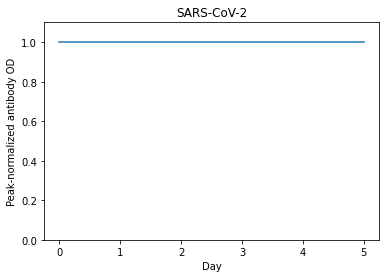

In [238]:
import matplotlib.pyplot as plt2
plt2.plot(sarscov2antibodytimecourseplusexp)
#f = plt2.figure()
plt2.ylim(0,1.1)
plt2.xlabel("Day")
plt2.ylabel("Peak-normalized antibody OD")
plt2.title('SARS-CoV-2')

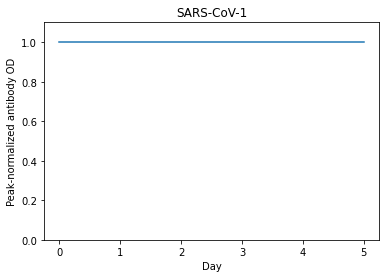

In [239]:
import matplotlib.pyplot as plt10

f = plt10.figure()
plt10.plot(sarscov2antibodytimecourseplusexp)

plt10.ylim(0,1.1)
plt10.xlabel("Day")
plt10.ylabel("Peak-normalized antibody OD")
plt10.title('SARS-CoV-1')
plt10.show()

f.savefig("SARS-CoV-2_nOD-by-Day" + str(datetime.now().strftime('%Y_%m_%d_%H_%M_%S')) + ".pdf", bbox_inches='tight')

##### SARS-CoV-2 Probability of Infection | Antibody OD

In [240]:
import math

def sarscov2probinfgivenaod(aod):
    exponentValue = 5.148993 + (10.89892 * aod)
    result = 1 / (1 + math.exp(exponentValue))
    return result

In [241]:
sarscov2probinfgivenaodList = list()

currentValue = 0;

while( currentValue <= 1):
    currentValue = currentValue + 0.00625
    sarscov2probinfgivenaodList.append(sarscov2probinfgivenaod(currentValue))

In [242]:
print(sarscov2probinfgivenaodList)

[0.005393722127159759, 0.005040335754848063, 0.0047099929399261045, 0.004401204969767508, 0.004112577543737874, 0.003842805010524689, 0.003590664928289927, 0.0033550129333799186, 0.003134777903416195, 0.002928957400775491, 0.0027366133827287278, 0.0025568681648322016, 0.002388900624536448, 0.0022319426323874595, 0.002085275698631918, 0.0019482278234941276, 0.0018201705398607855, 0.001700516137584555, 0.0015887150590936621, 0.0014842534564685826, 0.0013866509006148014, 0.00129545823361995, 0.0012102555558323323, 0.0011306503396341222, 0.0010562756623050664, 0.000986788550780538, 0.0009218684315004467, 0.0008612156789224482, 0.0008045502566339693, 0.0007516104453425447, 0.0007021516523531482, 0.0006559452974545931, 0.0006127777704351208, 0.0005724494557302403, 0.0005347738199742265, 0.0004995765584808443, 0.00046669479691936007, 0.0004359763446792219, 0.00040727899663149967, 0.00038046988019779045, 0.00035542484482833936, 0.0003320278911711823, 0.00031017063738366437, 0.00028975182019726

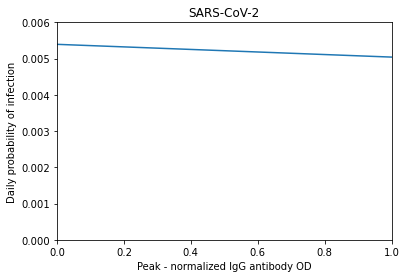

In [243]:
import matplotlib.pyplot as plt11

plt11.plot(sarscov2probinfgivenaodList)
plt11.ylim(0,0.006)
plt11.xlim(0.0, 1.0)
plt11.xlabel("Peak - normalized IgG antibody OD")
plt11.ylabel("Daily probability of infection")
plt11.title('SARS-CoV-2')
plt11.show()

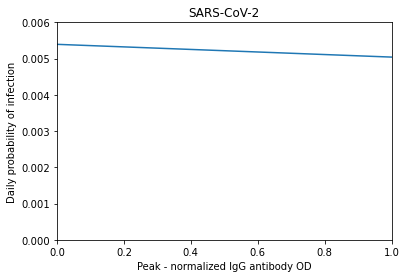

In [244]:
import matplotlib.pyplot as plt12

f12 = plt12.figure()
plt12.plot(sarscov2probinfgivenaodList)

plt12.ylim(0,0.006)
plt12.xlim(0.0, 1.0)
plt12.xlabel("Peak - normalized IgG antibody OD")
plt12.ylabel("Daily probability of infection")
plt12.title('SARS-CoV-2')
plt12.show()

f12.savefig("SARS-CoV-2_PrInf-by-nOD" + str(datetime.now().strftime('%Y_%m_%d_%H_%M_%S')) + ".pdf", bbox_inches='tight')

In [245]:
import math

def sarscov1probinfgivenall(a, b, aod):
    exponentValue = (-a) + (-b) * aod
    result = 1 / (1 + math.exp(exponentValue))
    return result

In [246]:
def populatesarscov1probinfList(a, b):
    sarscov1probinfList = list()
    
    x = 0;

    while( x <= 1):
        x = x + 0.05
        sarscov1probinfList.append(sarscov1probinfgivenall(a, b, x))
    
    return sarscov1probinfList  

Text(0.5, 1.0, 'SARS-CoV-2')

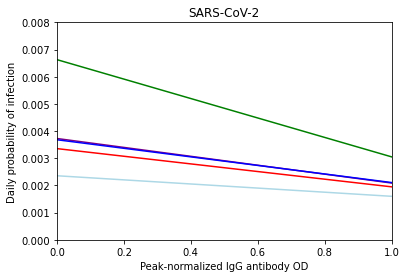

In [247]:
from matplotlib import pyplot as plt13

sarscov2probinfList1 = populatesarscov1probinfList(-5.148993, -10.89892)

plt13.plot(sarscov2probinfList1, color='red')
plt13.ylim(0,0.008)
plt13.xlim(0.0, 1.0)
plt13.xlabel("Peak-normalized IgG antibody OD")

sarscov2probinfList2 = populatesarscov1probinfList(-4.229918, -15.59699)
sarscov2probinfList3 = populatesarscov1probinfList(-5.659934, -7.765139)
sarscov2probinfList4 = populatesarscov1probinfList(-5.007058, -11.626536)
sarscov2probinfList5 = populatesarscov1probinfList(-5.040719, -11.20207)

plt13.plot(sarscov2probinfList2, color = 'green')
plt13.plot(sarscov2probinfList3, color = 'lightblue')
plt13.plot(sarscov2probinfList4, color = 'purple')
plt13.plot(sarscov2probinfList5, color = 'blue')

plt13.ylabel("Daily probability of infection")
plt13.title('SARS-CoV-2')
#plt.show()

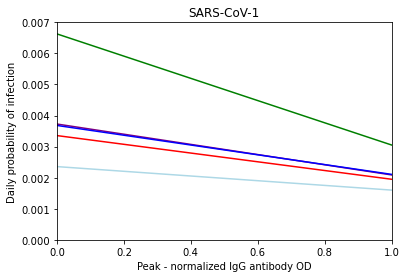

In [248]:
import matplotlib.pyplot as plt14

f14 = plt14.figure()
plt14.plot(sarscov2probinfList1, color='red')
plt14.plot(sarscov2probinfList2, color = 'green')
plt14.plot(sarscov2probinfList3, color = 'lightblue')
plt14.plot(sarscov2probinfList4, color = 'purple')
plt14.plot(sarscov2probinfList5, color = 'blue')

plt14.ylim(0,0.007)
plt14.xlim(0.0, 1.0)

plt14.xlabel("Peak - normalized IgG antibody OD")
plt14.ylabel("Daily probability of infection")
plt14.title('SARS-CoV-1')
plt14.show()

f14.savefig("SARS-CoV-2_PrInfs-by-nOD" + str(datetime.now().strftime('%Y_%m_%d_%H_%M_%S')) + ".pdf", bbox_inches='tight')

##### SARS-CoV-2 Probability of No Reinfection Time Course

In [249]:
sarscov2probnoreinfectiontimecourse = list()

day = 0
sarscov2probnoreinfectiontimecourse.append(1.0)

sarscov2probnoreinfectiontimecourse.append(sarscov2probnoreinfectiontimecourse[day] * (1-sarscov2probinfgivenaod(sarscov2antibodytimecourseplusexp[day+1])))

In [250]:
print(sarscov2probnoreinfectiontimecourse)

[1.0, 0.9999998927296021]


In [251]:
print(len(sarscov2antibodytimecourse))

6


In [252]:
#### Need to change days to 4393
while day < 5:
    
    if(day < len(sarscov2antibodytimecourse)):
        sarscov2probnoreinfectiontimecourse.append(sarscov2probnoreinfectiontimecourse[day] * (1 - sarscov2probinfgivenaod(sarscov2antibodytimecourseplusexp[day + 1])))
    else:
        #sarscov2probnoreinfectiontimecourse.append(sarscov2probnoreinfectiontimecourse[day] * (1 - sarscov2probinfgivenaod(sarscov2antibodytimecourseplusexp[1392])))
        sarscov2probnoreinfectiontimecourse.append(sarscov2probnoreinfectiontimecourse[day] * (1 - sarscov2probinfgivenaod(sarscov2antibodytimecourseplusexp[7])))
            
    day = day + 1   

In [253]:
print(sarscov2probnoreinfectiontimecourse)

[1.0, 0.9999998927296021, 0.9999998927296021, 0.9999997854592158, 0.9999997854592158, 0.9999996781888408, 0.9999996781888408]


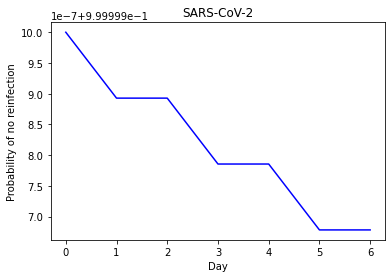

In [254]:
plt.plot(sarscov2probnoreinfectiontimecourse, color='blue')
#Limit not working
#plt.ylim(0,1.1)
plt.xlabel("Day")
plt.ylabel("Probability of no reinfection")
plt.title('SARS-CoV-2')
plt.show()

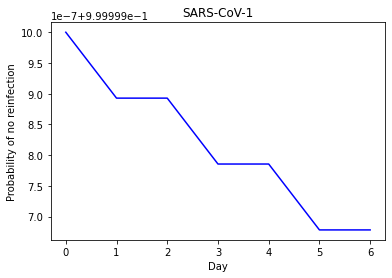

In [255]:
import matplotlib.pyplot as plt15

f15 = plt15.figure()
plt15.plot(sarscov2probnoreinfectiontimecourse, color = 'blue')

#plt6.ylim(0,0.007)
#plt6.xlim(0.0, 1.0)

plt15.xlabel("Day")
plt15.ylabel("Probability of no reinfection")
plt15.title('SARS-CoV-1')
plt15.show()

f15.savefig("SARS-CoV-2_PnorInfTimecourse-by-" + str(datetime.now().strftime('%Y_%m_%d_%H_%M_%S')) + ".pdf", bbox_inches='tight')

In [256]:
sarscov2probreinfection = list()
day = 0;

In [260]:
#while day < 4393:
while day < 6:
    day = day + 1  
        
    #if day < 1392:
    if day < 6:
        tempValue = sarscov2probinfgivenaod(sarscov2antibodytimecourseplusexp[day]) * sarscov2probnoreinfectiontimecourse[day]
    else:       
        #empValue = sarscov2probinfgivenaod(sarscov2antibodytimecourseplusexp[1392])  * sarscov2probnoreinfectiontimecourse[day]
        tempValue = sarscov2probinfgivenaod(sarscov2antibodytimecourseplusexp[0])  * sarscov2probnoreinfectiontimecourse[day]
    
    sarscov2probreinfection.append(tempValue)      

In [261]:
print(sarscov2probreinfection)

[1.0727038636538113e-07, 1.0727038636538113e-07, 1.072703748584441e-07, 1.072703748584441e-07, 1.072703633515083e-07]


Text(0.5, 1.0, 'SARS-CoV-2')

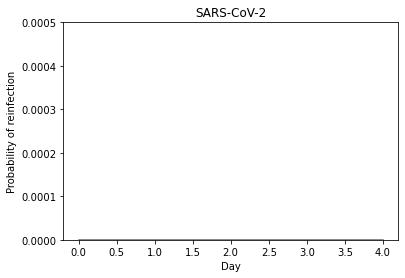

In [262]:
import matplotlib.pyplot as plt17
plt17.plot(sarscov2probreinfection)
plt17.ylim(0, 0.0005)
plt17.xlabel("Day")
plt17.ylabel("Probability of reinfection")
plt17.title('SARS-CoV-2') 

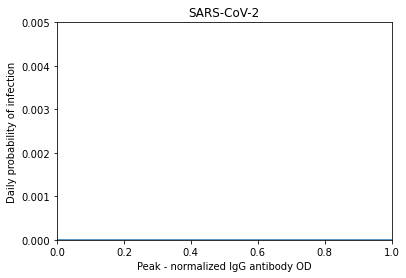

In [263]:
import matplotlib.pyplot as plt17

f17 = plt17.figure()
plt17.plot(sarscov2probreinfection)

plt17.ylim(0,0.005)
plt17.xlim(0.0, 1.0)
plt17.xlabel("Peak - normalized IgG antibody OD")
plt17.ylabel("Daily probability of infection")
plt17.title('SARS-CoV-2')
plt17.show()

f17.savefig("SARS-CoV-2_PrInf-by-nOD" + str(datetime.now().strftime('%Y_%m_%d_%H_%M_%S')) + ".pdf", bbox_inches='tight')